In [1]:
import pandas as pd
import numpy as np
import pandas_datareader as dr
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm
import deni_kit as erk
import scipy.stats
import seaborn as sns
import yfinance as yf
from yahoofinancials import YahooFinancials
#import trendet
import csv
import matplotlib.ticker as mtick
import urllib
import os
import talib as ta
import investpy
from investpy import get_stock_historical_data
from statistics import *
from statistics import mean, median, mode, stdev
#from statistics import mean
from unidecode import unidecode
import string
import plotly.express as px
#from mplfinance import candlestick2_ohlc
import matplotlib.dates as mdates
from matplotlib.dates import date2num
#for checking factorability
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
from factor_analyzer.factor_analyzer import calculate_kmo
from scipy.optimize import minimize #for solving optmization
from sklearn.linear_model import LinearRegression #for solving linear regression
import warnings
warnings.filterwarnings('ignore') #to suppress warning messages
from datetime import datetime, timedelta
from sklearn import cluster, covariance, manifold
from matplotlib.collections import LineCollection #for plotting purposes
#from Graphical_Analysis_functionsimport *
from sklearn.preprocessing import MinMaxScaler
from sklearn import neighbors
from sklearn.model_selection import GridSearchCV
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.arima.model import ARIMA
scaler = MinMaxScaler(feature_range=(0, 1))
from keras.models import Sequential, load_model
from keras.layers import LSTM, Dense, Dropout
# import fastbook
# fastbook.setup_book()
# import fastai
# from fastai.tabular.all import *
# from pmdarima.arima import auto_arima
# from keras.models import Sequential
# from keras.layers import Dense, Dropout, LSTM
import scipy

import datetime as dt
import time

import fundamentalanalysis as fa
api_key_fa = 'f1b920a6f757cde91d22aff5940cab2c' # Denicin key

# Plotly tools
import plotly.graph_objects as go
import plotly.offline as offline
from jupyterthemes import jtplot
offline.init_notebook_mode()
jtplot.style()
jtplot.style(theme=None, context='notebook', ticks=False, grid=False)
plt.close("all")
from plotly.offline import init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
from plotly import tools
import plotly.tools as tls
import plotly.express as px
init_notebook_mode(connected=True)
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)
from jupyterthemes import jtplot
jtplot.style()
jtplot.style(theme=None, context='notebook', ticks=False, grid=False)
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import datetime

In [88]:
# Set the display format for numeric columns in the DataFrame
#pd.options.display.float_format = '{:,.2f}'.format
#'{:.2f}%'.format(volatility)

#print(f'Latest news for \033[1m\033[4m{symbol}\033[0m:')
#display(HTML(html_table))

# Stocks versus Bonds
# When stocks are on the rise, investors generally move out of bonds and flock to the booming stock market
# When the stock market corrects, as it inevitably does, or when severe economic problems ensue,
# investors seek the safety of bonds. As with any free-market economy, bond prices are affected by supply and demand.

# TEHNICAL ANALYSYS OF FINANCIAL MARKETS

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
Listed signals are for the last 1 day of instrument with a symbol: ['^N225']


Date,2023-12-13 00:00:00
Open,32973.468750
High,33104.468750
Low,32864.378906
Close,32940.960938
Adj Close,32940.960938
Volume,0
Dividends,0.000000
Stock Splits,0.000000
1D return,0.002961
1M return,nan


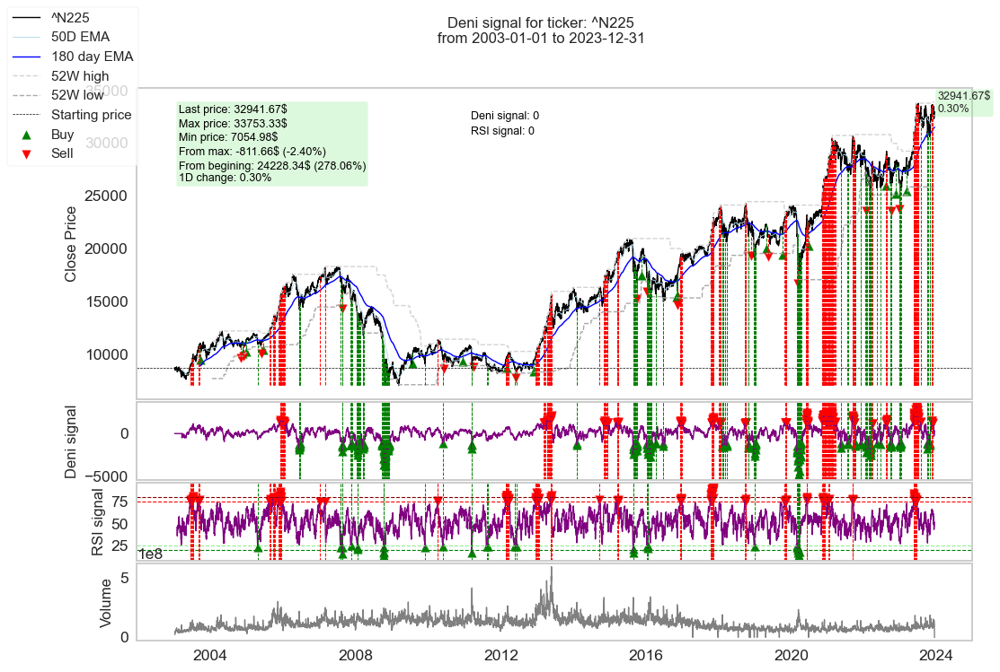

In [3]:
"""
['AAPL'], ['META'], ['TSLA'], ['TWTR'], ['MSFT'], ['NKE'], (['JPM']= JP Morgan), (['CS'] = Credit Swiss), (['UBS'] = UBS Group),
(['CL=F']= crude oil), (['GC=F']= gold), (['TRY=X']= Turkish Lira)
(['^FVX'] = Treasure Yield 5 Years), (['^TNX'] = Treasury Yield 10 Years), (['^TYX'] = Treasury Yield 30 Years), (['^IXIC'] = NASDAQ Composite)
'USDRUB=X', 'EURUSD=X'
'^DJI' = Dow Jones Industrial Average, '^GSPC' = S&P500, '^N225' = Nikkei, '^NYA' = NYSE, '^IXIC' = NASDAQ Composite
(['^FVX'] = Treasure Yield 5 Years)
(['^TNX'] = Treasury Yield 10 Years)
(['^TYX'] = Treasury Yield 30 Years)

(['^SPX'´] = S&P 500 Index (options)

(['^IXIC'] = NASDAQ Composite)

(['^YHQ'] = Yahoo)

(['^VIX'] = Volatility index S&P500), not tradeble

"""
ticker = ['^N225']

start = '2003-01-01'
#start = '2023-05-04'

#end = datetime.date.today()
end = '2023-12-31'
interval = '1d'

erk.deni_trading_signal_plot_multiple_tickers_cont(ticker, start, end, interval) # prethodna verzija je bila bez ovog _cont
erk.deni_trading_signal_table_multiple_tickers(ticker, start, end, interval).style.applymap(erk.color_signals_field)

a = erk.full_crypto_trading_signals(ticker, start, end, interval)
a.style.applymap(erk.color_signals_field)


In [4]:
df = yf.download(ticker, start, end, interval)
df

[*********************100%%**********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
Date,,,,,,,,
2003-01-06,8669.889648,8761.780273,8669.889648,8713.330078,8713.330078,23300000,0.0,0.0
2003-01-07,8810.740234,8829.059570,8654.519531,8656.500000,8656.500000,48100000,0.0,0.0
2003-01-08,8614.410156,8614.410156,8491.490234,8517.799805,8517.799805,38000000,0.0,0.0
2003-01-09,8440.320312,8498.030273,8400.589844,8497.929688,8497.929688,39500000,0.0,0.0
2003-01-10,8563.379883,8569.849609,8378.179688,8470.450195,8470.450195,49500000,0.0,0.0
...,...,...,...,...,...,...,...,...
2023-12-07,33165.718750,33195.871094,32814.691406,32858.308594,32858.308594,105100000,0.0,0.0
2023-12-08,32600.470703,32604.349609,32205.380859,32307.859375,32307.859375,144200000,0.0,0.0
2023-12-11,32665.089844,32933.078125,32650.099609,32791.800781,32791.800781,105800000,0.0,0.0


In [10]:
a.head(25)

Date,2023-12-06
Open,4586.22998
High,4590.740234
Low,4546.5
Close,4549.339844
Adj Close,4549.339844
Volume,4245680000
Dividends,0.0
Stock Splits,0.0
1D return,-0.003906
1M return,NaN


In [11]:
a.tail(9)

Date,2023-12-06
Deni signal,0
BB signal,0
Aroon signal,0
CCI signal,0
RSI signal,0
MFI signal,0
Upside signal,Sell
% Volume vs 1M av,1.077398
% Volume vs 3M av,1.129938


In [93]:
"""

Sharp Ratio = return of portfolo - risk-free rate / standard deviation of the portfolio’s excess return

The Sharpe ratio compares the return of an investment with its risk. It's a mathematical expression of the insight that excess returns over a period of time may signify more volatility and risk, rather than investing skill.

Economist William F. Sharpe proposed the Sharpe ratio in 1966 as an outgrowth of his work on the capital asset pricing model (CAPM), calling it the reward-to-variability ratio.
Sharpe won the Nobel Prize in economics for his work on CAPM in 1990.

To calculate the Sharpe ratio, investors first subtract the risk-free rate from the portfolio’s rate of return, often using U.S. Treasury bond yields as a proxy for the risk-free rate of return.
Then, they divide the result by the standard deviation of the portfolio’s excess return.

"""

"\n\nSharp Ratio =return of portfolo - risk-free rate / standard deviation of the portfolio’s excess return\n\nThe Sharpe ratio compares the return of an investment with its risk. It's a mathematical expression of the insight that excess returns over a period of time may signify more volatility and risk, rather than investing skill.\n\nEconomist William F. Sharpe proposed the Sharpe ratio in 1966 as an outgrowth of his work on the capital asset pricing model (CAPM), calling it the reward-to-variability ratio. Sharpe won the Nobel Prize in economics for his work on CAPM in 1990.\n\nTo calculate the Sharpe ratio, investors first subtract the risk-free rate from the portfolio’s rate of return, often using U.S. Treasury bond yields as a proxy for the risk-free rate of return.\nThen, they divide the result by the standard deviation of the portfolio’s excess return.\n\n"

In [57]:
ta.SMA(df['Close'])

Date
2003-01-02            NaN
2003-01-03            NaN
2003-01-06            NaN
2003-01-07            NaN
2003-01-08            NaN
                 ...     
2023-11-27    1976.029997
2023-11-28    1979.929997
2023-11-29    1982.989994
2023-11-30    1985.313326
2023-12-01    1988.953324
Length: 5255, dtype: float64

In [7]:
# Create a DataFrame from the signals data
df_signals = pd.DataFrame(a)

# Print the DataFrame
print(df_signals)

Date                 2023-12-12
Open               33107.648438
High               33172.128906
Low                32800.238281
Close              32817.429688
Adj Close          32817.429688
...                         ...
RSI signal                    0
MFI signal                    0
Upside signal              Sell
% Volume vs 1M av           0.0
% Volume vs 3M av           0.0

[61 rows x 1 columns]


In [8]:
signals = {
    '30D MA': ta.SMA(df['Close'], 30),
    '100D MA': ta.SMA(df['Close'], 100),
    '200D MA': ta.SMA(df['Close'], 200),
    '50D EMA': ta.EMA(df['Close'], timeperiod=50),
    '100D EMA': ta.EMA(df['Close'], timeperiod=100),
    '180D EMA': ta.EMA(df['Close'], timeperiod=180),
    'Price-50D EMA': (df['Close'] - ta.EMA(df['Close'], timeperiod=50)).fillna(0),
    'Diff 99th percentile': np.percentile((df['Close'] - ta.EMA(df['Close'], timeperiod=50)).fillna(0), 99, axis=0),
    'Diff 95th percentile': np.percentile((df['Close'] - ta.EMA(df['Close'], timeperiod=50)).fillna(0), 95, axis=0),
    'Diff 90th percentile': np.percentile((df['Close'] - ta.EMA(df['Close'], timeperiod=50)).fillna(0), 90, axis=0),
    'Diff 10th percentile': np.percentile((df['Close'] - ta.EMA(df['Close'], timeperiod=50)).fillna(0), 10, axis=0),
    'Diff 5th percentile': np.percentile((df['Close'] - ta.EMA(df['Close'], timeperiod=50)).fillna(0), 5, axis=0),
    'Diff 1st percentile': np.percentile((df['Close'] - ta.EMA(df['Close'], timeperiod=50)).fillna(0), 1, axis=0),
    '52 week high': ta.MAX(df['Close'], timeperiod=252),
    '52 week low': ta.MIN(df['Close'], timeperiod=252),
    'RSI': ta.RSI(df['Close'], timeperiod=14)
}

# Create a DataFrame from the signals data
df_signals = pd.DataFrame(signals)

# Print the DataFrame
df_signals

,30D MA,100D MA,200D MA,50D EMA,100D EMA,180D EMA,Price-50D EMA,Diff 99th percentile,Diff 95th percentile,Diff 90th percentile,Diff 10th percentile,Diff 5th percentile,Diff 1st percentile,52 week high,52 week low,RSI
Date,,,,,,,,,,,,,,,,
2003-01-06,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,1955.36893,1167.536676,912.672264,-709.106281,-1080.639606,-1913.659822,NaN,NaN,NaN
2003-01-07,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,1955.36893,1167.536676,912.672264,-709.106281,-1080.639606,-1913.659822,NaN,NaN,NaN
2003-01-08,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,1955.36893,1167.536676,912.672264,-709.106281,-1080.639606,-1913.659822,NaN,NaN,NaN
2003-01-09,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,1955.36893,1167.536676,912.672264,-709.106281,-1080.639606,-1913.659822,NaN,NaN,NaN
2003-01-10,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,1955.36893,1167.536676,912.672264,-709.106281,-1080.639606,-1913.659822,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-06,32585.766406,32371.013496,31063.151396,32607.549467,32186.852381,31417.787617,838.348970,1955.36893,1167.536676,912.672264,-709.106281,-1080.639606,-1913.659822,33753.328125,25716.859375,57.939438
2023-12-07,32645.631706,32380.157285,31089.933643,32617.383159,32200.148544,31433.704976,240.925435,1955.36893,1167.536676,912.672264,-709.106281,-1080.639606,-1913.659822,33753.328125,25716.859375,49.477278
2023-12-08,32680.229687,32379.042578,31112.990742,32605.244971,32202.281432,31443.364140,-297.385596,1955.36893,1167.536676,912.672264,-709.106281,-1080.639606,-1913.659822,33753.328125,25716.859375,43.123289


In [97]:
df.Close, start

(Date
 2003-12-01    1.196501
 2003-12-02    1.208897
 2003-12-03    1.212298
 2003-12-04    1.208094
 2003-12-05    1.218695
                 ...   
 2023-11-20    1.090703
 2023-11-21    1.094595
 2023-11-22    1.091822
 2023-11-23    1.089087
 2023-11-24    1.090631
 Name: Close, Length: 5186, dtype: float64,
 '2003-01-01')

# DATA

In [8]:
df.info(), ticker

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5271 entries, 2003-01-02 to 2023-12-08
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Open          5271 non-null   float64
 1   High          5271 non-null   float64
 2   Low           5271 non-null   float64
 3   Close         5271 non-null   float64
 4   Adj Close     5271 non-null   float64
 5   Volume        5271 non-null   int64  
 6   Dividends     5271 non-null   float64
 7   Stock Splits  5271 non-null   float64
dtypes: float64(7), int64(1)
memory usage: 370.6 KB


(None, ['AAPL'])

In [99]:
df.head()

,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
Date,,,,,,,,
2003-12-01,1.203398,1.204007,1.194401,1.196501,1.196501,0,0.0,0.0
2003-12-02,1.196101,1.210903,1.194600,1.208897,1.208897,0,0.0,0.0
2003-12-03,1.209000,1.213003,1.207700,1.212298,1.212298,0,0.0,0.0
2003-12-04,1.212004,1.214403,1.204398,1.208094,1.208094,0,0.0,0.0
2003-12-05,1.207802,1.219096,1.206593,1.218695,1.218695,0,0.0,0.0


In [5]:
df.tail()

,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
Date,,,,,,,,
2023-12-07,33165.718750,33195.871094,32814.691406,32858.308594,32858.308594,105100000,0.0,0.0
2023-12-08,32600.470703,32604.349609,32205.380859,32307.859375,32307.859375,144200000,0.0,0.0
2023-12-11,32665.089844,32933.078125,32650.099609,32791.800781,32791.800781,105800000,0.0,0.0
2023-12-12,33107.648438,33172.128906,32800.238281,32843.699219,32843.699219,98100000,0.0,0.0
2023-12-13,32973.468750,33104.468750,32864.378906,32943.320312,32943.320312,0,0.0,0.0


In [101]:
df.columns, ticker

(Index(['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'Dividends',
        'Stock Splits'],
       dtype='object'),
 ['EURUSD=X'])

In [9]:
excel_file_path = f'Signals_{ticker}.xlsx'

# Create an Excel writer object
with pd.ExcelWriter(excel_file_path, engine='xlsxwriter') as writer:
    # Write each statement to a separate sheet
    df.to_excel(writer, sheet_name='Signals', index=True)

print(f"Signals saved to {excel_file_path}")

Signals saved to Signals_['^N225'].xlsx


In [103]:
df_some = df[['Open', 'High', 'Low', 'Close']]
df_some

,Open,High,Low,Close
Date,,,,
2003-12-01,1.203398,1.204007,1.194401,1.196501
2003-12-02,1.196101,1.210903,1.194600,1.208897
2003-12-03,1.209000,1.213003,1.207700,1.212298
2003-12-04,1.212004,1.214403,1.204398,1.208094
2003-12-05,1.207802,1.219096,1.206593,1.218695
...,...,...,...,...
2023-11-20,1.090703,1.094511,1.089800,1.090703
2023-11-21,1.094595,1.096732,1.092299,1.094595
2023-11-22,1.091822,1.092252,1.085458,1.091822


In [5]:
df.drop(['Volume', 'Dividends', 'Stock Splits', 'Adj Close'], axis = 1)

,Open,High,Low,Close
Date,,,,
2003-01-06,8669.889648,8761.780273,8669.889648,8713.330078
2003-01-07,8810.740234,8829.059570,8654.519531,8656.500000
2003-01-08,8614.410156,8614.410156,8491.490234,8517.799805
2003-01-09,8440.320312,8498.030273,8400.589844,8497.929688
2003-01-10,8563.379883,8569.849609,8378.179688,8470.450195
...,...,...,...,...
2023-12-06,32928.921875,33452.128906,32914.089844,33445.898438
2023-12-07,33165.718750,33195.871094,32814.691406,32858.308594
2023-12-08,32600.470703,32604.349609,32205.380859,32307.859375


In [6]:
print('Percentage (%) of missing values is:\n',(df.isnull().sum()/df.shape[0]*100).round(2).sort_values(ascending=False).head(10))

Percentage (%) of missing values is:
 Open            0.0
High            0.0
Low             0.0
Close           0.0
Adj Close       0.0
Volume          0.0
Dividends       0.0
Stock Splits    0.0
dtype: float64


In [106]:
df.fillna(df.median().round(2), inplace=True)

In [12]:
# Set the display format for numeric columns in the DataFrame
pd.options.display.float_format = '{:,.2f}'.format

In [14]:
# Element Wise Logical (OR) 
# df[(condition1) | (condition2)]
df_or = df[(df.Close < 25000) | (df.High == 189.589996) | (df.Volume < 10000000)]
df_or.tail(25)

,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
Date,,,,,,,,
2020-10-09,"23,713.86","23,725.58","23,552.73","23,619.69","23,619.69",56100000,0.00,0.00
2020-10-12,"23,588.74","23,597.91","23,501.26","23,558.69","23,558.69",44900000,0.00,0.00
2020-10-13,"23,667.90","23,667.90","23,490.95","23,601.78","23,601.78",47200000,0.00,0.00
2020-10-14,"23,545.66","23,656.70","23,518.81","23,626.73","23,626.73",54000000,0.00,0.00
2020-10-15,"23,548.45","23,581.16","23,458.43","23,507.23","23,507.23",48300000,0.00,0.00
2020-10-16,"23,478.40","23,538.74","23,382.67","23,410.63","23,410.63",48100000,0.00,0.00
2020-10-19,"23,543.69","23,707.16","23,543.69","23,671.13","23,671.13",46300000,0.00,0.00
2020-10-20,"23,587.87","23,674.87","23,518.29","23,567.04","23,567.04",48700000,0.00,0.00
2020-10-21,"23,615.52","23,702.30","23,611.33","23,639.46","23,639.46",53300000,0.00,0.00


In [17]:
# & 
# df[(condition1) & (condition2)] 
df_and = df[(df.Close > 33000) & (df.Volume > 10000)] # & (df.Close == 250) 
df_and

,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
Date,,,,,,,,
2023-06-13,"32,668.95","33,127.36","32,638.21","33,018.65","33,018.65",89500000,0.00,0.00
2023-06-14,"33,331.47","33,665.52","33,203.95","33,502.42","33,502.42",111600000,0.00,0.00
2023-06-15,"33,493.69","33,767.13","33,386.01","33,485.49","33,485.49",105800000,0.00,0.00
2023-06-16,"33,399.15","33,772.76","33,186.93","33,706.08","33,706.08",132000000,0.00,0.00
2023-06-19,"33,768.69","33,772.89","33,231.56","33,370.42","33,370.42",82900000,0.00,0.00
2023-06-20,"33,269.57","33,474.74","33,089.02","33,388.91","33,388.91",82400000,0.00,0.00
2023-06-21,"33,200.63","33,657.87","33,154.68","33,575.14","33,575.14",82000000,0.00,0.00
2023-06-22,"33,438.01","33,641.46","33,232.19","33,264.88","33,264.88",94700000,0.00,0.00
2023-06-28,"32,807.84","33,193.99","32,642.87","33,193.99","33,193.99",91100000,0.00,0.00


In [18]:
# Volume max
df_vol_max = df.Volume.max()
df_vol_max

595200000

In [19]:
# Volume min
df_vol_min = df.Volume.min()
df_vol_min

0

In [9]:
df_volume = df[df['Volume'] > 200000]
df_volume.head(25)

,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
Date,,,,,,,,
2003-01-02,0.256429,0.266429,0.256250,0.264286,0.224030,181428800,0.0,0.0
2003-01-03,0.264286,0.266607,0.260536,0.266071,0.225543,147453600,0.0,0.0
2003-01-06,0.268393,0.274643,0.265714,0.266071,0.225543,390532800,0.0,0.0
2003-01-07,0.264107,0.267857,0.258393,0.265179,0.224787,342344800,0.0,0.0
2003-01-08,0.260357,0.262679,0.257857,0.259821,0.220245,229644800,0.0,0.0
2003-01-09,0.261071,0.266429,0.258929,0.262143,0.222213,215252800,0.0,0.0
2003-01-10,0.260357,0.264643,0.258750,0.262857,0.222819,175100800,0.0,0.0
2003-01-13,0.266071,0.266071,0.256429,0.261250,0.221456,178942400,0.0,0.0
2003-01-14,0.262321,0.264643,0.258750,0.260893,0.221154,186860800,0.0,0.0


In [7]:
# The last 30 days
# Row before comma, column after the comma
df.iloc[-30:, 1:6]

,High,Low,Close,Adj Close,Volume
Date,,,,,
2023-10-31,30973.660156,30552.650391,30858.849609,30858.849609,134300000
2023-11-01,31601.650391,31301.509766,31601.650391,31601.650391,130100000
2023-11-02,32087.130859,31878.359375,31949.890625,31949.890625,121100000
2023-11-06,32766.539062,32395.500000,32708.480469,32708.480469,139400000
2023-11-07,32591.109375,32250.929688,32271.820312,32271.820312,106700000
2023-11-08,32512.169922,32049.339844,32166.480469,32166.480469,156200000
2023-11-09,32723.710938,32193.199219,32646.460938,32646.460938,115500000
2023-11-10,32598.929688,32248.240234,32568.109375,32568.109375,111300000
2023-11-13,32913.308594,32499.279297,32585.109375,32585.109375,90600000


In [114]:
# Last Closing price
df.iloc[-1:, 3], ticker

(Date
 2023-11-24   1.09
 Name: Close, dtype: float64,
 ['EURUSD=X'])

# RETURNS

In [8]:
returns = df['Close'].pct_change().dropna()
round(returns.describe(), 4)

count    5128.0000
mean        0.0004
std         0.0142
min        -0.1141
25%        -0.0065
50%         0.0007
75%         0.0079
max         0.1415
Name: Close, dtype: float64

# MEANS

In [10]:
"""
Calculate the geometric mean of returns
In mathematics and statistics, the summary that describes the whole data set values can be easily described with the help of measures of central tendencies.
The most important measures of central tendencies are mean, median, mode and the range. Among these, the mean of the data set will provide the overall idea of the data.
The mean defines the average of numbers. The different types of mean are Arithmetic Mean (AM), Geometric Mean (GM) and Harmonic Mean (HM).

The harmonic mean is one of several kinds of average, and in particular, one of the Pythagorean means. It is sometimes appropriate for situations when the average rate is desired.[1]

The harmonic mean can be expressed as the reciprocal of the arithmetic mean of the reciprocals of the given set of observations.
The Harmonic Mean (HM) is defined as the reciprocal of the average of the reciprocals of the data values.
It is based on all the observations, and it is rigidly defined. Harmonic mean gives less weightage to the large values and large weightage to the small values to balance the values correctly.
In general, the harmonic mean is used when there is a necessity to give greater weight to the smaller items. It is applied in the case of times and average rates.

"""

'\nCalculate the geometric mean of returns\nIn mathematics and statistics, the summary that describes the whole data set values can be easily described with the help of measures of central tendencies.\nThe most important measures of central tendencies are mean, median, mode and the range. Among these, the mean of the data set will provide the overall idea of the data.\nThe mean defines the average of numbers. The different types of mean are Arithmetic Mean (AM), Geometric Mean (GM) and Harmonic Mean (HM).\n\nThe harmonic mean is one of several kinds of average, and in particular, one of the Pythagorean means. It is sometimes appropriate for situations when the average rate is desired.[1]\n\nThe harmonic mean can be expressed as the reciprocal of the arithmetic mean of the reciprocals of the given set of observations.\nThe Harmonic Mean (HM) is defined as the reciprocal of the average of the reciprocals of the data values.\nIt is based on all the observations, and it is rigidly defined.

In [9]:
# The mans
geometric_mean = (1 + returns).prod()**(1/len(returns)) - 1

data = df['Close'].tolist()

def harmonic_mean(numbers):
    return len(numbers) / sum(1/x for x in numbers)

# Calculate the harmonic mean
harmonic_mean_value = harmonic_mean(data)

mean = df.Close.mean()

#print(f'Ticker: {ticker}')
print(f'Mean {ticker}: {mean:.2f}')
print(f'Geometric Mean {ticker}: {geometric_mean * 100:.2%}')
print(f"Harmonic mean {ticker}: {harmonic_mean_value:.2f}")

Mean ['^N225']: 16860.66
Geometric Mean ['^N225']: 2.59%
Harmonic mean ['^N225']: 14438.99


In [ ]:
#returns. describe()

In [ ]:
#price = df['Close']

# GRAPHS

In [10]:
# The last 30 days graph
df.iloc[-100:, 3].iplot(color='firebrick', title=f'The Last 30 Days, {ticker}', xTitle='Date', y='Close', yTitle='Price', colorscale='spectral', legend='')

In [11]:
import plotly.graph_objects as go
import plotly.express as px
import pandas as pd

# Assuming df is your DataFrame and ticker is your stock ticker variable

# Calculate the mean
mean_value = df.iloc[-100:, 3].mean()

# Plot the graph
fig = px.line(df.iloc[-100:], x=df.index[-100:], y='Close', line_shape='linear', title=f'The last 30 days, {ticker}',
              labels={'x': 'Date', 'Close': 'Price'}, color_discrete_sequence=['firebrick'])

# Add mean line
fig.add_trace(go.Scatter(x=df.index[-100:], y=[mean_value]*100, mode='lines', name='Mean', line=dict(color='blue', dash='dash')))

# Update layout
fig.update_layout(legend=dict(orientation="h", yanchor="bottom", y=1.02, xanchor="right", x=1),
                  title=f'The Last 30 Days, {ticker}', xaxis_title='Date', yaxis_title='Price', legend_title_text='')

# Show the plot
fig.show()

In [12]:
# MA 100 and 180 days 
round(df.iloc[-100:, 3].mean(), 2), round(df.iloc[-180:, 3].mean(), 2)

(32387.02, 31589.28)

In [13]:
# Data Visualisation in Data Science
# From the begining graph
df.iplot(color='green', title=f'Close Price Since the Begining, {ticker}', xTitle='Date', y='Close', yTitle='Price', colorscale='spectral', legend='')

In [14]:
#import pandas as pd
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Assuming you have already loaded your DataFrame 'df' and set the 'ticker' variable

# Calculate the mean of the 'Close' column
mean_close = df['Close'].mean()
median_close = df['Close'].median()


# Create a subplot
fig = make_subplots(rows=1, cols=1)

# Add the line trace for the 'Close' column
fig.add_trace(go.Scatter(x=df.index, y=df['Close'], mode='lines', line=dict(color='green'), name='Close'))

# Add the line trace for the mean
fig.add_trace(go.Scatter(x=df.index, y=[mean_close]*len(df), mode='lines', line=dict(color='red', dash='dash'), name='Mean'))
fig.add_trace(go.Scatter(x=df.index, y=[median_close]*len(df), mode='lines', line=dict(color='blue', dash='dash'), name='Median'))

# Update the layout with appropriate titles and settings
fig.update_layout(title=f'Close Price {ticker}, by Nedim Memić, Ph. D.', xaxis_title='Date', yaxis_title='Price', legend_title='', legend=dict(x=0.02, y=0.98))

# Show the plot
fig.show()

In [15]:
#import pandas as pd
#import plotly.graph_objs as go
#from plotly.subplots import make_subplots

# Adding MA 100D

# Calculate the mean of the 'Close' column
mean_close = df['Close'].mean()
median_close = df['Close'].median()

# Calculate the 100-day Moving Average
ma_100d = df['Close'].rolling(window=100).mean()

# Create a subplot
fig = make_subplots(rows=1, cols=1)

# Add the line trace for the 'Close' column
fig.add_trace(go.Scatter(x=df.index, y=df['Close'], mode='lines', line=dict(color='green'), name='Close'))

# Add the line trace for the mean
fig.add_trace(go.Scatter(x=df.index, y=[mean_close]*len(df), mode='lines', line=dict(color='red', dash='dash'), name='Mean'))
fig.add_trace(go.Scatter(x=df.index, y=[median_close]*len(df), mode='lines', line=dict(color='blue', dash='dash'), name='Median'))

# Add the line trace for the 100-day Moving Average
fig.add_trace(go.Scatter(x=df.index, y=ma_100d, mode='lines', line=dict(color='orange', dash='dot'), name='MA100D'))

# Update the layout with appropriate titles and settings
fig.update_layout(title=f'Close price {ticker}, by Nedim Memić, Ph. D.', xaxis_title='Date', yaxis_title='Price', legend_title='', legend=dict(x=0.02, y=0.98))

# Show the plot
fig.show()

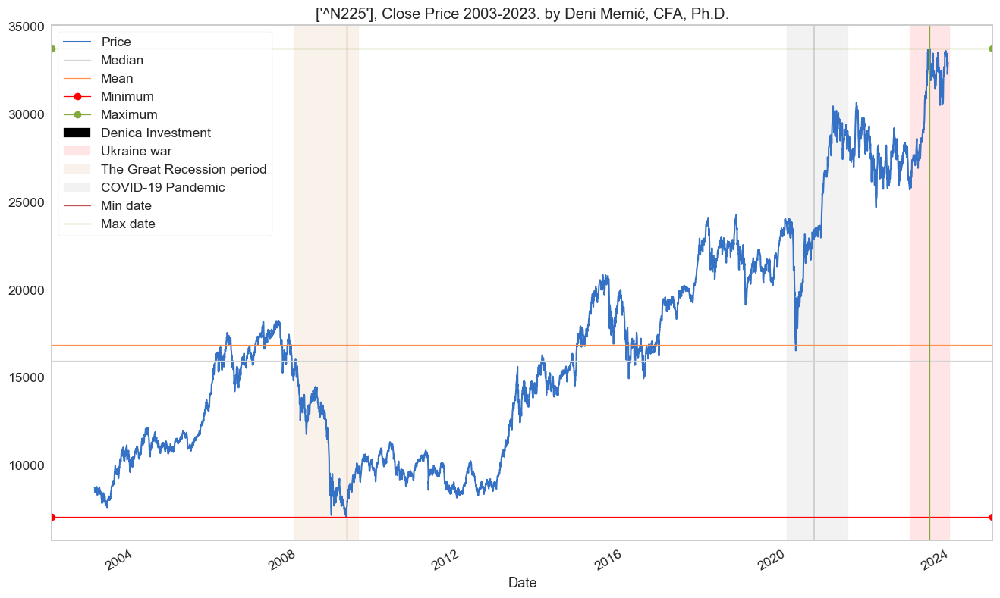

In [17]:
# Mean and median for the total period

"""
maximum = df['2003-01-01':'2023-12-31']['Close'].max()

median = df['2003-01-01':'2023-12-31']['Close'].median()

mean = df['2003-01-01':'2023-12-31']['Close'].mean()

minimum = df['2003-01-01':'2023-12-31']['Close'].min()

"""

# Close price
#maximum, median, mean, minimum = df.loc['2003-01-01':'2023-12-31', 'Close'].agg(['max', 'median', 'mean', 'min'])
maximum, median, mean, minimum = df.loc[start:end, 'Close'].agg(['max', 'median', 'mean', 'min'])



#maximum, median, mean, minimum = df.loc['2003-01-01':'2023-12-31', 'Close'].agg(['max', 'median', 'mean', 'min'])

#period = df['2016': '2017']['Close'].period()
df.loc['2003-01-01':'2023-12-31']['Close'].plot(label='Price')

#plt.figure(figsize=(12,6))

plt.title(f'{ticker}, Close Price 2003-2023. by Deni Memić, CFA, Ph.D.')



plt.axhline(median, c='lightgray', linewidth = 0.9, marker='x', label='Median')
plt.axhline(mean, c='y', linewidth = 0.9, label='Mean')
plt.axhline(minimum, c='red', linewidth = 0.9, marker='o', label='Minimum')
plt.axhline(maximum, c='g', linewidth = 0.9, marker='o', label='Maximum')

# Brisati ova 2 koda
#median_grouped#plt.plot(minimum, marker="o", markersize=12, markeredgecolor="red", markerfacecolor="red")
#plt.plot(maximum, marker="o", markersize=12, markeredgecolor="green", markerfacecolor="green")



#####
#plt.scatter(df.min(), xy=(minimum,maximum), marker = 'x')
#plt.scatter(df.max, c='g', linewidth = 0.9, marker='x', label='Maximum')
#plt.scatter(maximum(), minimum, c='g', marker='x')
#####

#plt.axvspan(date2num(datetime(2020,2,1)), date2num(datetime(2020,4,1)), 
           #label="Covid-19 period",color="red", alpha=0.5)

#plt.axvline('2021-01-06', c='r', label='Jan-2021')


"""
bilo: ax.axvspan(datetime.datetime(2023,1,1), datetime.datetime(2023,12,31),color="gray", alpha=0.1)

sada treba: ax.axvspan(datetime(2023,1,1), datetime(2023,12,31),color="gray", alpha=0.1)

"""

#datetime.datetime = datetime

#plt.axvspan(datetime(2023,1,1), datetime(2023,12,31),color="gray", alpha=0.1, label="Ukraine war")
#plt.axvspan(datetime(2007,12,2), datetime(2009,6,30),color="gray", alpha=0.1,label="The Great Recession period")
#plt.axvspan(datetime(2020,1,1), datetime(2021,6,30),color="gray", alpha=0.1,label="COVID-19 Pandemic")

plt.axvspan(datetime.datetime(2020,9,1), datetime.datetime(2020,9,2),color="black", alpha=1,label="Denica Investment")

"""
plt.axvspan('2007-12-02', '2009-06-30', label="The Great Recession period",color="indianred", alpha=0.5)
plt.axvspan('2020-02-01', '2020-04-01', label="Covid-19 period",color="lightgray", alpha=0.5)
plt.axvspan('2022-02-24', '2023-12-31', label="Ukraine war",color="darkgray", alpha=0.5)
"""

plt.axvspan(datetime.datetime(2023,1,1), datetime.datetime(2023,12,31),color="red", alpha=0.1, label="Ukraine war")
plt.axvspan(datetime.datetime(2007,12,2), datetime.datetime(2009,6,30),color="peru", alpha=0.1,label="The Great Recession period")
plt.axvspan(datetime.datetime(2020,1,1), datetime.datetime(2021,6,30),color="gray", alpha=0.1,label="COVID-19 Pandemic")


#plt.axhline('100D MA', c='b', linewidth=2, marker='o', label='100D MA')


#plt.axvspan(datetime(2023,1,1), datetime(2023,12,31),color="gray", alpha=0.1)
#plt.axvline('2022-03-01', c='g', linewidth = 0.9, label='Max')
#plt.axvline('2003-12-19', c='r', linewidth = 0.9, label='Min Avg')

plt.axvline(df['2003-01-01':'2023-12-31']['Close'].idxmin(), c='r', linewidth = 0.9, label='Min date')
plt.axvline(df['2003-01-01':'2023-12-31']['Close'].idxmax(), c='g', linewidth = 0.9, label='Max date')


#plt.axvline('2021-01-06', c='lightgray', linewidth = 0.9, label='Covid')
#plt.axvline('2022-07-11', c='gray', label='Apr-2022')
#plt.axvline('2021-11-14', c='g', label='May-2022')

plt.rcParams["figure.figsize"] = (16,10)
plt.legend(fontsize=6, loc='lower left')

plt.legend()

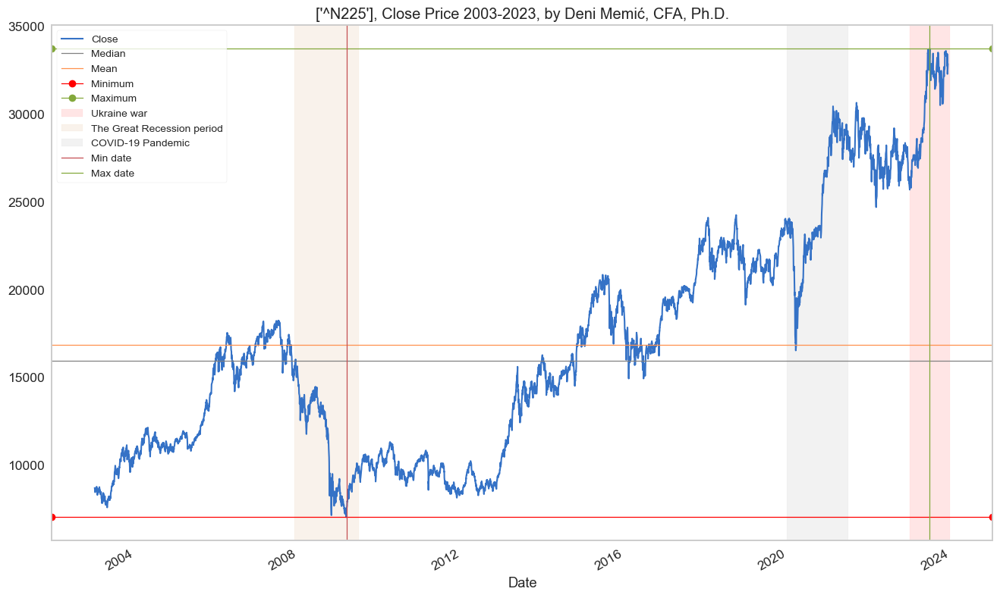

In [33]:
# Optimised by ChartGPT
#maximum, median, mean, minimum = df.loc['2003-01-01':'2023-12-31', 'Close'].agg(['max', 'median', 'mean', 'min'])
maximum, median, mean, minimum = df.loc[start:end, 'Close'].agg(['max', 'median', 'mean', 'min'])



#df.loc['2003-01-01':'2023-12-31']['Close'].plot()
df.loc[start:end]['Close'].plot()


plt.title(f'{ticker}, Close Price 2003-2023, by Deni Memić, CFA, Ph.D.')

plt.axhline(median, c='gray', linewidth=0.9, marker='x', label='Median')
plt.axhline(mean, c='y', linewidth=0.9, label='Mean')
plt.axhline(minimum, c='red', linewidth=0.9, marker='o', label='Minimum')
plt.axhline(maximum, c='g', linewidth=0.9, marker='o', label='Maximum')

plt.axvspan(datetime.datetime(2023,1,1), datetime.datetime(2023,12,31),color="red", alpha=0.1, label="Ukraine war")
plt.axvspan(datetime.datetime(2007,12,2), datetime.datetime(2009,6,30),color="peru", alpha=0.1,label="The Great Recession period")
plt.axvspan(datetime.datetime(2020,1,1), datetime.datetime(2021,6,30),color="gray", alpha=0.1,label="COVID-19 Pandemic")

plt.axvline(df['2003-01-01':'2023-12-31']['Close'].idxmin(), c='r', linewidth=0.9, label='Min date')
plt.axvline(df['2003-01-01':'2023-12-31']['Close'].idxmax(), c='g', linewidth=0.9, label='Max date')

plt.rcParams["figure.figsize"] = (16,10)
plt.legend(fontsize=10, loc='best')

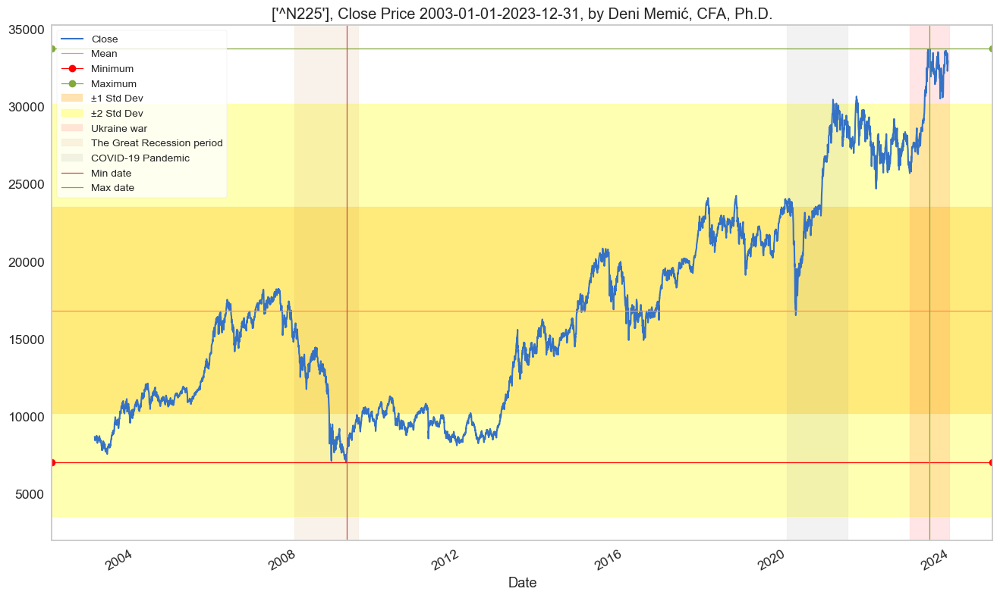

In [18]:


# Assuming you have already loaded your DataFrame 'df' and set the 'ticker' variable
start = '2003-01-01'
end = '2023-12-31'

# Calculate mean, median, and standard deviation of the 'Close' column
mean_value = df.loc[start:end, 'Close'].mean()
std_value = df.loc[start:end, 'Close'].std()

# Create the plot
df.loc[start:end]['Close'].plot()

plt.title(f'{ticker}, Close Price {start}-{end}, by Deni Memić, CFA, Ph.D.')

# Add horizontal lines for mean, minimum, and maximum
plt.axhline(mean_value, c='y', linewidth=0.9, label='Mean')
plt.axhline(df.loc[start:end, 'Close'].min(), c='red', linewidth=0.9, marker='o', label='Minimum')
plt.axhline(df.loc[start:end, 'Close'].max(), c='g', linewidth=0.9, marker='o', label='Maximum')

# Add shaded regions for one and two standard deviations above and below the mean
plt.axhspan(mean_value - std_value, mean_value + std_value, color='orange', alpha=0.3, label='±1 Std Dev')
plt.axhspan(mean_value - 2 * std_value, mean_value + 2 * std_value, color='yellow', alpha=0.3, label='±2 Std Dev')

# Add vertical lines for significant dates
plt.axvspan(datetime.datetime(2023, 1, 1), datetime.datetime(2023, 12, 31), color="red", alpha=0.1, label="Ukraine war")
plt.axvspan(datetime.datetime(2007, 12, 2), datetime.datetime(2009, 6, 30), color="peru", alpha=0.1, label="The Great Recession period")
plt.axvspan(datetime.datetime(2020, 1, 1), datetime.datetime(2021, 6, 30), color="gray", alpha=0.1, label="COVID-19 Pandemic")

# Add vertical lines for min and max dates
plt.axvline(df.loc[start:end, 'Close'].idxmin(), c='r', linewidth=0.9, label='Min date')
plt.axvline(df.loc[start:end, 'Close'].idxmax(), c='g', linewidth=0.9, label='Max date')

plt.rcParams["figure.figsize"] = (16, 10)
plt.legend(fontsize=10, loc='best')
plt.show()

# 1 and 2 Standard deviations are sheded


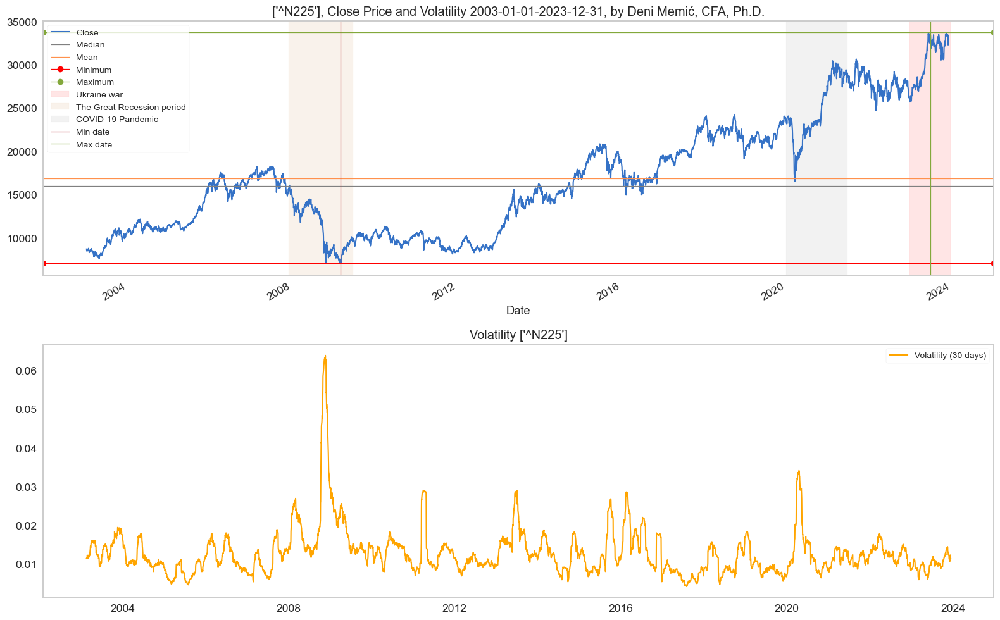

In [19]:
import matplotlib.pyplot as plt
import datetime

# Assuming you have df, ticker, start, and end defined

# Calculate volatility
volatility = df.loc[start:end]['Close'].pct_change().std()

# Main plot
plt.subplot(2, 1, 1)

df.loc[start:end]['Close'].plot()
plt.title(f'{ticker}, Close Price and Volatility {start}-{end}, by Deni Memić, CFA, Ph.D.')

plt.axhline(median, c='gray', linewidth=0.9, marker='x', label='Median')
plt.axhline(mean, c='y', linewidth=0.9, label='Mean')
plt.axhline(minimum, c='red', linewidth=0.9, marker='o', label='Minimum')
plt.axhline(maximum, c='g', linewidth=0.9, marker='o', label='Maximum')

plt.axvspan(datetime.datetime(2023, 1, 1), datetime.datetime(2023, 12, 31), color="red", alpha=0.1, label="Ukraine war")
plt.axvspan(datetime.datetime(2007, 12, 2), datetime.datetime(2009, 6, 30), color="peru", alpha=0.1, label="The Great Recession period")
plt.axvspan(datetime.datetime(2020, 1, 1), datetime.datetime(2021, 6, 30), color="gray", alpha=0.1, label="COVID-19 Pandemic")

plt.axvline(df[start:end]['Close'].idxmin(), c='r', linewidth=0.9, label='Min date')
plt.axvline(df[start:end]['Close'].idxmax(), c='g', linewidth=0.9, label='Max date')

plt.legend(fontsize=10, loc='best')

# Subplot for Volatility
plt.subplot(2, 1, 2)
plt.plot(df.loc[start:end]['Close'].pct_change().rolling(window=30).std(), color='orange', label='Volatility (30 days)')
plt.title(f'Volatility {ticker}')
plt.legend(fontsize=10, loc='best')

plt.rcParams["figure.figsize"] = (16, 12)
plt.tight_layout()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


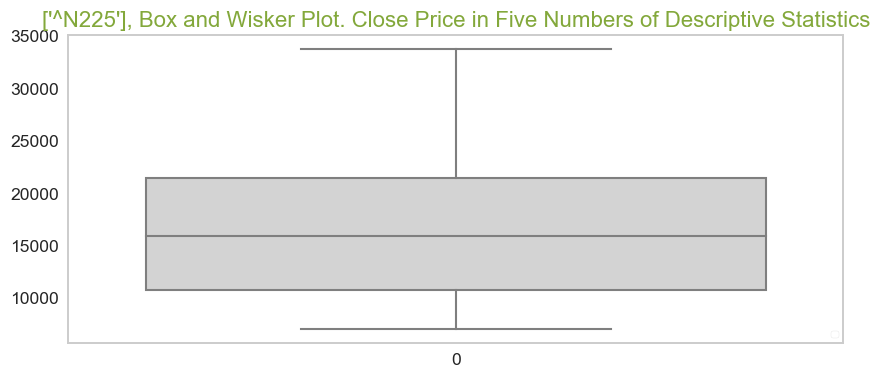

In [20]:
plt.figure(figsize=(10,4))
sns.boxplot(df['Close'],color='lightgray')
plt.title(f'{ticker}, Box and Wisker Plot. Close Price in Five Numbers of Descriptive Statistics', size=16, color='g')

#plt.axvline(Q1, c='r', linewidth = 0.3, label='Q1')
#plt.axvline(Q2, c='r', linewidth = 0.9, label='Q2')
#plt.axvline(Q3, c='g', linewidth = 0.3, label='Q3')
#plt.axvline(Q4, c='g', linewidth = 0.3, label='Q4')

#plt.axvline(Q_1Q, c='b', linewidth = 0.3, label='1st percentile')
#plt.axvline(Q_99Q, c='b', linewidth = 0.3, label='99th percentile')

#plt.legend()

plt.legend(loc='lower right', fontsize=7)

plt.show()
# IQR = +- 1 standard deviation


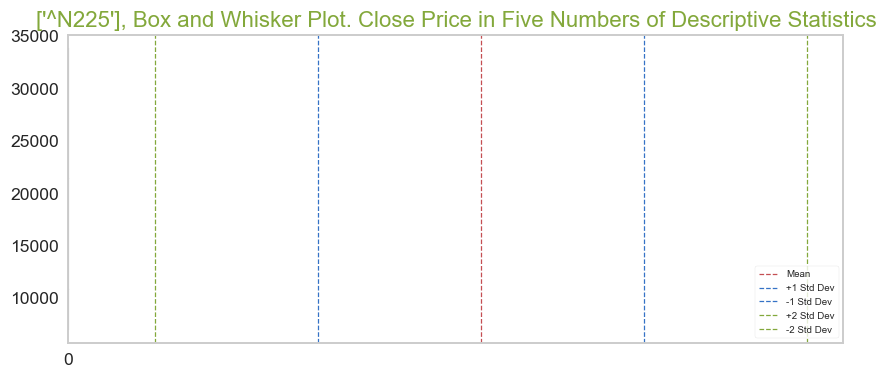

In [37]:

# Assuming you have already loaded your DataFrame 'df' and set the 'ticker' variable

plt.figure(figsize=(10, 4))

# Create a boxplot
sns.boxplot(df['Close'], color='lightgray')

plt.title(f'{ticker}, Box and Whisker Plot. Close Price in Five Numbers of Descriptive Statistics', size=16, color='g')

# Calculate mean and standard deviation
mean_value = df['Close'].mean()
std_value = df['Close'].std()

# Add lines for mean and standard deviations
plt.axvline(mean_value, c='r', linestyle='dashed', linewidth=0.9, label='Mean')
plt.axvline(mean_value + std_value, c='b', linestyle='dashed', linewidth=0.9, label='+1 Std Dev')
plt.axvline(mean_value - std_value, c='b', linestyle='dashed', linewidth=0.9, label='-1 Std Dev')
plt.axvline(mean_value + 2 * std_value, c='g', linestyle='dashed', linewidth=0.9, label='+2 Std Dev')
plt.axvline(mean_value - 2 * std_value, c='g', linestyle='dashed', linewidth=0.9, label='-2 Std Dev')

# Move the legend to the lower right
plt.legend(loc='lower right', fontsize=7)

plt.show()
# Standard deviations


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


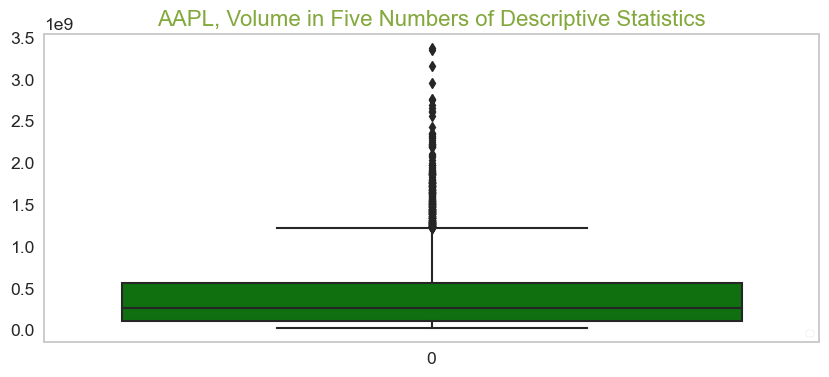

In [25]:
plt.figure(figsize=(10,4))
sns.boxplot(df['Volume'],color='green')
plt.title(f'{ticker}, Volume in Five Numbers of Descriptive Statistics', size=16, color='g')

#plt.axvline(Q1, c='r', linewidth = 0.3, label='Q1')
#plt.axvline(Q2, c='r', linewidth = 0.9, label='Q2')
#plt.axvline(Q3, c='g', linewidth = 0.3, label='Q3')
#plt.axvline(Q4, c='g', linewidth = 0.3, label='Q4')

#plt.axvline(Q_1Q, c='b', linewidth = 0.3, label='1st percentile')
#plt.axvline(Q_99Q, c='b', linewidth = 0.3, label='99th percentile')

#plt.legend()

plt.legend(loc='lower right', fontsize=7)

plt.show()

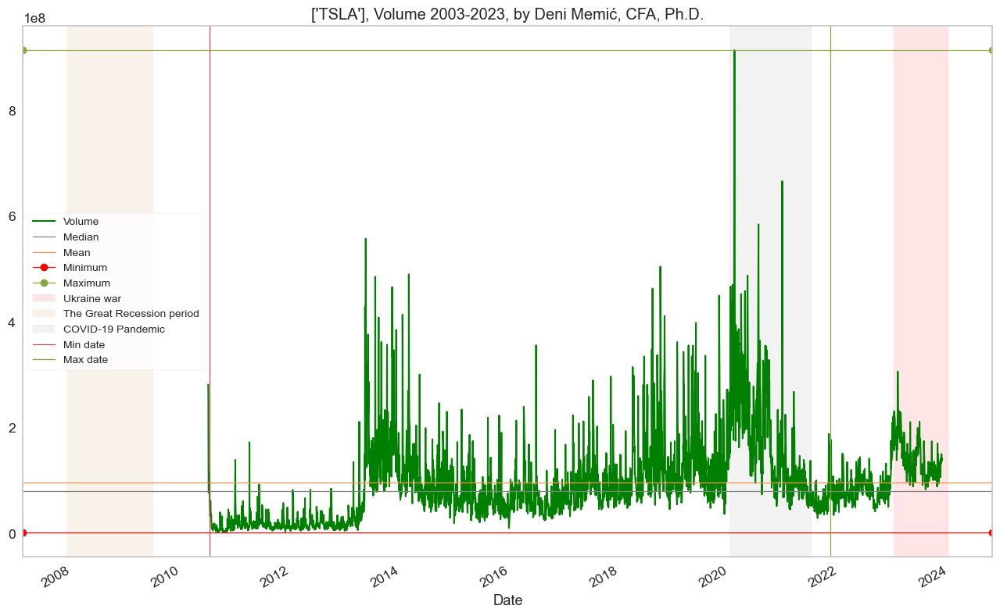

In [ ]:
# Volume
#maximum, median, mean, minimum = df.loc['2003-01-01':'2023-12-31', 'Close'].agg(['max', 'median', 'mean', 'min'])
maximum, median, mean, minimum = df.loc[start:end, 'Volume'].agg(['max', 'median', 'mean', 'min'])



#df.loc['2003-01-01':'2023-12-31']['Close'].plot()
df.loc[start:end]['Volume'].plot(color='green')


plt.title(f'{ticker}, Volume 2003-2023, by Deni Memić, CFA, Ph.D.')

plt.axhline(median, c='gray', linewidth=0.9, marker='x', label='Median')
plt.axhline(mean, c='y', linewidth=0.9, label='Mean')
plt.axhline(minimum, c='red', linewidth=0.9, marker='o', label='Minimum')
plt.axhline(maximum, c='g', linewidth=0.9, marker='o', label='Maximum')

plt.axvspan(datetime.datetime(2023,1,1), datetime.datetime(2023,12,31),color="red", alpha=0.1, label="Ukraine war")
plt.axvspan(datetime.datetime(2007,12,2), datetime.datetime(2009,6,30),color="peru", alpha=0.1,label="The Great Recession period")
plt.axvspan(datetime.datetime(2020,1,1), datetime.datetime(2021,6,30),color="gray", alpha=0.1,label="COVID-19 Pandemic")

plt.axvline(df['2003-01-01':'2023-12-31']['Close'].idxmin(), c='r', linewidth=0.9, label='Min date')
plt.axvline(df['2003-01-01':'2023-12-31']['Close'].idxmax(), c='g', linewidth=0.9, label='Max date')

plt.rcParams["figure.figsize"] = (16,10)
plt.legend(fontsize=10, loc='best')

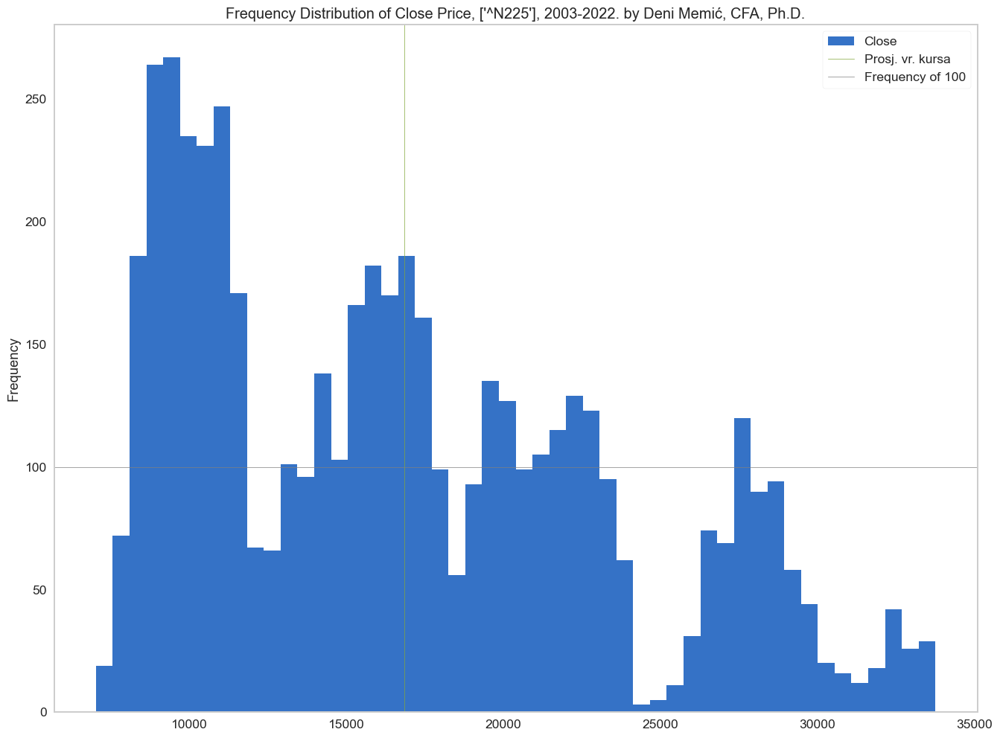

In [38]:
df['Close'].plot.hist(bins = 50, legend = True)

plt.title(f'Frequency Distribution of Close Price, {ticker}, 2003-2022. by Deni Memić, CFA, Ph.D.')

#plt.axvline(median, c='r', linewidth = 0.9, label='Average frequency')
#plt.axvline(median, c='black', linewidth = 0.5, label='Average value')
plt.axvline(mean, c='g', linewidth = 0.5, label='Prosj. vr. kursa')

plt.axhline(100, c='gray', linewidth = 0.5, label='Frequency of 100')

plt.legend()
# IQR = +- 1 standard deviation


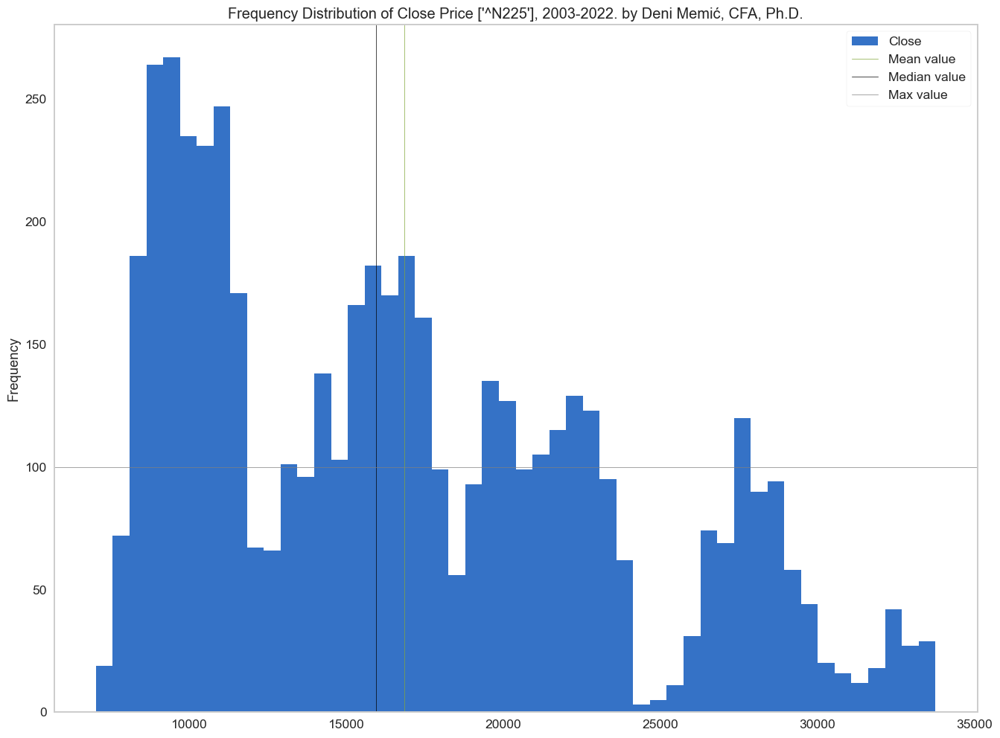

In [21]:
# By Chat GPT

#import pandas as pd
#import matplotlib.pyplot as plt

# Assuming you have already loaded your DataFrame 'df' and set the 'ticker' variable

# Calculate the mean and median of the 'Close' column
mean_val = df['Close'].mean()
median_val = df['Close'].median()

# Create the histogram plot
df['Close'].plot.hist(bins=50, legend=True)

plt.title(f'Frequency Distribution of Close Price {ticker}, 2003-2022. by Deni Memić, CFA, Ph.D.')

# Add vertical lines for mean and median
plt.axvline(mean_val, c='g', linewidth=0.5, label='Mean value')
plt.axvline(median_val, c='black', linewidth=0.5, label='Median value')

# Add a horizontal line for the maximum value (assuming 100 as the max value)
plt.axhline(100, c='gray', linewidth=0.5, label='Max value')

plt.legend()

plt.show()

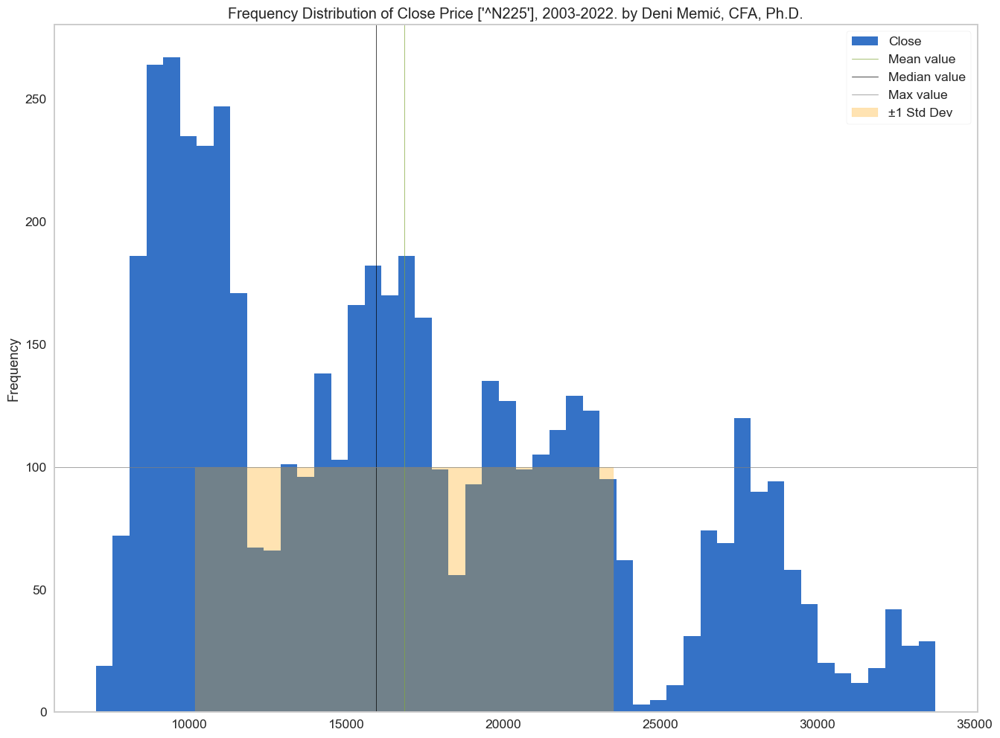

In [22]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you have already loaded your DataFrame 'df' and set the 'ticker' variable

# Calculate the mean, median, and standard deviation of the 'Close' column
mean_val = df['Close'].mean()
median_val = df['Close'].median()
std_val = df['Close'].std()

# Create the histogram plot
df['Close'].plot.hist(bins=50, legend=True)

plt.title(f'Frequency Distribution of Close Price {ticker}, 2003-2022. by Deni Memić, CFA, Ph.D.')

# Add vertical lines for mean and median
plt.axvline(mean_val, c='g', linewidth=0.5, label='Mean value')
plt.axvline(median_val, c='black', linewidth=0.5, label='Median value')

# Add a horizontal line for the maximum value (assuming 100 as the max value)
plt.axhline(100, c='gray', linewidth=0.5, label='Max value')

# Add shaded region for one standard deviation above and below the mean
plt.fill_betweenx(y=[0, 100], x1=mean_val - std_val, x2=mean_val + std_val, color='orange', alpha=0.3, label='±1 Std Dev')

plt.legend()

plt.show()

# 1 Standard deviation above and below the mean value is shaded


In [41]:
df.Close.iplot(kind='hist', title= f'{ticker}', colorscale='spectral', size=True, legend='') # color='blue'

In [23]:
# Calculate mean value
mean_value = df['Close'].mean()

# Create histogram with mean line using Plotly Express
fig = px.histogram(df, x='Close', title=f'Frequency Distribution of Close Price {ticker}', color_discrete_sequence=['lightgray'], marginal='box',
                   labels={'Close': 'Close Price'}, nbins=20)

# Add mean line to the figure
fig.add_shape(
    go.layout.Shape(
        type='line',
        x0=mean_value,
        x1=mean_value,
        y0=0,
        y1=1,
        yref='paper',
        line=dict(color='red', width=1)
    )
)

# Show the plot
fig.show()

In [24]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

# Assuming you have already loaded your DataFrame 'df' and set the 'ticker' variable

# Calculate mean, median, and standard deviation of the 'Close' column
mean_value = df['Close'].mean()
median_value = df['Close'].median()
std_value = df['Close'].std()

# Create histogram with mean line using Plotly Express
fig = px.histogram(df, x='Close', title=f'Frequency Distribution of Close Price {ticker}', color_discrete_sequence=['lightgray'], marginal='box',
                   labels={'Close': 'Close Price'}, nbins=20)

# Add mean line to the figure
fig.add_shape(
    go.layout.Shape(
        type='line',
        x0=mean_value,
        x1=mean_value,
        y0=0,
        y1=1,
        yref='paper',
        line=dict(color='red', width=1)
    )
)

# Add shaded regions for one standard deviation above and below the mean
fig.update_layout(
    shapes=[
        go.layout.Shape(
            type='rect',
            x0=mean_value - std_value,
            x1=mean_value + std_value,
            y0=0,
            y1=1,
            yref='paper',
            line=dict(color='orange', width=0),
            fillcolor='orange',
            opacity=0.3
        )
    ]
)

# Show the plot
fig.show()
# One standard deviation + and - is shaded


In [25]:


# Calculate mean, median, and standard deviation of the 'Close' column
mean_value = df['Close'].mean()
median_value = df['Close'].median()
std_value = df['Close'].std()

# Create histogram with mean line using Plotly Express
fig = px.histogram(df, x='Close', title=f'Frequency Distribution of Close Price {ticker}', color_discrete_sequence=['lightgray'], marginal='box',
                   labels={'Close': 'Close Price'}, nbins=20)

# Add mean line to the figure
fig.add_shape(
    go.layout.Shape(
        type='line',
        x0=mean_value,
        x1=mean_value,
        y0=0,
        y1=1,
        yref='paper',
        line=dict(color='red', width=1)
    )
)

# Add shaded regions for one and two standard deviations above and below the mean
fig.update_layout(
    shapes=[
        go.layout.Shape(
            type='rect',
            x0=mean_value - std_value,
            x1=mean_value + std_value,
            y0=0,
            y1=1,
            yref='paper',
            line=dict(color='orange', width=0),
            fillcolor='orange',
            opacity=0.3
        ),
        go.layout.Shape(
            type='rect',
            x0=mean_value - 2 * std_value,
            x1=mean_value + 2 * std_value,
            y0=0,
            y1=1,
            yref='paper',
            line=dict(color='yellow', width=0),
            fillcolor='yellow',
            opacity=0.3
        )
    ]
)

# Show the plot
fig.show()
# Two standard deviations + and - are shaded

In [27]:
# Create a regular plot with polar-like appearance
"""
Radial Axis: The radial axis in this plot represents the 'Close' prices. Each point on the radial axis corresponds to a specific 'Close' price.

Angle: The angles around the circle represent different data points. In this case, each angle corresponds to a different time point or index in your DataFrame.

Shape of the Plot: Patterns or shapes in the plot may indicate trends or cycles in the data. For example, if you observe a consistent increase or decrease in 'Close' prices as you move around the circle, it could suggest a trend.

Outliers: Outliers or extreme values may be noticeable as spikes or deviations from the general pattern.

Direction: The direction in which the plot moves around the circle can provide information. For instance, a clockwise movement might indicate an increase in 'Close' prices over time.

"""

plt.figure(figsize=(8, 8))

# Convert 'Close' prices to numeric values for the radial axis
radial_values = df['Close'].values

x = df.Date

# Plot the radial values against angles
angles = np.linspace(0, 2 * np.pi, len(df), endpoint=False)
angles = np.concatenate((angles, [angles[0]]))  # Connect the plot
radial_values = np.concatenate((radial_values, [radial_values[0]]))  # Connect the plot
plt.polar(angles, radial_values)

plt.title(f'Polar-Like Plot of Close Prices {ticker}')
plt.show()


AttributeError: 'DataFrame' object has no attribute 'Date'

<Figure size 800x800 with 0 Axes>

In [22]:
datetime()

TypeError: function missing required argument 'year' (pos 1)

In [32]:

import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime, timedelta

# Assuming 'datetime' is the column containing date values in your DataFrame
df['Date'] = pd.to_date(df['Date'])
df = df.sort_values('datetime')  # Sort DataFrame by date if it's not already sorted

plt.figure(figsize=(8, 8))

# Convert 'Close' prices to numeric values for the radial axis
radial_values = df['Close'].values

# Use the 'datetime' column as x-axis values
dates = df['Date']
angles = np.linspace(0, 2 * np.pi, len(dates), endpoint=False)
angles = np.concatenate((angles, [angles[0]]))  # Connect the plot
radial_values = np.concatenate((radial_values, [radial_values[0]]))  # Connect the plot
plt.polar(angles, radial_values)

# Set x-ticks to represent dates
plt.xticks(angles[:-1], dates.strftime('%Y-%m-%d'))

plt.title(f'Polar-Like Plot of Close Prices {ticker}')
plt.show()


AttributeError: module 'pandas' has no attribute 'to_date'

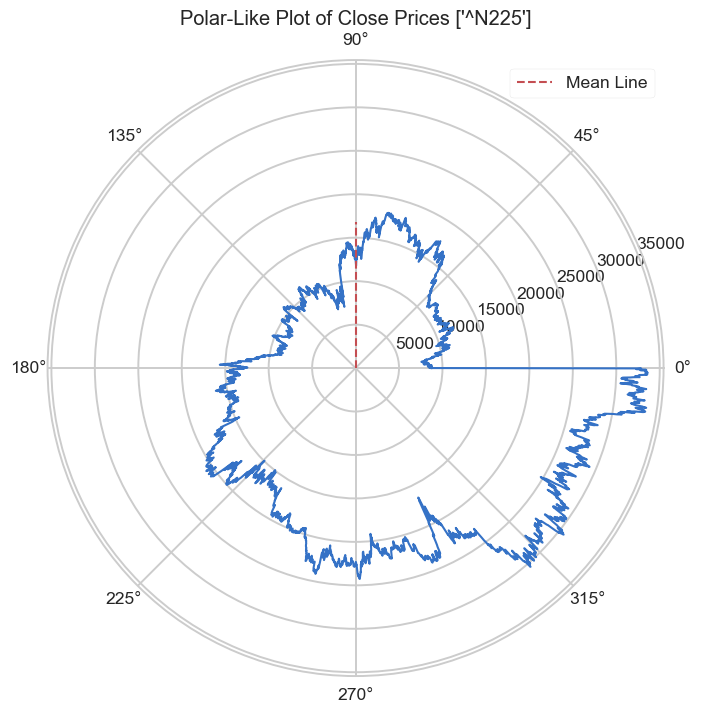

In [47]:
import numpy as np
import matplotlib.pyplot as plt

# Your data
# df = ...

# Convert 'Close' prices to numeric values for the radial axis
radial_values = df['Close'].values

# Plot the radial values against angles
angles = np.linspace(0, 2 * np.pi, len(df), endpoint=False)
angles = np.concatenate((angles, [angles[0]]))  # Connect the plot
radial_values = np.concatenate((radial_values, [radial_values[0]]))  # Connect the plot

# Plot the polar-like plot
plt.figure(figsize=(8, 8))
plt.polar(angles, radial_values)

# Calculate the mean of 'Close' prices
mean_close = np.mean(df['Close'])

# Add a mean line
plt.polar([0, np.arctan2(mean_close, 0)], [0, np.sqrt(mean_close**2)], 'r--', label='Mean Line')

# Set the title and show the plot
plt.title(f'Polar-Like Plot of Close Prices {ticker}')
plt.legend()
plt.show()


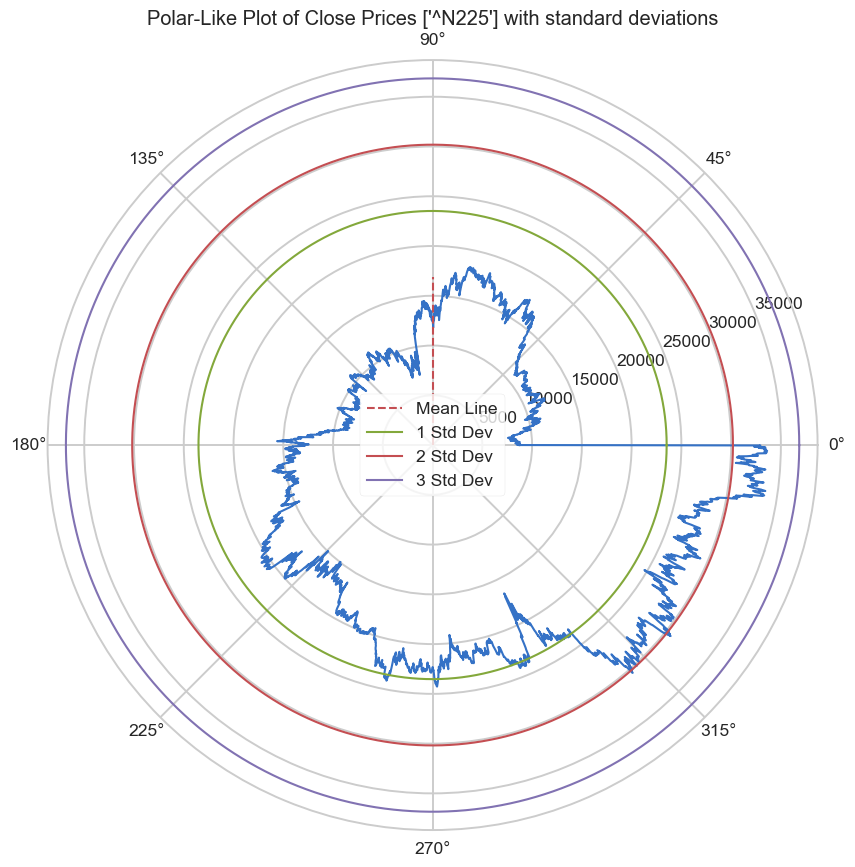

In [47]:
# Convert 'Close' prices to numeric values for the radial axis
radial_values = df['Close'].values

# Plot the radial values against angles
angles = np.linspace(0, 2 * np.pi, len(df), endpoint=False)
angles = np.concatenate((angles, [angles[0]]))  # Connect the plot

radial_values = np.concatenate((radial_values, [radial_values[0]]))  # Connect the plot

# Plot the polar-like plot
plt.figure(figsize=(16, 10))
plt.polar(angles, radial_values)

# Calculate the mean and standard deviation of 'Close' prices
mean_close = np.mean(df['Close'])
std_close = np.std(df['Close'])

# Add a mean line
plt.polar([0, np.arctan2(mean_close, 0)], [0, np.sqrt(mean_close**2)], 'r--', label='Mean Line')

# Add lines for 1, 2 and 3 standard deviations
for i in range(1, 4):
    std_line = mean_close + i * std_close
    std_line_values = np.full_like(radial_values, std_line)
    plt.polar(angles, std_line_values, label=f'{i} Std Dev')

# Set the title and show the plot
plt.title(f'Polar-Like Plot of Close Prices {ticker} with standard deviations')
plt.legend()
plt.show()


In [53]:
df.iloc[0]

Open            8.669890e+03
High            8.761780e+03
Low             8.669890e+03
Close           8.713330e+03
Adj Close       8.713330e+03
Volume          2.330000e+07
Dividends       0.000000e+00
Stock Splits    0.000000e+00
Name: 2003-01-06 00:00:00, dtype: float64

In [54]:


# Assuming df is your DataFrame
# Sort the DataFrame by index
df = df.sort_index()

# Convert 'Close' prices to numeric values for the radial axis
radial_values = df['Close'].values

# Plot the radial values against angles
angles = np.linspace(0, 2 * np.pi, len(df), endpoint=False)

# Plot the polar-like plot
plt.figure(figsize=(16, 10))
plt.polar(angles, radial_values)

# Calculate the mean and standard deviation of 'Close' prices
mean_close = np.mean(df['Close'])
std_close = np.std(df['Close'])

# Add a mean line
plt.polar([0, np.arctan2(mean_close, 0)], [0, np.sqrt(mean_close**2)], 'r--', label='Mean Line')

# Add lines for 1, 2, and 3 standard deviations
for i in range(1, 4):
    std_line = mean_close + i * std_close
    std_line_values = np.full_like(radial_values, std_line)
    plt.polar(angles, std_line_values, label=f'{i} Std Dev')

# Set the x-axis labels as the index values
plt.xticks(angles, df.index, fontsize=8, rotation=45)

# Set the title and show the plot
plt.title(f'Polar-Like Plot of Close Prices {ticker} with standard deviations')
plt.legend()
plt.show()


KeyboardInterrupt: 

# STATISTICS

In [34]:
df.describe()

,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits
count,5129.000000,5129.000000,5129.000000,5129.000000,5129.000000,5.129000e+03,5129.0,5129.0
mean,16862.665111,16958.449882,16758.235445,16860.657172,16860.657172,1.155740e+08,0.0,0.0
std,6660.445790,6686.462995,6632.254352,6661.913908,6661.913908,5.123173e+07,0.0,0.0
min,7059.770020,7100.770020,6994.899902,7054.979980,7054.979980,0.000000e+00,0.0,0.0
25%,10809.099609,10873.889648,10749.469727,10823.570312,10823.570312,7.600000e+07,0.0,0.0
50%,16002.879883,16108.940430,15859.459961,15969.400391,15969.400391,1.097000e+08,0.0,0.0
75%,21504.609375,21601.859375,21380.550781,21506.880859,21506.880859,1.429000e+08,0.0,0.0
max,33768.691406,33853.460938,33622.570312,33753.328125,33753.328125,5.952000e+08,0.0,0.0


In [38]:
round(df.Close.describe(), 2)

count     5129.00
mean     16860.66
std       6661.91
min       7054.98
25%      10823.57
50%      15969.40
75%      21506.88
max      33753.33
Name: Close, dtype: float64

In [ ]:
#df.Close['2023-04']
round(df.mean(), 2)

Open                68.30
High                69.36
Low                 67.16
Close               68.29
Adj Close           68.29
Volume          329421.39
Dividends            0.00
Stock Splits         0.00
dtype: float64

In [80]:
# Last 30 days
round(df.iloc[-30:, 3].max(), 4)

2091.7

In [81]:
round(df.iloc[-30:, 3].min(), 4)

1932.6

In [53]:
# The whole period
# The price and a date of max value
round(df['2003-01-01':'2023-12-31']['Close'].max(), 4), df['2003-01-01':'2023-12-31']['Close'].idxmax()

(33753.3281, Timestamp('2023-07-03 00:00:00'))

In [54]:
# The price and a date of min value
round(df['2003-01-01':'2023-12-31']['Close'].min(), 4), df['2003-01-01':'2023-12-31']['Close'].idxmin()

(7054.98, Timestamp('2009-03-10 00:00:00'))

In [55]:
round(df['2003-01-01':'2023-12-31']['Close'].median(), 4) # = Q2

15969.2202

In [56]:
round(df['2003-12-01':'2023-12-31']['Close'].mode(), 2)

0    9,653.92
1   11,433.24
2   20,267.05
3   22,597.35
4   27,663.39
Name: Close, dtype: float64

In [57]:
# The mean for current and two previous years
round(df['2021-01-01':'2021-12-31']['Close'].mean(), 4), round(df['2022-01-01':'2022-12-31']['Close'].mean(), 4), round(df['2023-01-01':'2023-12-31']['Close'].mean(), 4)

(28836.5386, 27257.7899, 30577.2576)

In [58]:
Q1 = df['Close'].quantile(0.25)
Q2 = df['Close'].quantile(0.5)
Q3 = df['Close'].quantile(0.75)
Q4 = df['Close'].quantile(1)

IQR = Q3 - Q1

Q_1Q = df['Close'].quantile(0.01)
Q_99Q = df['Close'].quantile(0.99)

upper_wisker = Q3 + (1.5*IQR)
lower_wisker = Q1 - (1.5*IQR)


print('Lower wisker', round(lower_wisker, 4))
print()
print('Q1', (Q1))
print('Q2', round(Q2, 4))
print('Q3', round(Q3, 4))
print('Q4', round(Q4, 4))
print('IQR', round(IQR, 4))
print()
print('1st percentile', round(Q_1Q, 4))
print('99th percentile', (Q_99Q))
print()
print('Upper wisker', round(upper_wisker, 4))

Lower wisker -5201.6541

Q1 10822.76025390625
Q2 15969.2202
Q3 21505.7031
Q4 33753.3281
IQR 10682.9429

1st percentile 7919.327
99th percentile 32705.01291015625

Upper wisker 37530.1174


In [59]:
print('Lower wisker', '{:.2f}'.format(lower_wisker))
print('Q1', '{:.2f}'.format(Q1))
print('Q2', '{:.2f}'.format(Q2))
print('Q3', '{:.2f}'.format(Q3))
print('Q4', '{:.2f}'.format(Q4))
print('1st percentile', '{:.2f}'.format(Q_1Q))
print('99th percentile', '{:.2f}'.format(Q_99Q))
print('Uper wisker', '{:.2f}'.format(upper_wisker))

Lower wisker -5201.65
Q1 10822.76
Q2 15969.22
Q3 21505.70
Q4 33753.33
1st percentile 7919.33
99th percentile 32705.01
Uper wisker 37530.12


In [ ]:
"""
# Define the list of tickers you're interested in
#tickers = ['AAPL', 'MSFT']  # Add more tickers as needed

# Download data from Yahoo Finance
#data = yf.download(tickers, start='2020-01-01', end='2023-01-01')['Adj Close']

# Calculate returns
#returns = data.pct_change()

# Calculate summary statistics
a = erk.summary_stats(returns, 0.02).sort_values(by='Annualized Return', ascending=False)

# Extract values and print
for ticker, row in a.iterrows():
    print(f"{ticker}:")
    print(f"Annualized Return: {row['Annualized Return']:.2%}")
    print(f"Annualized Vol: {row['Annualized Vol']:.2%}")

    print(f"Skewness: {row['Skewness']:.2}")
    print(f"Kurtosis: {row['Kurtosis']:.2}")



    print(f"Cornish-Fisher VaR (5%): {row['Cornish-Fisher VaR (5%)']:.2%}")
    print(f"Historic CVaR (5%): {row['Historic CVaR (5%)']:.2%}")
    print(f"Max Drawdown: {row['Max Drawdown']:.2%}")
    print("---")
    """


'\n# Define the list of tickers you\'re interested in\n#tickers = [\'AAPL\', \'MSFT\']  # Add more tickers as needed\n\n# Download data from Yahoo Finance\n#data = yf.download(tickers, start=\'2020-01-01\', end=\'2023-01-01\')[\'Adj Close\']\n\n# Calculate returns\n#returns = data.pct_change()\n\n# Calculate summary statistics\na = erk.summary_stats(returns, 0.02).sort_values(by=\'Annualized Return\', ascending=False)\n\n# Extract values and print\nfor ticker, row in a.iterrows():\n    print(f"{ticker}:")\n    print(f"Annualized Return: {row[\'Annualized Return\']:.2%}")\n    print(f"Annualized Vol: {row[\'Annualized Vol\']:.2%}")\n\n    print(f"Skewness: {row[\'Skewness\']:.2}")\n    print(f"Kurtosis: {row[\'Kurtosis\']:.2}")\n\n\n\n    print(f"Cornish-Fisher VaR (5%): {row[\'Cornish-Fisher VaR (5%)\']:.2%}")\n    print(f"Historic CVaR (5%): {row[\'Historic CVaR (5%)\']:.2%}")\n    print(f"Max Drawdown: {row[\'Max Drawdown\']:.2%}")\n    print("---")\n    '

In [60]:
import pandas as pd
import scipy.stats as stats

def drawdown(return_series: pd.Series):
    """Takes a time series of asset returns.
       Returns a DataFrame with columns for
       the wealth index,
       the previous peaks, and
       the percentage drawdown
    """
    wealth_index = 1000*(1+return_series).cumprod()
    previous_peaks = wealth_index.cummax()
    drawdowns = (wealth_index - previous_peaks) / previous_peaks
    return pd.DataFrame({"Wealth": wealth_index,
                         "Previous Peak": previous_peaks,
                         "Drawdown": drawdowns})

def cornish_fisher_var(returns_series: pd.Series, alpha=0.05):
    """Calculates the Cornish-Fisher Value at Risk (VaR) at a specified alpha level."""
    z = stats.norm.ppf(1 - alpha)
    mean_return = returns_series.mean()
    std_dev = returns_series.std()
    skewness = returns_series.skew()
    kurtosis = returns_series.kurtosis()
    
    adjusted_z = z + (z**2 - 1) * skewness / 6 + (z**3 - 3 * z) * (kurtosis - 3) / 24 - (2 * z**3 - 5 * z) * (skewness**2) / 36
    var = mean_return + std_dev * adjusted_z
    return var

def historic_cvar(returns_series: pd.Series, alpha=0.05):
    """Calculates the Historic Conditional Value at Risk (CVaR) at a specified alpha level."""
    var = returns_series.quantile(alpha)
    cvar = returns_series[returns_series <= var].mean()
    return cvar

def sharpe_ratio(returns_series: pd.Series, risk_free_rate=0.0):
    """Calculates the Sharpe Ratio of a given return series."""
    excess_returns = returns_series - risk_free_rate
    mean_excess_return = excess_returns.mean()
    std_dev_excess_return = excess_returns.std()
    sharpe = mean_excess_return / std_dev_excess_return
    return sharpe

def annualized_return(returns_series: pd.Series, period="D"):
    """Calculates the annualized return of a given return series."""
    if period == "D":
        annualization_factor = 252  # Assuming trading days in a year
    elif period == "W":
        annualization_factor = 52  # Assuming weeks in a year
    elif period == "M":
        annualization_factor = 12  # Assuming months in a year
    else:
        raise ValueError("Invalid period. Use 'D', 'W', or 'M'.")
    
    total_return = (1 + returns_series).prod() - 1
    annualized_return = (1 + total_return) ** (annualization_factor / len(returns_series)) - 1
    return annualized_return

# Example usage
returns_aa = returns  # Assuming 'returns' is defined elsewhere
max_dd = returns_aa.aggregate(lambda returns_aa: drawdown(returns_aa).Drawdown.min())
cf_var = cornish_fisher_var(returns_aa)
hist_cvar = historic_cvar(returns_aa)
sharpe = sharpe_ratio(returns_aa)
ann_return = annualized_return(returns_aa)

volatility = returns.std()

print(f"Max drawdown is {max_dd * 100:.2f}%")
print(f"Cornish-Fisher VaR (5%) is {cf_var:.4%}")
print(f"Historic CVaR (5%) is {hist_cvar:.4%}")
print(f"Sharpe Ratio is {sharpe:.4%}")
print(f"Annualized Return is {ann_return:.4%}")
print(f"Volatility is {volatility:.4%}")

Max drawdown is -61.37%
Cornish-Fisher VaR (5%) is 2.1464%
Historic CVaR (5%) is -3.3327%
Sharpe Ratio is 2.5351%
Annualized Return is 6.7426%
Volatility is 1.4207%


In [61]:
Q1 = df['Close'].quantile(0.25)
Q2 = df['Close'].quantile(0.5)
Q3 = df['Close'].quantile(0.75)
Q4 = df['Close'].quantile(1)

IQR = Q3 - Q1

Q_1Q = df['Close'].quantile(0.01)
Q_99Q = df['Close'].quantile(0.99)

Q_10Q = df['Close'].quantile(0.1)
Q_90Q = df['Close'].quantile(0.9)
Q_5Q = df['Close'].quantile(0.05)
Q_95Q = df['Close'].quantile(0.95)
Q_1Q = df['Close'].quantile(0.01)
Q_99Q = df['Close'].quantile(0.99)
Q_35Q = df['Close'].quantile(0.35)

upper_wisker = Q3 + (1.5*IQR)
lower_wisker = Q1 - (1.5*IQR)

min = df.Close.min()
median = df['2003-12-01':'2023-12-31']['Close'].median()
#median = df.Close.median

mean = df.Close.mean()
maximum = df.Close.max()

std = df['2000-01-01':'2023-12-31']['Close'].std()
skew = df['2000-01-01':'2023-12-31']['Close'].skew()
kurt = df['2000-01-01':'2023-12-31']['Close'].kurt()
var = df['2000-01-01':'2023-12-31']['Close'].var()


volatility = returns.std()

# Calculate the 100&180 D MA
df['100D MA'] = df['Close'].rolling(window=100).mean()
df['180D MA'] = df['Close'].rolling(window=180).mean()


print(f'Summary Statistics of: {ticker}'), print()

print('Wiskers and Qontiles')
print('Lower wisker', '{:.2f}'.format(lower_wisker))
#print()
print('Q1', '{:.2f}'.format (Q1))
print('Q2', '{:.2f}'.format(Q2))
print('Q3', '{:.2f}'.format(Q3))
print('Q4', '{:.2f}'.format(Q4))
print('IQR', '{:.2f}'.format(IQR))
print('Upper wisker', '{:.2f}'.format(upper_wisker)), print()

print('Five numbers')
print('Minimum', '{:.2f}'.format(min))
print('Median', '{:.2f}'.format(median))
print('Mean', '{:.2f}'.format(mean))
print('Maximum', '{:.2f}'.format(maximum))
print('Standard deviation', '{:.2f}'.format(std))
print('Variance', '{:.2f}'.format(var)), print()

print('Percentiles')
print('1st percentile', '{:.2f}'.format(Q_1Q))
print('5th percentile', '{:.2f}'.format(Q_5Q))
print('35th percentile', '{:.2f}'.format(Q_35Q))
print('95th percentile', '{:.2f}'.format(Q_95Q))
print('99th percentile', '{:.2f}'.format(Q_99Q)), print()

print('Moving averages')
print('100D MA change:', round(df['100D MA'].iloc[-1] - df['Close'].iloc[-1], 2))
print('End - Start change:', round(df['Close'].iloc[0] - df['Close'].iloc[-1], 2))
print('180D MA change:', round(df['180D MA'].iloc[-1] - df['Close'].iloc[-1], 2))
print('180D-100D MA change:', round(df['180D MA'].iloc[-1] - df['100D MA'].iloc[-1], 2)), print()

print('Skewnwss and kuroses')
print('Skewnes', '{:.2f}'.format(skew))
print('Kurtoses', '{:.2f}'.format(kurt)), print()

print('Volatility')
print(f"Max drawdown is {max_dd * 100:.2%}")
print(f"Cornish-Fisher VaR (5%) is {cf_var:.2%}")
print(f"Historic CVaR (5%) is {hist_cvar:.2%}")
print(f"Sharpe Ratio is {sharpe:.2%}")
print(f"Annualized Return is {ann_return:.2%}")
print(f"Volatility is {volatility:.2%}"), print()

print('The maens')
print(f'Mean: {mean:.2f}')
print(f'Geometric Mean: {geometric_mean * 100:.2%}')
print(f"Harmonic mean: {harmonic_mean_value:.2f}")

Summary Statistics of: ['^N225']

Wiskers and Qontiles
Lower wisker -5201.65
Q1 10822.76
Q2 15969.22
Q3 21505.70
Q4 33753.33
IQR 10682.94
Upper wisker 37530.12

Five numbers
Minimum 7054.98
Median 16350.93
Mean 16857.52
Maximum 33753.33
Standard deviation 6658.79
Variance 44339421.29

Percentiles
1st percentile 7919.33
5th percentile 8615.97
35th percentile 12675.26
95th percentile 29010.49
99th percentile 32705.01

Moving averages
100D MA change: -477.28
End - Start change: -24150.7
180D MA change: -1305.33
180D-100D MA change: -828.05

Skewnwss and kuroses
Skewnes 0.58
Kurtoses -0.65

Volatility
Max drawdown is -6136.79%
Cornish-Fisher VaR (5%) is 2.15%
Historic CVaR (5%) is -3.33%
Sharpe Ratio is 2.54%
Annualized Return is 6.74%
Volatility is 1.42%

The maens
Mean: 16857.52
Geometric Mean: 2.59%
Harmonic mean: 14437.41


In [147]:
ticker

['EURUSD=X']

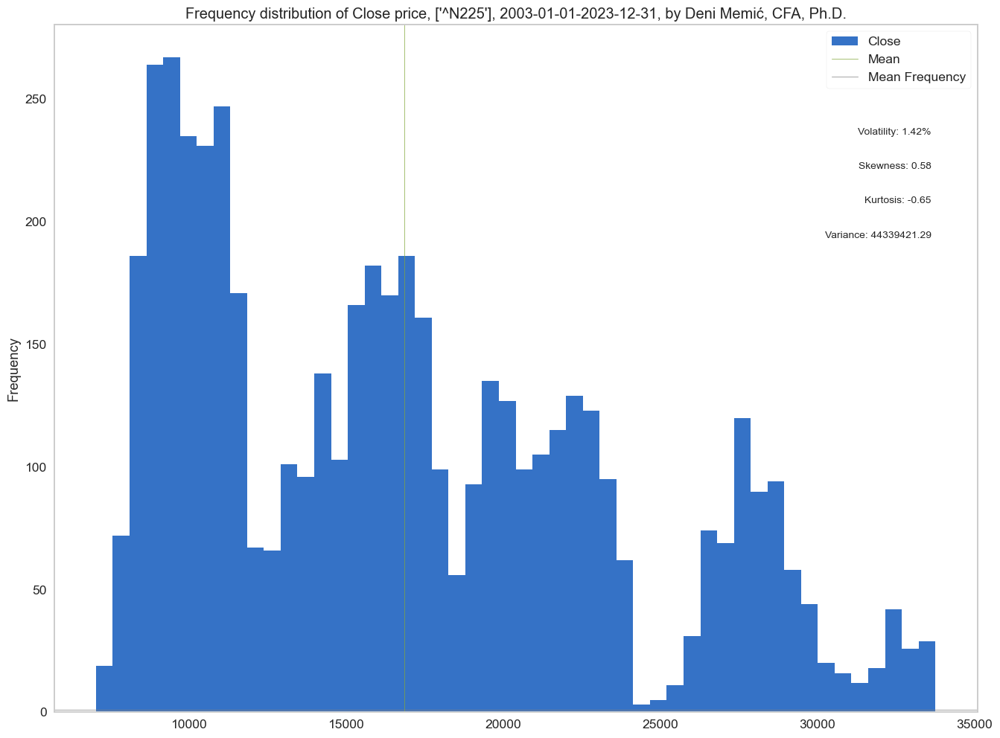

In [63]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Assuming you have df, ticker, start, and end defined

# Calculate additional indicators
volatility = df['Close'].pct_change().std()
skewness = df['Close'].skew()
kurtosis = df['Close'].kurt()
variance = df['Close'].var()

# Calculate mean frequency
mean_frequency = df['Close'].count() // df['Close'].nunique()

# Plot histogram
df['Close'].plot.hist(bins=50, legend=True)

plt.title(f'Frequency distribution of Close price, {ticker}, {start}-{end}, by Deni Memić, CFA, Ph.D.')

# Plot mean line
plt.axvline(df['Close'].mean(), c='g', linewidth=0.5, label='Mean')

# Plot mean frequency line
plt.axhline(mean_frequency, c='gray', linewidth=0.5, label='Mean Frequency')

# Print additional indicators
plt.text(0.95, 0.85, f'Volatility: {volatility:.2%}', transform=plt.gca().transAxes, fontsize=10, verticalalignment='top', horizontalalignment='right')
plt.text(0.95, 0.80, f'Skewness: {skewness:.2f}', transform=plt.gca().transAxes, fontsize=10, verticalalignment='top', horizontalalignment='right')
plt.text(0.95, 0.75, f'Kurtosis: {kurtosis:.2f}', transform=plt.gca().transAxes, fontsize=10, verticalalignment='top', horizontalalignment='right')
plt.text(0.95, 0.70, f'Variance: {variance:.2f}', transform=plt.gca().transAxes, fontsize=10, verticalalignment='top', horizontalalignment='right')

plt.legend()
plt.show()

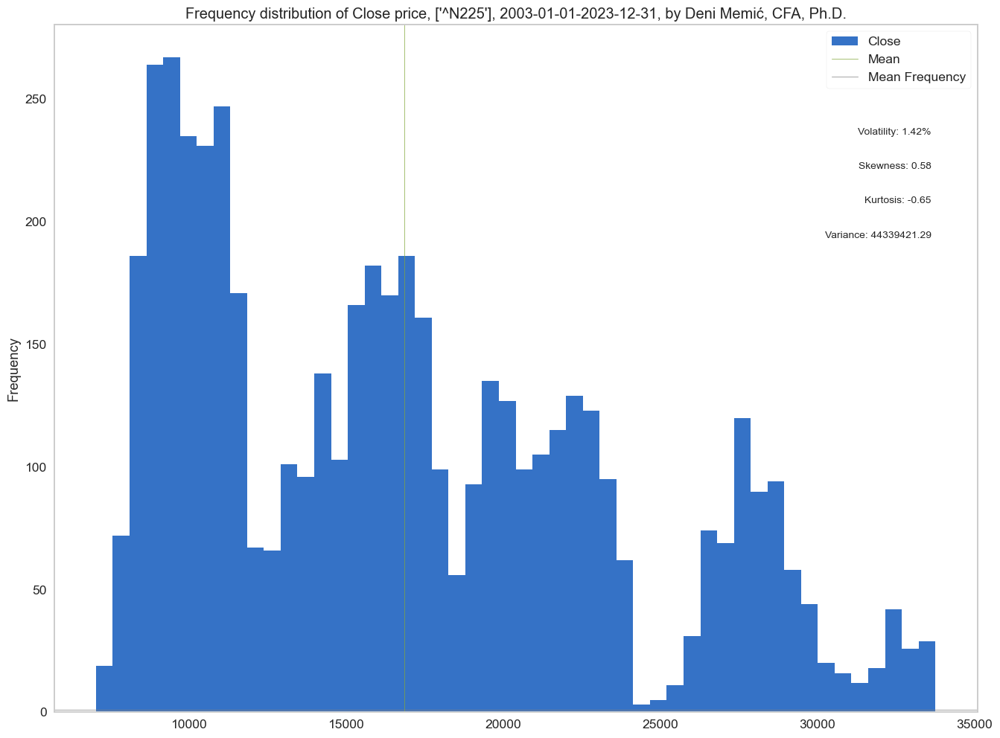

In [65]:
import matplotlib.pyplot as plt
import datetime

# Assuming you have df, ticker, start, and end defined

# Calculate additional indicators
volatility = df['Close'].pct_change().std()
skewness = df['Close'].skew()
kurtosis = df['Close'].kurt()
variance = df['Close'].var()

# Calculate mean frequency
mean_frequency = df['Close'].count() // df['Close'].nunique()

# Plot histogram
df['Close'].plot.hist(bins=50, legend=True)

plt.title(f'Frequency distribution of Close price, {ticker}, {start}-{end}, by Deni Memić, CFA, Ph.D.')

# Plot mean line
plt.axvline(df['Close'].mean(), c='g', linewidth=0.5, label='Mean')

# Plot mean frequency line
plt.axhline(mean_frequency, c='gray', linewidth=0.5, label='Mean Frequency')

# Print additional indicators
plt.text(0.95, 0.85, f'Volatility: {volatility:.2%}', transform=plt.gca().transAxes, fontsize=10, verticalalignment='top', horizontalalignment='right')
plt.text(0.95, 0.80, f'Skewness: {skewness:.2f}', transform=plt.gca().transAxes, fontsize=10, verticalalignment='top', horizontalalignment='right')
plt.text(0.95, 0.75, f'Kurtosis: {kurtosis:.2f}', transform=plt.gca().transAxes, fontsize=10, verticalalignment='top', horizontalalignment='right')
plt.text(0.95, 0.70, f'Variance: {variance:.2f}', transform=plt.gca().transAxes, fontsize=10, verticalalignment='top', horizontalalignment='right')

plt.legend()
plt.show()


[]

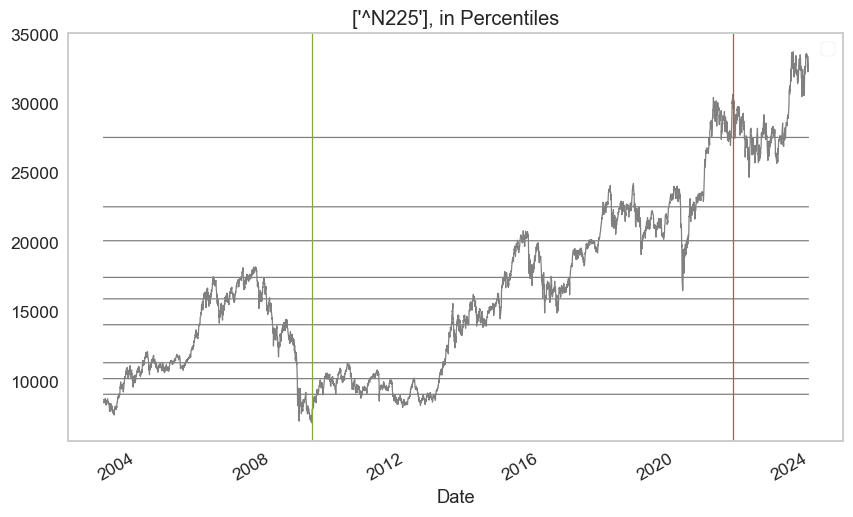

In [69]:
# Percentiles

pctls = np.arange(10,100,10)

for i in pctls:
    df[f'{i}th percentile'] = np.percentile(df.Close, i, axis=0)

df[['Close', '10th percentile', '20th percentile', '30th percentile',
       '40th percentile', '50th percentile', '60th percentile',
       '70th percentile', '80th percentile', '90th percentile']].plot(c='gray', figsize=(10,6), title=(f'{ticker}, in Percentiles'), linewidth=0.9)

plt.axvline(df['2003-12-01':'2022-12-31']['Close'].idxmin(), c='g', linewidth = 0.9, label='Min date')
plt.axvline(df['2003-12-01':'2022-12-31']['Close'].idxmax(), c='r', linewidth = 0.9, label='Max date')

#plt.title('Cijena dionica po procentilima')
plt.legend('')
#plt.plot((0, 0), (0, 1), scaley = True)
plt.plot(figsize=4)

In [92]:
todays_percentile = (df.Close[-1] / df['Close'].max()) * 100
print(f"The percentile of today's price, is: {todays_percentile:.2f}%")

The percentile of today's price, is: 100.00%


In [93]:
ma_100_percentile = (df.Close[-100] / df.Close.max()) * 100
print(f"The percentile of 100 days ago price, is: {ma_100_percentile:.2f}%")

The percentile of 100 days ago price, is: 93.71%


In [94]:
ma_180_percentile = (df.Close[-180] / df.Close.max()) * 100
print(f"The percentile of 180 days ago price, is: {ma_180_percentile:.2f}%")

The percentile of 180 days ago price, is: 94.62%


In [95]:
# Define the list of percentiles you want to calculate
percentile_to_calculate = [95] #1, 100
percentile_to_calculate

[95]

In [96]:
# Calculate the percentiles
percentile = np.percentile(df.Close, percentile_to_calculate)

In [97]:
# Print the calculated percentiles
for p, percentile in zip(percentile_to_calculate, percentile):
    print(f"{percentile_to_calculate}, th percentile:, df.Close{percentile}")
print(df.mean())
print(f'Max, {df.Close.max()}')

[95], th percentile:, df.Close1909.199951171875
Open            1195.744777
High            1201.745348
Low             1189.389496
Close           1195.650409
Adj Close       1195.650409
Volume          4737.577735
Dividends          0.000000
Stock Splits       0.000000
100D MA         1196.532578
180D MA         1197.332443
dtype: float64
Max, 2091.699951171875


In [98]:
percentiles = np.percentile(df.Close, range(1, 101))
percentiles

array([ 346.20799622,  356.29998779,  369.52400146,  383.11600708,
        392.57000427,  400.        ,  407.17801086,  416.06400391,
        422.        ,  426.29998779,  433.78798889,  440.29998779,
        463.5       ,  507.34      ,  558.71000977,  587.79200684,
        619.51799561,  631.844021  ,  647.65197876,  657.98000488,
        669.03601196,  687.90400146,  742.11002441,  797.5       ,
        830.1000061 ,  872.37598877,  890.90002441,  908.73601074,
        924.72598389,  940.31999512,  957.96600586, 1003.20001221,
       1073.75601563, 1094.1359668 , 1112.56998291, 1131.27598633,
       1148.17995117, 1165.21201172, 1178.51800293, 1188.78000488,
       1196.21396484, 1201.96800781, 1209.11      , 1216.17595703,
       1222.96000977, 1227.38402832, 1233.67600342, 1240.09997559,
       1245.54598877, 1252.09997559, 1257.40002441, 1265.61598145,
       1272.        , 1276.2159668 , 1282.37999268, 1286.82404297,
       1291.69995117, 1297.03199219, 1306.28603516, 1312.     

In [99]:
# Calculate percentiles
percentiles = np.percentile(df['Close'], range(1, 101))

# Create a DataFrame with percentiles
percentiles_df = pd.DataFrame({
    'Percentile': range(1, 101),
    'Value': percentiles
})

# Display or use the DataFrame as needed
print(percentiles_df)


    Percentile        Value
0            1   346.207996
1            2   356.299988
2            3   369.524001
3            4   383.116007
4            5   392.570004
..         ...          ...
95          96  1925.083979
96          97  1941.789976
97          98  1961.784043
98          99  1985.383962
99         100  2091.699951

[100 rows x 2 columns]


In [ ]:
percentile_df = pd.DataFrame(df)
percentile_df

,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits,100D MA,180D MA,10th percentile,20th percentile,30th percentile,40th percentile,50th percentile,60th percentile,70th percentile,80th percentile,90th percentile
Date,,,,,,,,,,,,,,,,,,,
2003-01-02,31.549999,32.090000,31.400000,31.850000,31.850000,62480,0.0,0.0,NaN,NaN,38.492001,46.848,52.842,59.510001,66.089996,73.052002,81.601999,91.837999,100.288
2003-01-03,32.080002,33.200001,31.900000,33.080002,33.080002,68416,0.0,0.0,NaN,NaN,38.492001,46.848,52.842,59.510001,66.089996,73.052002,81.601999,91.837999,100.288
2003-01-06,32.650002,32.849998,31.910000,32.099998,32.099998,98247,0.0,0.0,NaN,NaN,38.492001,46.848,52.842,59.510001,66.089996,73.052002,81.601999,91.837999,100.288
2003-01-07,31.549999,31.700001,30.510000,31.080000,31.080000,124279,0.0,0.0,NaN,NaN,38.492001,46.848,52.842,59.510001,66.089996,73.052002,81.601999,91.837999,100.288
2003-01-08,30.250000,30.700001,29.750000,30.559999,30.559999,108037,0.0,0.0,NaN,NaN,38.492001,46.848,52.842,59.510001,66.089996,73.052002,81.601999,91.837999,100.288
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-11-17,72.970001,75.989998,72.750000,75.889999,75.889999,101484,0.0,0.0,82.1226,78.247500,38.492001,46.848,52.842,59.510001,66.089996,73.052002,81.601999,91.837999,100.288
2023-11-20,75.650002,78.220001,75.650002,77.599998,77.599998,270638,0.0,0.0,82.2000,78.231611,38.492001,46.848,52.842,59.510001,66.089996,73.052002,81.601999,91.837999,100.288
2023-11-21,77.650002,77.919998,76.919998,77.769997,77.769997,238629,0.0,0.0,82.2713,78.232667,38.492001,46.848,52.842,59.510001,66.089996,73.052002,81.601999,91.837999,100.288


In [ ]:
# Calculate percentiles from 1 to 100
percentiles = np.percentile(df['Close'], range(1, 101))

In [ ]:
# Create a DataFrame from the calculated percentiles
percentile_df = pd.DataFrame({'Percentile': range(1, 101), 'Value': percentiles})
print(percentile_df)

    Percentile       Value
0            1   26.930800
1            2   29.100400
2            3   30.282400
3            4   31.270800
4            5   32.238000
..         ...         ...
95          96  107.230003
96          97  109.620800
97          98  114.852401
98          99  124.224802
99         100  145.289993

[100 rows x 2 columns]


In [ ]:
# It seems to be 90th procentile
np.percentile(df.Close, i)
print(f'Todays closing price is, {i} percentile of the database')

Todays closing price is, 90 percentile of the database


In [ ]:
round(np.percentile(df, i), 2)

nan

In [ ]:
Q_90Q

100.28800048828126

In [ ]:
"""
The S&P 500 is a stock market index that tracks the performance of 500 of the largest publicly traded companies in the United States 1. It is one of the most commonly followed equity indices 1.
The index is maintained by S&P Dow Jones Indices 2. The companies included in the index are selected based on their market capitalization, liquidity, and other factors 3.
The index is weighted by market capitalization, meaning that companies with higher market capitalization have a greater impact on the index’s performance 3. The S&P 500 is considered a benchmark for the overall performance of the US stock market 1.

The Nasdaq Stock Market is an American stock exchange based in New York City.
It is the most active stock trading venue in the US by volume,[3] and ranked second on the list of stock exchanges by market capitalization of shares traded, behind the New York Stock Exchange.
The exchange platform is owned by Nasdaq, Inc., which also owns the Nasdaq Nordic stock market network and several U.S.-based stock and options exchanges.

The Dow Jones Industrial Average (DJIA), Dow Jones, or simply the Dow, is a stock market index of 30 prominent companies listed on stock exchanges in the United States.
The DJIA is one of the oldest and most commonly followed equity indexes. Many professionals consider it to be an inadequate 

"""

# Value at risk (VaR)

In [70]:
# Single ticker
# Create the summary table

summary_data = {
    'Annualized Return': [ann_return],
    'Sharpe Ratio': [sharpe],
    'Cornish-Fisher VaR (5%)': [cf_var],
    'Historic CVaR (5%)': [hist_cvar],
    'Max Drawdown': [max_dd]
}

summary_table = pd.DataFrame(summary_data)

# Apply styling to the summary table
cm = sns.light_palette("seagreen", as_cmap=True, n_colors=15)
cm1 = sns.light_palette("red", as_cmap=True, n_colors=15, reverse=True)
styled_summary = (summary_table.style
 .background_gradient(cmap=cm, subset=['Annualized Return', 'Sharpe Ratio'])
 .background_gradient(cmap=cm1, subset=['Max Drawdown'])
 .format({'Annualized Return': "{:.2%}", 'Cornish-Fisher VaR (5%)': "{:.2%}", 'Historic CVaR (5%)': "{:.2%}", 'Max Drawdown': "{:.2%}"})
 .applymap(lambda x: f"color: {'red' if x < 0 else 'black'}", subset=['Annualized Return', 'Sharpe Ratio'])
 .set_table_styles([{'selector': 'tr:hover', 'props': [('background-color', 'lightblue')]}]))

# Display the styled summary table
styled_summary
"""
An annual or annualized return is a measure of how much an investment has increased on average each year, during a specific time period.
The annualized return is calculated as a geometric average to show what the annual return compounded would look like.

Value at risk (VaR) answers the question: what is the max that I can loose with 95% or 99% degree of certainty in the following period.

Cornish-Fisher VaR is a way to transform a normal Gaussian random variable z into a non-Gaussian variable, on the basis of skewness (0) and kurtoses (3) values.

The Historical Method we just need historical data and we assume that the asset returns in the future will follow the same pattern as they did in the past.
The rate of returns are calculated from the data that we have and then we organize these returns from worst to best in a histogram.

"""

'\nAn annual or annualized return is a measure of how much an investment has increased on average each year, during a specific time period.\nThe annualized return is calculated as a geometric average to show what the annual return compounded would look like.\n\nValue at risk (VaR) answers the question: what is the max that I can loose with 95% or 99% degree of certainty in the following period.\n\nCornish-Fisher VaR is a way to transform a normal Gaussian random variable z into a non-Gaussian variable, on the basis of skewness (0) and kurtoses (3) values.\n\nThe Historical Method we just need historical data and we assume that the asset returns in the future will follow the same pattern as they did in the past.\nThe rate of returns are calculated from the data that we have and then we organize these returns from worst to best in a histogram.\n\n'

In [71]:
ann_return, sharpe, cf_var, hist_cvar, max_dd

(0.0674257400936582,
 0.025351383215260672,
 0.021463997970076868,
 -0.03332734551425754,
 -0.6136793601032882)

In [72]:
print(f'An annualized total return is the geometric average amount of money earned by an investment each year over a given time period. The annualized return formula is calculated as a geometric average to show what an investor would earn over a period of time if the annual return was compounded at {ann_return:.2%}%'), print()
print(f'The Sharpe Ratio, calculated as the return of the portfolio minus the risk-free rate divided by the standard deviation of the portfolio’s excess return, is {sharpe:.2%}'), print()
print(f'The Cornish-Fisher Expansion (CF) is a straightforward way to address non-normalities in the distribution of asset prices or returns. It enables the implementation of portfolio optimization with a more sophisticated risk measure than variance, such as VaR or conditional VaR. CF is a way to transform a standard Gaussian random variable into a non-Gaussian Z random variable. K is the kurtosis parameter (a value greater than 3 corresponds to a Gaussian distribution). S is the skewness parameter. The actual kurtosis and skewness of the transformed distribution differ significantly, as K and S can no longer be considered infinitesimally small. Obviously, the excess kurtosis parameter will always be positive. For a skewness parameter equal to 0, the excess kurtosis parameter should be between 0 and 8. As the skewness parameter increases in absolute value, the range of possible values for the excess kurtosis parameter shifts upward, with the boundaries in the skewness parameter being symmetric. The calculated CF value reads {cf_var:.2%}'), print()
print(f'The Historical Method calculates the maximum loss not exceeded with a given probability defined as the confidence level. To apply it, we only need historical data, assuming that future asset returns will follow the same pattern as in the past. Returns are calculated from available data and organized from worst to best in a histogram. For the given confidence level, typically 95% or 99%, we look for the worst 5% or 1% of outcomes. Then, we can say that the loss for a given period of time will not exceed this worst outcome with a probability of 95% or 99%. The weakness of the historical approach is its reliance on the assumption that history will repeat itself, which is far from the truth. It is {hist_cvar:.2%}.'), print()
print(f'A maximum drawdown (MDD) is the maximum observed loss from a peak to a trough of a portfolio before a new peak is attained. Maximum drawdown is an indicator of downside risk over a specified time period, {max_dd:.2%}')


An annualized total return is the geometric average amount of money earned by an investment each year over a given time period. The annualized return formula is calculated as a geometric average to show what an investor would earn over a period of time if the annual return was compounded at 6.74%%

The Sharpe Ratio, calculated as the return of the portfolio minus the risk-free rate divided by the standard deviation of the portfolio’s excess return, is 2.54%

The Cornish-Fisher Expansion (CF) is a straightforward way to address non-normalities in the distribution of asset prices or returns. It enables the implementation of portfolio optimization with a more sophisticated risk measure than variance, such as VaR or conditional VaR. CF is a way to transform a standard Gaussian random variable into a non-Gaussian Z random variable. K is the kurtosis parameter (a value greater than 3 corresponds to a Gaussian distribution). S is the skewness parameter. The actual kurtosis and skewness of the

In [73]:
print(f'Godišnji ukupni prinos je geometrijski prosjek iznosa novca koji investicija godišnje zarađuje tijekom određenog vremenskog razdoblja. Formula za godišnji prinos računa se kao geometrijski prosjek kako bi pokazala koliko bi investitor zarađivao tijekom vremena da je godišnji prinos obračunat s {ann_return:.2%}% kamate'), print()
print(f'Sharpe omjer, izračunat kao prinos portfolia minus stopa bez rizika podijeljena s standardnom devijacijom viška prinosa portfolia, iznosi {sharpe:.2%}'), print()
print(f'Cornish-Fisher Expansion (CF) je jednostavan način za rješavanje nenormalnosti u distribuciji cijena imovine ili povrata. Omogućava implementaciju optimizacije portfolia s sofisticiranijom mjerom rizika od varijanse, kao što su VaR ili uvjetni VaR. CF je način da se standardna Gaussova slučajna varijabla pretvori u ne-Gaussovu Z slučajnu varijablu. K je parametar kurtosis (vrijednost veća od 3 odgovara Gaussovoj distribuciji). S je parametar skewness (iskrivljenosti). Stvarni kurtosis i skewness transformirane distribucije značajno se razlikuju, s obzirom na to da se K i S više ne mogu smatrati beskonačno malim. Očigledno je da će parametar viška kurtosis uvijek biti pozitivan. Za parametar skewness jednak 0, parametar viška kurtosis trebao bi biti između 0 i 8. Kako se parametar skewness apsolutno povećava, raspon mogućih vrijednosti za parametar viška kurtosis pomiče prema gore, pri čemu su granice u parametru skewness simetrične. Izračunata vrijednost CF-a iznosi {cf_var:.2%}.'), print()
print(f'Metoda povijesnih podataka računa maksimalni gubitak koji nije premašen s određenom vjerojatnošću definiranom kao razina povjerenja. Da bismo je primijenili, potrebni su nam samo povijesni podaci, pretpostavljajući da će budući povrati imovine slijediti isti obrazac kao i u prošlosti. Povratci se računaju iz dostupnih podataka i organiziraju od najgoreg do najboljeg u histogramu. Za dano povjerenje, obično 95% ili 99%, tražimo najgore 5% ili 1% ishoda. Zatim možemo reći da gubitak u određenom vremenskom razdoblju neće premašiti taj najgori ishod s vjerojatnošću od 95% ili 99%. Slabost povijesnog pristupa je u tome što se oslanja na pretpostavku da će se povijest ponoviti, što je daleko od istine. To je {hist_cvar:.2%}.'), print()
print(f'Maksimalni povlačenje (MDD) je najveći zapaženi gubitak od vrha do dna portfolia, prije nego što se postigne novi vrh. Maksimalno povlačenje pokazatelja je rizika prema dolje, tijekom određenog vremenskog razdoblja, {max_dd:.2%}.')

Godišnji ukupni prinos je geometrijski prosjek iznosa novca koji investicija godišnje zarađuje tijekom određenog vremenskog razdoblja. Formula za godišnji prinos računa se kao geometrijski prosjek kako bi pokazala koliko bi investitor zarađivao tijekom vremena da je godišnji prinos obračunat s 6.74%% kamate

Sharpe omjer, izračunat kao prinos portfolia minus stopa bez rizika podijeljena s standardnom devijacijom viška prinosa portfolia, iznosi 2.54%

Cornish-Fisher Expansion (CF) je jednostavan način za rješavanje nenormalnosti u distribuciji cijena imovine ili povrata. Omogućava implementaciju optimizacije portfolia s sofisticiranijom mjerom rizika od varijanse, kao što su VaR ili uvjetni VaR. CF je način da se standardna Gaussova slučajna varijabla pretvori u ne-Gaussovu Z slučajnu varijablu. K je parametar kurtosis (vrijednost veća od 3 odgovara Gaussovoj distribuciji). S je parametar skewness (iskrivljenosti). Stvarni kurtosis i skewness transformirane distribucije značajno se razl

In [ ]:
ticker

['^GSPC']

In [ ]:
"""
Risk-On Barbell: 
# 1. Overgeight Value: 
# Materials, Energy and Financials and Consumer Discretionary - Reopening at low valuation and secular growth stories that significantly underperformed on rising yields and national policy risk;
# 2. Underweight Bond Proxy Sectors: 
Consumer staples - Expensive defensiveness. Gradual erosion of valuation premium on domestic growth slowdown and e-commerce threat; 
Utilities - National service risk; and 
Healthcare - Underperform on improving global growth and rising bond yields; faces structural/regulatory headwinds.
"""

'\nRisk-On Barbell: \n# 1. Overgeight Value: \n# Materials, Energy and Financials and Consumer Discretionary - Reopening at low valuation and secular growth stories that significantly underperformed on rising yields and national policy risk;\n# 2. Underweight Bond Proxy Sectors: \nConsumer staples - Expensive defensiveness. Gradual erosion of valuation premium on domestic growth slowdown and e-commerce threat; \nUtilities - National service risk; and \nHealthcare - Underperform on improving global growth and rising bond yields; faces structural/regulatory headwinds.\n'

# MOVING AVERAGES

In [ ]:
df['100D MA']

Date
2003-01-02            NaN
2003-01-03            NaN
2003-01-06            NaN
2003-01-07            NaN
2003-01-08            NaN
                 ...     
2023-11-16    4407.352393
2023-11-17    4408.723994
2023-11-20    4410.233394
2023-11-21    4411.111494
2023-11-22    4412.121797
Name: 100D MA, Length: 5260, dtype: float64

In [ ]:
df['180D MA']

Date
2003-01-02            NaN
2003-01-03            NaN
2003-01-06            NaN
2003-01-07            NaN
2003-01-08            NaN
                 ...     
2023-11-16    4286.845554
2023-11-17    4289.447666
2023-11-20    4292.219666
2023-11-21    4295.285331
2023-11-22    4298.422054
Name: 180D MA, Length: 5260, dtype: float64

In [ ]:
# Last 30 days
#df.iloc[-1:, 3] - df.iloc[-100:, 3]
round(df.Close[-1] - df.Close[-100], 2)

4.5

In [ ]:
y1 = df.Close[-1] - df.Close['2022-12-30']
y2 = df.Close['2022-12-30'] - df.Close['2021-12-30']
y1 - y2

-7.230003356933594

In [ ]:
#import pandas as pd

# Assuming df is your DataFrame

for i in df.columns:
    df[f'180D MA {i}'] = df[i].rolling(window=180).mean()
#df['180D MA'].mean()

In [ ]:
#Check any stock:
#date = df.index[-1]
#ticker = 'META'
#df.loc[date][[f'{ticker}', f'100D MA {ticker}', f'Above 100D MA {ticker}', f'Distance from 100D MA {ticker}']]
#df[[f'{ticker}', f'100D MA {ticker}', f'Above 100D MA {ticker}', f'Distance from 100D MA {ticker}']]

In [ ]:
# Data Visualisation in Data Science
#df.iplot(color='green', title=f'{ticker}', xTitle='Date', y='Close', yTitle='Price', colorscale='spectral', legend='')

In [ ]:
start, end

('2003-01-01', '2023-12-31')

In [ ]:
df.Close[-1]

4556.6201171875

## To compare the ticker in two periods

In [ ]:
df.describe()

,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits,100D MA,180D MA,...,180D MA 180D MA,180D MA 10th percentile,180D MA 20th percentile,180D MA 30th percentile,180D MA 40th percentile,180D MA 50th percentile,180D MA 60th percentile,180D MA 70th percentile,180D MA 80th percentile,180D MA 90th percentile
count,5253.000000,5253.000000,5253.000000,5253.000000,5253.000000,5.253000e+03,5253.0,5253.0,5154.000000,5074.000000,...,4895.000000,5.074000e+03,5.074000e+03,5.074000e+03,5.074000e+03,5074.000000,5074.000000,5.074000e+03,5.074000e+03,5.074000e+03
mean,68.298810,69.355338,67.159402,68.290428,68.290428,3.294214e+05,0.0,0.0,68.488184,68.717576,...,69.251147,3.849200e+01,4.684800e+01,5.284200e+01,5.951000e+01,66.089996,73.052002,8.160200e+01,9.183800e+01,1.002880e+02
std,23.455081,23.677778,23.210102,23.468952,23.468952,2.105320e+05,0.0,0.0,22.349809,21.270242,...,20.168052,2.451614e-12,4.100236e-12,4.938759e-12,5.045351e-13,0.000000,0.000000,5.926510e-12,7.887802e-12,9.166905e-12
min,-14.000000,13.690000,-40.320000,-37.630001,-37.630001,0.000000e+00,0.0,0.0,29.510500,29.809889,...,31.397915,3.849200e+01,4.684800e+01,5.284200e+01,5.951000e+01,66.089996,73.052002,8.160200e+01,9.183800e+01,1.002880e+02
25%,49.680000,50.590000,48.869999,49.709999,49.709999,1.743870e+05,0.0,0.0,50.728700,50.759986,...,52.045083,3.849200e+01,4.684800e+01,5.284200e+01,5.951000e+01,66.089996,73.052002,8.160200e+01,9.183800e+01,1.002880e+02
50%,66.029999,66.900002,64.970001,66.089996,66.089996,2.914160e+05,0.0,0.0,65.921650,65.480055,...,65.227467,3.849200e+01,4.684800e+01,5.284200e+01,5.951000e+01,66.089996,73.052002,8.160200e+01,9.183800e+01,1.002880e+02
75%,86.930000,88.209999,85.730003,86.870003,86.870003,4.253950e+05,0.0,0.0,89.638150,90.247042,...,90.773176,3.849200e+01,4.684800e+01,5.284200e+01,5.951000e+01,66.089996,73.052002,8.160200e+01,9.183800e+01,1.002880e+02
max,145.190002,147.270004,143.220001,145.289993,145.289993,2.288230e+06,0.0,0.0,125.659200,114.473833,...,107.067071,3.849200e+01,4.684800e+01,5.284200e+01,5.951000e+01,66.089996,73.052002,8.160200e+01,9.183800e+01,1.002880e+02


In [ ]:
df.Close.describe()

count    5253.000000
mean       68.290428
std        23.468952
min       -37.630001
25%        49.709999
50%        66.089996
75%        86.870003
max       145.289993
Name: Close, dtype: float64

In [ ]:
df['100D MA'].describe()

count    5154.000000
mean       68.488184
std        22.349809
min        29.510500
25%        50.728700
50%        65.921650
75%        89.638150
max       125.659200
Name: 100D MA, dtype: float64

In [ ]:
df['180D MA'].describe()

count   3,193.00
mean       66.20
std        95.63
min         1.58
25%        12.07
50%        16.60
75%        68.23
max       312.32
Name: 180D MA, dtype: float64

In [ ]:
# For a single month
df_m = df.loc['2021-9']#['Close'], CB BiH 2022-11-1
df_m = pd.DataFrame(df_m['Close'])
df_m

,Close
Date,
2021-09-01,68.589996
2021-09-02,69.989998
2021-09-03,69.290001
2021-09-07,68.349998
2021-09-08,69.300003
2021-09-09,68.139999
2021-09-10,69.720001
2021-09-13,70.449997
2021-09-14,70.459999


In [ ]:
# For a single period
period1 = df.loc[['2021-10-01','2023-11-23']]
period1

,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits,100D MA,180D MA,...,180D MA 180D MA,180D MA 10th percentile,180D MA 20th percentile,180D MA 30th percentile,180D MA 40th percentile,180D MA 50th percentile,180D MA 60th percentile,180D MA 70th percentile,180D MA 80th percentile,180D MA 90th percentile
Date,,,,,,,,,,,,,,,,,,,,,
2021-10-01,75.120003,75.989998,74.230003,75.879997,75.879997,388996,0.0,0.0,70.0629,65.782334,...,52.973286,38.492001,46.848,52.842,59.510001,66.089996,73.052002,81.601999,91.837999,100.288
2023-11-23,76.790001,76.809998,75.809998,76.300003,76.300003,47112,0.0,0.0,82.3895,78.238333,...,78.450017,38.492001,46.848,52.842,59.510001,66.089996,73.052002,81.601999,91.837999,100.288


In [ ]:
round(df.Close['2023-10-24'] - df.Close['2021-10-01'], 2) 

7.86

In [ ]:
# Compare 100 days
period_100 = df.loc[['2023-5-15','2023-8-14']]
period_100

,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits,100D MA,180D MA,...,180D MA 180D MA,180D MA 10th percentile,180D MA 20th percentile,180D MA 30th percentile,180D MA 40th percentile,180D MA 50th percentile,180D MA 60th percentile,180D MA 70th percentile,180D MA 80th percentile,180D MA 90th percentile
Date,,,,,,,,,,,,,,,,,,,,,
2023-05-15,70.040001,71.690002,69.410004,71.110001,71.110001,259013,0.0,0.0,76.3638,79.697389,...,91.820287,38.492001,46.848,52.842,59.510001,66.089996,73.052002,81.601999,91.837999,100.288
2023-08-14,83.089996,83.199997,81.760002,82.510002,82.510002,277352,0.0,0.0,74.8359,75.626333,...,84.365648,38.492001,46.848,52.842,59.510001,66.089996,73.052002,81.601999,91.837999,100.288


In [ ]:
# Compare 180 days
period_180 = df.loc[['2023-5-15','2023-8-14']]
period_180

,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits,100D MA,180D MA,...,180D MA 180D MA,180D MA 10th percentile,180D MA 20th percentile,180D MA 30th percentile,180D MA 40th percentile,180D MA 50th percentile,180D MA 60th percentile,180D MA 70th percentile,180D MA 80th percentile,180D MA 90th percentile
Date,,,,,,,,,,,,,,,,,,,,,
2023-05-15,70.040001,71.690002,69.410004,71.110001,71.110001,259013,0.0,0.0,76.3638,79.697389,...,91.820287,38.492001,46.848,52.842,59.510001,66.089996,73.052002,81.601999,91.837999,100.288
2023-08-14,83.089996,83.199997,81.760002,82.510002,82.510002,277352,0.0,0.0,74.8359,75.626333,...,84.365648,38.492001,46.848,52.842,59.510001,66.089996,73.052002,81.601999,91.837999,100.288


In [ ]:
#df.Close.iplot(kind='hist', title= f'{ticker}', colorscale='spectral', size=True, legend='') # color='blue'

In [ ]:
# Samo za ticker zlato
# Prodaja tone zlata od strane CB BiH
#df_cb = df.loc['2022-11-01']['Close']
#round(df_cb, 2)

round(df.Close[-100], 2)

257.5

In [ ]:
round(df.Close[-180], 2)

193.81

In [ ]:
round(df.Close[-1], 2)

3.52

In [ ]:
df_diff = round(df.Close[-1] - df.Close[-100], 2)
df_diff

1.17

In [ ]:
#round(328.6 * 35273.96195, 2) # for gold
#round(df_diff * 35273.96195, 2) # for gold
round(df_diff * 1, 2) # for ticker 

6.25

In [ ]:
#df_cb_loss = (35273.96195 * (df_cb - df.Close[-1]))
#print('CB BiH Loss or gain USD, so far', round(df_cb_loss, 2))

df_loss_100D = (1 * (df.Close[-1]) - df.Close[-100])
print('Loss or gain on 1 share invested 100 days ago is USD', round(df_loss_100D, 2))

Loss or gain on 1 share invested 100 days ago is USD 6.25


In [ ]:
df_loss_180D = (1 * (df.Close[-1]) - df.Close[-180])
print('Loss or gain on 1 share invested 180 days ago is USD', round(df_loss_180D, 2))

Loss or gain on 1 share invested 180 days ago is USD 49.77


In [ ]:
#Q4 - df.Close.max()
#round(df.describe(), 4)
#df.mean()

In [ ]:
# The price and a date of max value
print('Max exchange value and the date:')
#round(df['2003-12-01':'2022-12-31']['Close'].max(), 4), df['2003-12-01':'2022-12-31']['Close'].idxmax()
round(df.Close.max(), 4), df.Close.idxmax()

Max exchange value and the date:


(196.45, Timestamp('2023-07-31 00:00:00'))

In [ ]:
print('The strongest Ticker was equal to USD', round(df.Close.max(), 3), 'on', df.Close.idxmax())

The strongest Ticker was equal to USD 196.45 on 2023-07-31 00:00:00


In [ ]:
# The price and a date of min value
print('The weakest Ticker was equal to USD', round(df.Close.min(), 4), 'on', df.Close.idxmin())
#round(df['2003-12-01':'2022-12-31']['Close'].min(), 4), df['2003-12-01':'2022-12-31']['Close'].idxmin()
#round(df.Close.min(), 4), df.Close.idxmin()

The weakest Ticker was equal to USD 0.2343 on 2003-04-17 00:00:00


In [ ]:
print('Average Ticker is equal to USD:', round(df.Close.mean(), 4))
print('Median Ticker is equal to USD:', round(df.Close.median(), 4))
print("Today's Ticker 1 is equal to USD:", round(df.Close[-1], 2))
print('Mode Ticker is equal to USD:', round(df.Close.mode(), 4))

Average Ticker is equal to USD: 69.0262
Median Ticker is equal to USD: 16.8533
Today's Ticker 1 is equal to USD: 234.3
Mode Ticker is equal to USD: 0   1.83
Name: Close, dtype: float64


In [ ]:
df['100D MA'].mean()

38.01342183719707

In [ ]:
round(df['180D MA'].mean(), 2)

37.26

In [ ]:
print("Change from the begining:", round(df.Close[-1] - round(df.Close[0]), 2))
print("1D change:", round(df.Close[-1] - round(df.Close[-2]), 2))
print("1M change:", round(df.Close[-1] - round(df.Close[-30]), 2))
print("1Y change:", round(df.Close[-1] - round(df.Close[-365]), 2))
#print("10Y change:", round(df.Close[-1] - round(df.Close[-3650]), 2))

print('100D MA change:', round(df['Close'][-1] - df['100D MA'].iloc[-1], 2))
print('180D MA change:', round(df['Close'][-1] - df['180D MA'].iloc[-1], 2))

Change from the begining: 261.53
1D change: -13.47
1M change: -12.47
1Y change: 100.53
100D MA change: 0.48
180D MA change: 39.31


In [ ]:
round(df.Close.max(), 2)

382.18

In [ ]:
round(df.Close.min(), 2)

17.73

In [ ]:
round(df.Close.mean(), 2)

154.99

In [ ]:
round(df['100D MA'].iloc[-1], 2)

299.05

In [ ]:
round(df['180D MA'].iloc[-1], 2)

260.22

In [ ]:
round(df.Close[-1], 2)

174.79

In [ ]:
print('Close price of Ticker in USD today', round(df.Close[-1],2))
print('Mean Close price of Ticker in USD', round(df.Close.mean(), 2))
print('Max Close price of Ticker in USD', round((df.Close.max()), 2))
print()
print('Difference between the close price today and mean price is', round((df.Close[-1] - df.Close.mean()), 2), 'dollars')
print('Difference between close price today and max price is', round((df.Close[-1] - df.Close.max()), 2), 'dollars')
print()
print('Difference between the close price today and 100D MA', round((df.Close[-1] - df['100D MA'].iloc[-1]), 2), 'dollars')
print('Difference between the close price today and 180D MA', round((df.Close[-1] - df['180D MA'].iloc[-1]), 2), 'dollars')

Close price of Ticker in USD today 299.53
Mean Close price of Ticker in USD 154.99
Max Close price of Ticker in USD 382.18

Difference between the close price today and mean price is 144.54 dollars
Difference between close price today and max price is -82.65 dollars

Difference between the close price today and 100D MA 0.48 dollars
Difference between the close price today and 180D MA 39.31 dollars


In [ ]:
returns = df['Close'].pct_change().dropna()
returns

Date
2003-01-03    0.01
2003-01-06    0.00
2003-01-07   -0.00
2003-01-08   -0.02
2003-01-09    0.01
              ... 
2023-09-18    0.02
2023-09-19    0.01
2023-09-20   -0.02
2023-09-21   -0.01
2023-09-22    0.00
Name: Close, Length: 5216, dtype: float64

# NEDIM SIGNALS

In [ ]:
"""

The strong sell signals above are created on the bases of mouving (resent) averages of 50,100 and 180 days.

If we consider the overall average (e.g.1,24) as a milestone instead, we would create another signal,
according to which we sell EUR when strong (expensive) and buy it when weak (cheap).

The new signal might oppose superior signals, depending on distance between overall and mouving averages. 

print(f'Accoring to overall average,' + '\033[94m' + ' EUR ' + '\033[0m' + 'EUR is strong (EXPENSIVE), SO sell it for ' +  '\033[91m' + 'USD')

"""

"\n\nThe strong sell signals above are created on the bases of mouving (resent) averages of 50,100 and 180 days.\n\nIf we consider the overall average (e.g.1,24) as a milestone instead, we would create another signal,\naccording to which we sell EUR when strong (expensive) and buy it when weak (cheap).\n\nThe new signal might oppose superior signals, depending on distance between overall and mouving averages. \n\nprint(f'Accoring to overall average,' + '\x1b' + ' EUR ' + '\x1b' + 'EUR is strong (EXPENSIVE), SO sell it for ' +  '\x1b' + 'USD')\n\n"

In [ ]:
# Whiskers criterion

if df.Close[-1] > upper_wisker:
    print(f'According to upper_wisker criterion, Ticker is strong (EXPENSIVE), so ' + '\033[91m' + 'sell ' + '\033[0m' + 'it for USD')
elif df.Close[-1] < lower_wisker:
    print('According to wiskers criterion: Do nothing')
else:
    print(f'According to lower wisker criterion, Ticker is weak (CHEAP), so ' + '\033[92m' + 'buy ' + '\033[0m' + 'it for USD')

According to upper_wisker criterion, Ticker is strong (EXPENSIVE), so sell it for USD


In [ ]:
# 100D MA criterion

if df.Close[-1] > df['100D MA'].iloc[-1]:
    print(f'According to 100D MA criterion, Ticker is strong (EXPENSIVE), so ' + '\033[91m' + 'sell ' + '\033[0m' + 'it for USD')
elif df.Close[-1] < df['100D MA'].iloc[-1]:
    print(f'According to 100D MA criterion, Ticker is weak (CHEAP), so ' + '\033[92m' + 'buy ' + '\033[0m' + 'it for USD')
else:
    print(print('According to 100D MA criterion: Do nothing'))

According to 100D MA criterion, Ticker is weak (CHEAP), so buy it for USD


In [ ]:
# 180D MA criterion

if df.Close[-1] > df['180D MA'].iloc[-1]:
    print(f'According to 180D MA criterion, Ticker is strong (EXPENSIVE), so ' + '\033[91m' + 'sell ' + '\033[0m' + 'it for USD')
elif df.Close[-1] < df['180D MA'].iloc[-1]:
    print(f'According to 180D MA criterion, Ticker is weak (CHEAP), so ' + '\033[92m' + 'buy ' + '\033[0m' + 'it for USD')
else:
    print(print('According to 180D MA criterion: Do nothing'))

According to 180D MA criterion, Ticker is strong (EXPENSIVE), so sell it for USD


In [ ]:
# Outliers criterion

if df.Close[-1] > Q_95Q:
    print(f'According to outliers criterion, Ticker is strong (EXPENSIVE), so ' + '\033[91m' + 'strong sell ' + '\033[0m' + 'it for USD')
elif df.Close[-1] > Q_90Q:
    print(f'According to outliers criterion, Ticker is strong (EXPENSIVE), so ' + '\033[91m' + 'sell ' + '\033[0m' + 'it for USD')
elif df.Close[-1] < Q_5Q:
    print(f'According to outliers criterion, Ticker is weak (CHEAP), so ' + '\033[92m' + 'strong buy ' + '\033[0m' + 'it for USD')
elif df.Close[-1] < Q_10Q:
    print(f'According to outliers criterion, Ticker is weak (CHEAP), so ' + '\033[92m' + 'buy ' + '\033[0m' + 'it for USD')
else:
    print(('According to outliers criterion: Do nothing'))
    #print('EUR is weak (CHEAP) SO, buy it for USD')

According to outliers criterion, Ticker is strong (EXPENSIVE), so strong sell it for USD


In [ ]:
df.Close.min(), df.Close.mean(), df.Close.max()

(0.23428599536418915, 39.030039458755724, 196.4499969482422)

In [ ]:
df.Close.mean()

39.030039458755724

In [ ]:
#print.df.Close(f'{'hist_cvar'})
print(f'Historic cvar is, {hist_cvar}')

Historic cvar is, -0.04629866183154851


# DINAMIC GRAPH

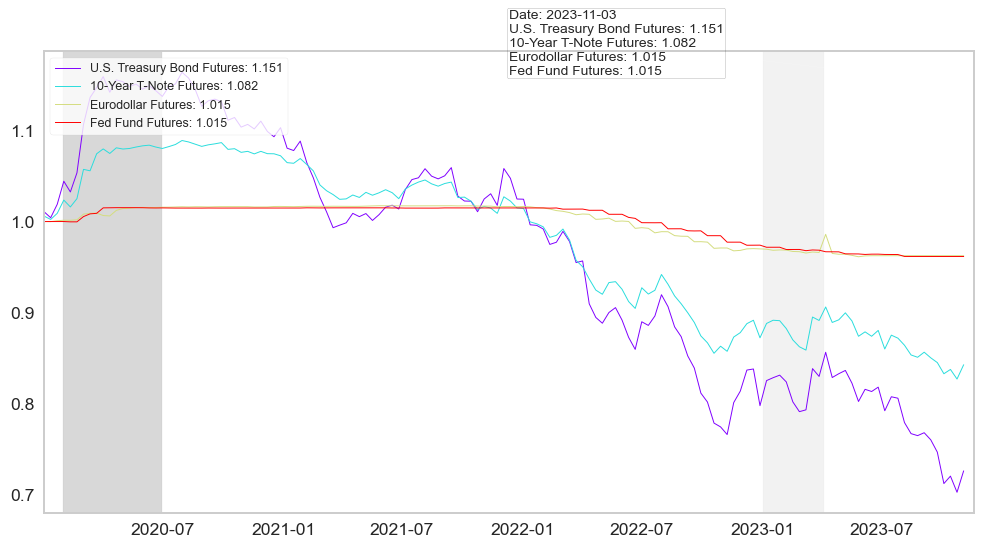

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import display, clear_output
from datetime import datetime
import numpy as np

ticker4 = ["^GSPC", "^IXIC", "^AXJO", "^NZ50", "^GDAXI", "^N225", "^FCHI", "^IBEX", "^BVSP", "^HSI", "^FTSE", "^STOXX50E", "^BSESN", "^JKSE", "IMOEX.ME", "^SSMI", "^OMX", "^GSPTSE","^MXX", "^ATX", "^OSEAX", "^OMXH25", "^KLSE", "^MERV", "^KRX", "^AEX", "^OMXCPI", "^TA125.TA",
          # 'QAT', 'KSA', 'UAE', 'MCHI', 'EWJ','EWG','EWU','EWN','GREK','EDEN','EWT','EWC','EWZ','EWL','EWA','EWQ','EWI','EWS',
          'BTC-USD', 'ETH-USD', 'USDT-USD', 'BNB-USD', 'USDC-USD', 'XRP-USD', 'BUSD-USD', 'ADA-USD', 'DOGE-USD', 'MATIC-USD', 'SOL-USD', 'DOT-USD', 'LTC-USD', 'AVAX-USD', 'TRX-USD', 'DAI-USD', 'UNI-USD', 'ATOM-USD', 
          'EURUSD=X', 'GBPUSD=X', 'JPYUSD=X','CHFUSD=X', 'CADUSD=X', 'ZARUSD=X','EGPUSD=X', 'TRYUSD=X', 'BRLUSD=X', 'NZDUSD=X', 'HKDUSD=X', 'SGDUSD=X', 'SEKUSD=X', 'NOKUSD=X', 'DKKUSD=X', 'CNYUSD=X', 'INRUSD=X',
          'BZ=F', 'NG=F', 'CC=F', 'GC=F', 'HG=F','HO=F', 'KC=F', 'PA=F', 'PL=F', 'SI=F', 'YM=F', 'ZC=F', 'ZS=F', 'ZW=F',
          'ZB=F', 'ZN=F', 'GE=F', 'ZQ=F']

start = '2020-01-01'
end = '2023-12-31'
interval = '1d'

signals = yf.download(ticker4, start, end, interval)['Close']

periods_back = -1

world_equity = signals[["^GSPC", "^IXIC", "^AXJO", "^NZ50", "^GDAXI", "^N225", "^FCHI", "^IBEX", "^BVSP", "^HSI", "^FTSE", "^STOXX50E", "^BSESN", "^JKSE", "IMOEX.ME", "^SSMI", "^OMX", "^GSPTSE","^MXX", "^ATX", "^OSEAX", "^OMXH25", "^KLSE", "^MERV", "^KRX", "^AEX", "^OMXCPI", "^TA125.TA"]]
world_equity.columns = ["S&P 500", "Nasdaq", "Australia ASX 200", "New Zaeland NZX 50", "Germany DAX", "Japan NIKKEI 225", "Euroindex Paris", "Spain IBEX 35", "Brazil IBOVESPA", "Hang Seng", "UK FTSE 100", "STOXX Europe 50", "Bombay Stock Exchange", "Jakarta Composite", "MOEX Russia Index", "Swiss Market Index", 
               "Sweden Market Index", "Canada Composite Index", "IPC Mexico", "Vienna Stock Exchange Index", "Oslo Stock Exchange Index", "Finland Stock Market Index", 
               "Bursa Malaysia KLCI Index", "Argentina Equity Market Index", "North Korea Index", "Amsterdam Stock Exchange Index", "OMX Copenhagen Index", "Tel Aviv 125 Index"]
returns_world_equity_d = world_equity.pct_change().dropna()
wealth_world_equity = (returns_world_equity_d+1).cumprod()
returns_world_equity_d.index = pd.to_datetime(returns_world_equity_d.index)
returns_world_equity_w = (returns_world_equity_d+1).resample('W').prod() - 1 
returns_world_equity_m = (returns_world_equity_d+1).resample('M').prod() - 1 
returns_world_equity_a = (returns_world_equity_d+1).resample('A').prod() - 1 
returns_world_equity_d1 = returns_world_equity_d.iloc[periods_back]
returns_world_equity_w1 = returns_world_equity_w.iloc[periods_back]
returns_world_equity_m1 = returns_world_equity_m.iloc[periods_back]
returns_world_equity_a1 = returns_world_equity_a.iloc[periods_back]

crypto = signals[['BTC-USD', 'ETH-USD', 'USDT-USD', 'BNB-USD', 'USDC-USD', 'XRP-USD', 'BUSD-USD', 'ADA-USD', 'DOGE-USD', 'MATIC-USD', 'SOL-USD', 'DOT-USD', 'LTC-USD', 'AVAX-USD', 'TRX-USD', 'DAI-USD', 'UNI-USD', 'ATOM-USD']]
crypto.columns = ["Bitcoin","Ethereum","Tether","Binance Coin","USD Coin","XRP","Binance USD","Cardano","Dogecoin","Polygon (Matic Network)","Solana","Polkadot","Litecoin","Avalanche","TRON","Dai","Uniswap","Cosmos"]
returns_crypto_d = crypto.pct_change().dropna()
wealth_crypto = (returns_crypto_d+1).cumprod()
returns_crypto_d.index = pd.to_datetime(returns_crypto_d.index)
returns_crypto_w = (returns_crypto_d+1).resample('W').prod() - 1 
returns_crypto_m = (returns_crypto_d+1).resample('M').prod() - 1 
returns_crypto_a = (returns_crypto_d+1).resample('A').prod() - 1 
returns_crypto_d1 = returns_crypto_d.iloc[periods_back]
returns_crypto_w1 = returns_crypto_w.iloc[periods_back]
returns_crypto_m1 = returns_crypto_m.iloc[periods_back]
returns_crypto_a1 = returns_crypto_a.iloc[periods_back]

fx = signals[['EURUSD=X', 'GBPUSD=X', 'JPYUSD=X','CHFUSD=X', 'CADUSD=X', 'ZARUSD=X','EGPUSD=X', 'TRYUSD=X', 'BRLUSD=X', 'NZDUSD=X', 'HKDUSD=X', 'SGDUSD=X', 'SEKUSD=X', 'NOKUSD=X', 'DKKUSD=X', 'CNYUSD=X', 'INRUSD=X']]
returns_fx_d = fx.pct_change().dropna()
wealth_fx = (returns_fx_d+1).cumprod()
returns_fx_d.index = pd.to_datetime(returns_fx_d.index)
returns_fx_w = (returns_fx_d+1).resample('W').prod() - 1 
returns_fx_m = (returns_fx_d+1).resample('M').prod() - 1 
returns_fx_a = (returns_fx_d+1).resample('A').prod() - 1 
returns_fx_d1 = returns_fx_d.iloc[periods_back]
returns_fx_w1 = returns_fx_w.iloc[periods_back]
returns_fx_m1 = returns_fx_m.iloc[periods_back]
returns_fx_a1 = returns_fx_a.iloc[periods_back]

commodities = signals[['BZ=F', 'NG=F', 'CC=F', 'GC=F', 'HG=F', 'HO=F', 'KC=F', 'PA=F', 'PL=F', 'SI=F', 'YM=F', 'ZC=F', 'ZS=F', 'ZW=F']]
commodities.columns = ['Brent Crude Oil', 'Natural gas', 'Cocoa', 'Gold', 'Copper', 'Heating Oil Futures', 'Coffee', 'Palladium', 'Platinum', 'Silver', 'E-mini Dow Jones', 'Corn', 'Soybean', 'Wheat']
returns_commodities_d = commodities.pct_change().dropna()
wealth_commodities = (returns_commodities_d+1).cumprod()
returns_commodities_d.index = pd.to_datetime(returns_commodities_d.index)
returns_commodities_w = (returns_commodities_d+1).resample('W').prod() - 1 
returns_commodities_m = (returns_commodities_d+1).resample('M').prod() - 1 
returns_commodities_a = (returns_commodities_d+1).resample('A').prod() - 1 
returns_commodities_d1 = returns_commodities_d.iloc[periods_back]
returns_commodities_w1 = returns_commodities_w.iloc[periods_back]
returns_commodities_m1 = returns_commodities_m.iloc[periods_back]
returns_commodities_a1 = returns_commodities_a.iloc[periods_back]

fi = signals[['ZB=F', 'ZN=F', 'GE=F', 'ZQ=F']]
fi.columns = ['U.S. Treasury Bond Futures', '10-Year T-Note Futures','Eurodollar Futures','Fed Fund Futures']

#fi = signals[['BZ=F', 'NG=F', 'CC=F', 'GC=F']]
#fi.columns = ['Brent Crude Oil', 'Natural Gas','Cocoa','Gold']

#fi = signals[['EURUSD=X', 'GBPUSD=X', 'JPYUSD=X','CHFUSD=X']]
#fi.columns = ['EUR', 'GBP','YPY','CHF']


returns_fi_d = fi.pct_change().dropna()
wealth_fi = (returns_fi_d+1).cumprod()
returns_fi_d.index = pd.to_datetime(returns_fi_d.index)
returns_fi_w = (returns_fi_d+1).resample('W').prod() - 1 
returns_fi_m = (returns_fi_d+1).resample('M').prod() - 1 
returns_fi_a = (returns_fi_d+1).resample('A').prod() - 1 
returns_fi_d1 = returns_fi_d.iloc[periods_back]
returns_fi_w1 = returns_fi_w.iloc[periods_back]
returns_fi_m1 = returns_fi_m.iloc[periods_back]
returns_fi_a1 = returns_fi_a.iloc[periods_back]

assets_of_choice = wealth_fi

fig, ax = plt.subplots(figsize=(12, 6))  # Increased plot size

lines = []  # List to hold line objects
line_labels = assets_of_choice.columns  # Add label names for each line
line_colors = plt.cm.rainbow(np.linspace(0, 1, len(line_labels)))  # Automatically assign colors based on the number of line labels

# Create lines and add to the lines list
for label, color in zip(line_labels, line_colors):
    line, = ax.plot([], [], label=label, color=color, linewidth = 0.7)
    lines.append(line)

ax.legend(loc='upper left', fontsize=9)

# Add shaded areas
ax.axvspan(datetime(2023, 1, 1), datetime(2023, 4, 4), color="gray", alpha=0.1)
ax.axvspan(datetime(2020, 2, 1), datetime(2020, 7, 1), label="Recession", color="gray", alpha=0.3)
ax.axvspan(datetime(2007, 12, 1), datetime(2009, 6, 1), color="gray", alpha=0.3)

# Create annotation text
annotation_box = ax.annotate('', xy=(0, 0), xytext=(0.5, 0.95), fontsize=10,  # Adjust font size
                              textcoords='axes fraction', bbox=dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.1', alpha=0.5),  # More transparent box
                              arrowprops=dict(facecolor='black', arrowstyle='->', alpha=0.5))  # Reduced arrow alpha

# Create value text
value_text = ax.annotate('', xy=(0, 0), xytext=(0.5, 0.9), fontsize=10,  # Adjust font size
                          textcoords='axes fraction', color='black', alpha=0.5)  # Transparent box

def init():
    for line in lines:
        line.set_data([], [])
    ax.set_xlim(assets_of_choice.index[0], assets_of_choice.index[-1])  # Set initial x-axis limits
    return lines + [annotation_box, value_text]

def update(frame):
    x_data = assets_of_choice.index[::10][:frame+1]  # Reduce the number of x data points
    for idx, line in enumerate(lines):
        y_data = assets_of_choice[line_labels[idx]][::10][:frame+1]  # Adjusted line data
        line.set_data(x_data, y_data)
    
    # Update annotation text
    date_str = x_data[-1].strftime("%Y-%m-%d")
    value_strs = [f'{line_labels[idx]}: {assets_of_choice[line_labels[idx]][frame]:.3f}' for idx in range(len(line_labels))]  # Corrected value strings
    annotation_text = f'Date: {date_str}\n' + '\n'.join(value_strs)
    
    # Check if value decreased compared to the previous day for each line
    box_colors = []
    for idx, label in enumerate(line_labels):
        if frame > 0 and assets_of_choice[label][frame] < assets_of_choice[label][frame - 1]:
            box_colors.append('red')
        else:
            box_colors.append('green')
    
    # Update value text in the legend
    legend_strs = []
    for idx, label in enumerate(line_labels):
        value = assets_of_choice[label][frame]
        legend_strs.append(f'{label}: {value:.3f}')
        
    annotation_box.set_text(annotation_text)
    annotation_box.xy = (x_data[-1], assets_of_choice[line_labels[0]][frame])
    annotation_box.set_bbox(dict(facecolor='none', edgecolor='black', boxstyle='round,pad=0.1', alpha=0.5))  # More transparent box
    
    ax.relim()
    ax.autoscale_view()
    
    # Update legend with value annotations
    ax.legend(loc='upper left', fontsize=9, labels=legend_strs)

    return lines + [annotation_box]

ani = FuncAnimation(fig, update, init_func=init, frames=len(assets_of_choice[::10]), interval=1, blit=True)  # Faster animation with reduced frames and interval

try:
    for i in range(len(assets_of_choice[::10])):
        clear_output(wait=True)
        display(fig)
        ani.event_source.stop()
        update(i)
        plt.pause(0.00000000001)  # Shorter pause for smoother animation
except KeyboardInterrupt:
    pass

plt.close()

# FUNDAMENTAL ANALYSIS

In [ ]:
import fundamentalanalysis as fa
api_key_fa = 'f1b920a6f757cde91d22aff5940cab2c' # Denicin key

In [ ]:
ticker = 'META'

In [ ]:
pd.options.display.float_format = '{:,.0f}'.format

## Balance Sheet

In [ ]:
balance_sheet = fa.balance_sheet_statement(ticker, api_key_fa, period='annual')
#balance_sheet = fa.balance_sheet_statement("META", api_key_fa, period='annual')
# Set the display format for numeric columns in the DataFrame
balance_sheet

,2022,2021,2020,2019,2018
reportedCurrency,USD,USD,USD,USD,USD
cik,0001326801,0001326801,0001326801,0001326801,0001326801
fillingDate,2023-02-02,2022-02-03,2021-01-28,2020-01-30,2019-01-31
acceptedDate,2023-02-01 20:26:31,2022-02-02 21:11:04,2021-01-27 21:13:48,2020-01-29 21:12:14,2019-01-31 16:58:29
calendarYear,2022,2021,2020,2019,2018
period,FY,FY,FY,FY,FY
cashAndCashEquivalents,14681000000,16601000000,17576000000,19079000000,10019000000
shortTermInvestments,26057000000,31397000000,44378000000,35776000000,31095000000
cashAndShortTermInvestments,40738000000,47998000000,61954000000,54855000000,41114000000
netReceivables,13466000000,14039000000,11335000000,9518000000,7587000000


In [ ]:
#balance_sheet.iloc[:, 0:2]

In [ ]:
#balance_sheet['2022']

In [ ]:
# Non-current assets

property_plant__and_equipment = balance_sheet.loc['propertyPlantEquipmentNet', '2022']
goodwill = balance_sheet.loc['goodwill', '2022']
intangable_assets = balance_sheet.loc['intangibleAssets', '2022']
long_term_investments = balance_sheet.loc['longTermInvestments', '2022']
tax_assets = balance_sheet.loc['taxAssets', '2022']
other_noncurrent_assets = balance_sheet.loc['otherNonCurrentAssets', '2022']
total_noncurrent_assets = property_plant__and_equipment + goodwill + intangable_assets + long_term_investments + tax_assets + other_noncurrent_assets

# Current assets

inventory = balance_sheet.loc['inventory', '2022']
cash_and_cash_equivalents = balance_sheet.loc['cashAndCashEquivalents', '2022']
short_term_investments = balance_sheet.loc['shortTermInvestments', '2022']
net_receivables = balance_sheet.loc['netReceivables', '2022']
other_current_assets = balance_sheet.loc['otherCurrentAssets', '2022']
total_current_assets = inventory + cash_and_cash_equivalents + short_term_investments + net_receivables + other_current_assets

# Total assets

total_assets = total_noncurrent_assets + total_current_assets

# Non-current Liabilities

account_payables = balance_sheet.loc['accountPayables', '2022']
short_term_debt = balance_sheet.loc['shortTermDebt', '2022']
tax_payables = balance_sheet.loc['taxPayables', '2022']
deferred_revenue = balance_sheet.loc['deferredRevenue', '2022']
other_current_liabilities = balance_sheet.loc['otherCurrentLiabilities', '2022']
total_non_current_liabilities = account_payables + short_term_debt + tax_payables + deferred_revenue + other_current_liabilities

# Current liabilities

long_term_debt = balance_sheet.loc['longTermDebt', '2022']
other_non_current_liabilities = balance_sheet.loc['otherNonCurrentLiabilities', '2022']
total_current_liabilities = long_term_debt + other_non_current_liabilities

# Equity

common_stock = balance_sheet.loc['commonStock', '2022']
other_stockholders_equity = balance_sheet.loc['othertotalStockholdersEquity', '2022']
accumulated_comprehensive_income_loss = balance_sheet.loc['accumulatedOtherComprehensiveIncomeLoss', '2022']
retained_earnings = balance_sheet.loc['retainedEarnings', '2022']
total_equity = common_stock + other_stockholders_equity + accumulated_comprehensive_income_loss + retained_earnings
total_liabilities_and_equity = balance_sheet.loc['totalLiabilitiesAndTotalEquity', '2022']

if total_assets - total_liabilities_and_equity == 0:
    print('\033[92m' + 'Assets are equal to Liabilities and Equity')
else:
    print('Error ' + '\033[91m' + 'Assets are unequal to Liabilities and Equity')
# + '\033[91m' + 'sell ' + '\033[0m'

Assets are equal to Liabilities and Equity


In [ ]:
#import plotly.graph_objects as go

# Define the labels for the nodes
labels = ['Total Assets', 'Property, Plant, and Equipment', 'Goodwill',
        'Intangible Assets', 'Long-Term Investments', 'Tax Assets',
        'Other Non-Current Assets', 'inventory', 'cashAndCashEquivalents',
        'shortTermInvestments', 'netReceivables', 'otherCurrentAssets']


# Define the source and target indices for the links
source_indices = [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
target_indices = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]

# Define the values for the links
values = [
    property_plant__and_equipment,
    goodwill,
    intangable_assets,
    long_term_investments,
    tax_assets,
    other_noncurrent_assets,
    inventory,
    cash_and_cash_equivalents,
    short_term_investments,
    net_receivables,
    other_current_assets
]

# Create the Sankey diagram
fig = go.Figure(go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=labels
    ),
    link=dict(
        source=source_indices,
        target=target_indices,
        value=values
    )))

# Set the chart title with {ticker}
fig.update_layout(title_text=f"{ticker} Total Assets Sankey Diagram", font=dict(size=12), width=800, height=400)

# Display the chart
fig.show()

In [ ]:
#import plotly.graph_objects as go

# Define the labels for the nodes
labels = ['totalLiabilitiesAndTotalEquity', 'accountPayables', 'shortTermDebt', 'taxPayables', 'deferredRevenue',
        'otherCurrentLiabilities', 'longTermDebt', 'otherNonCurrentLiabilities', 'commonStock','othertotalStockholdersEquity',
        'accumulatedOtherComprehensiveIncomeLoss', 'retainedEarnings']

# Define the source and target indices for the links
source_indices = [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
target_indices = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]

# Define the values for the links
values = [
    total_liabilities_and_equity,
    account_payables,
    short_term_debt,
    tax_payables,
    deferred_revenue,
    other_current_liabilities,
    long_term_debt,
    other_non_current_liabilities,
    common_stock,
    other_stockholders_equity,
    accumulated_comprehensive_income_loss,
    retained_earnings
]

# Create the Sankey diagram
fig = go.Figure(go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=labels
    ),
    link=dict(
        source=source_indices,
        target=target_indices,
        value=values
    )))

# Set the chart title with {ticker}
fig.update_layout(title_text=f"{ticker} Total Liabilities Sankey Diagram", font=dict(size=12), width=800, height=400)

# Display the chart
fig.show()

## Income Statement

In [ ]:
income_statement = fa.income_statement(ticker, api_key_fa, period='annual')
income_statement

,2022,2021,2020,2019,2018
reportedCurrency,USD,USD,USD,USD,USD
cik,0001326801,0001326801,0001326801,0001326801,0001326801
fillingDate,2023-02-02,2022-02-03,2021-01-28,2020-01-30,2019-01-31
acceptedDate,2023-02-01 20:26:31,2022-02-02 21:11:04,2021-01-27 21:13:48,2020-01-29 21:12:14,2019-01-31 16:58:29
calendarYear,2022,2021,2020,2019,2018
period,FY,FY,FY,FY,FY
revenue,116609000000,117929000000,85965000000,70697000000,55838000000
costOfRevenue,25249000000,22649000000,16692000000,12770000000,9355000000
grossProfit,91360000000,95280000000,69273000000,57927000000,46483000000
grossProfitRatio,1,1,1,1,1


In [ ]:
#income_statement.iloc[:, 0:2]

In [ ]:
#income_statement['2022']

In [ ]:
# Revenues and Cost of revenue

revenues = income_statement.loc['revenue', '2022']
cost_of_revenue = income_statement.loc['costOfRevenue', '2022']
gross_profit = income_statement.loc['grossProfit', '2022']

# Expences

researc_and_development_expenses = income_statement.loc['researchAndDevelopmentExpenses', '2022']
general_and_administrative_expenses = income_statement.loc['generalAndAdministrativeExpenses', '2022']
selling_and_marketing_expenses = income_statement.loc['sellingAndMarketingExpenses', '2022']
other_expenses = income_statement.loc['otherExpenses', '2022']
depreciation_and_amortization = income_statement.loc['depreciationAndAmortization', '2022']

# The result

income_before_tax = income_statement.loc['incomeBeforeTax', '2022']
income_taxe_expense = income_statement.loc['incomeTaxExpense', '2022']
net_income = income_statement.loc['netIncome', '2022']
net_income

23200000000

In [ ]:
#import plotly.graph_objects as go

# Define the labels for the nodes
labels = ['revenue', 'costOfRevenue', 'grossProfit', 'researchAndDevelopmentExpenses', 'generalAndAdministrativeExpenses', 'sellingAndMarketingExpenses', 'otherExpenses', 'depreciationAndAmortization', 'incomeBeforeTax', 'incomeTaxExpense', 'netIncome']

# Define the source and target indices for the links
source_indices = [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
target_indices = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]

# Define the values for the links
values = [
    revenues,
    cost_of_revenue,
    gross_profit,
    researc_and_development_expenses,
    general_and_administrative_expenses,
    selling_and_marketing_expenses,
    other_expenses,
    depreciation_and_amortization,
    income_before_tax,
    income_taxe_expense,
    net_income,
    net_income
]

# Create the Sankey diagram
fig = go.Figure(go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=labels
    ),
    link=dict(
        source=source_indices,
        target=target_indices,
        value=values
    )))

# Set the chart title with {ticker}
fig.update_layout(title_text=f"{ticker} Income Statement Sankey Diagram", font=dict(size=12), width=800, height=400)

# Display the chart
fig.show()

## Cash Flow Stetemnt

In [ ]:
cash_flow_statement = fa.cash_flow_statement(ticker, api_key_fa, period='annual')
cash_flow_statement

,2022,2021,2020,2019,2018
reportedCurrency,USD,USD,USD,USD,USD
cik,0001326801,0001326801,0001326801,0001326801,0001326801
fillingDate,2023-02-02,2022-02-03,2021-01-28,2020-01-30,2019-01-31
acceptedDate,2023-02-01 20:26:31,2022-02-02 21:11:04,2021-01-27 21:13:48,2020-01-29 21:12:14,2019-01-31 16:58:29
calendarYear,2022,2021,2020,2019,2018
period,FY,FY,FY,FY,FY
netIncome,23200000000,39370000000,29146000000,18485000000,22112000000
depreciationAndAmortization,8686000000,7967000000,6862000000,5741000000,4315000000
deferredIncomeTax,-3286000000,609000000,-1192000000,-37000000,286000000
stockBasedCompensation,11992000000,9164000000,6536000000,4836000000,4152000000


In [ ]:
#cash_flow_statement.iloc[:, 0:2]

In [ ]:
#cash_flow_statement['2022']

In [ ]:
# Cash Flow Statemt

net_income = cash_flow_statement.loc['netIncome', '2022']
depreciation_and_amortization = cash_flow_statement.loc['depreciationAndAmortization', '2022']
deferred_income_tax = cash_flow_statement.loc['deferredIncomeTax', '2022']
accounts_receivables = cash_flow_statement.loc['accountsReceivables', '2022']
inventory = cash_flow_statement.loc['inventory', '2022']
accounts_payables = cash_flow_statement.loc['accountsPayables', '2022']
other_working_capital = cash_flow_statement.loc['otherWorkingCapital', '2022']
other_non_cash_items = cash_flow_statement.loc['otherNonCashItems', '2022']
net_cash_from_operating_activities = cash_flow_statement.loc['netCashProvidedByOperatingActivities', '2022']
investments_in_property_plant_and_equipment = cash_flow_statement.loc['investmentsInPropertyPlantAndEquipment', '2022']
acquisitions_net = cash_flow_statement.loc['acquisitionsNet', '2022']
purchases_of_investments = cash_flow_statement.loc['purchasesOfInvestments', '2022']
sales_maturities_of_investments = cash_flow_statement.loc['salesMaturitiesOfInvestments', '2022']
other_investing_activites = cash_flow_statement.loc['otherInvestingActivites', '2022']
net_cash_used_for_investing_activites = cash_flow_statement.loc['netCashUsedForInvestingActivites', '2022']
debt_repayment = cash_flow_statement.loc['debtRepayment', '2022']
common_stock_issued = cash_flow_statement.loc['commonStockIssued', '2022']
common_stock_repurchased = cash_flow_statement.loc['commonStockRepurchased', '2022']
dividends_paid = cash_flow_statement.loc['dividendsPaid', '2022']
other_financing_activites = cash_flow_statement.loc['otherFinancingActivites', '2022']
net_cash_from_financing_activities = cash_flow_statement.loc['netCashUsedProvidedByFinancingActivities', '2022']
net_change_in_cash = cash_flow_statement.loc['netChangeInCash', '2022']
cash_at_end_of_period = cash_flow_statement.loc['cashAtEndOfPeriod', '2022']
cash_at_beginning_of_period = cash_flow_statement.loc['cashAtBeginningOfPeriod', '2022']
operating_cash_flow = cash_flow_statement.loc['operatingCashFlow', '2022']
capital_expenditure = cash_flow_statement.loc['capitalExpenditure', '2022']
free_cash_flow = cash_flow_statement.loc['freeCashFlow', '2022']

free_cash_flow

19044000000

In [ ]:
#import plotly.graph_objects as go


# Define the labels for the nodes
labels = ['netIncome', 'depreciationAndAmortization', 'deferredIncomeTax', 'accountsReceivables', 'inventory',
        'accountsPayables', 'otherWorkingCapital', 'otherNonCashItems', 'netCashProvidedByOperatingActivities'
        'investmentsInPropertyPlantAndEquipment', 'acquisitionsNet', 'purchasesOfInvestments', 'salesMaturitiesOfInvestments',
        'otherInvestingActivites', 'netCashUsedForInvestingActivites', 'debtRepayment', 'commonStockIssued', 'commonStockRepurchased',
        'dividendsPaid', 'otherFinancingActivites', 'netCashUsedProvidedByFinancingActivities', 'netChangeInCash', 'cashAtEndOfPeriod',
        'cashAtBeginningOfPeriod', 'operatingCashFlow', 'capitalExpenditure', 'freeCashFlow']

# Define the source and target indices for the links
source_indices = [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
target_indices = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]

# Define the values for the links
values = [
    net_income,
    depreciation_and_amortization,
    deferred_income_tax,
    accounts_receivables,
    inventory,
    accounts_payables,
    other_working_capital,
    other_non_cash_items,
    net_cash_from_operating_activities,
    investments_in_property_plant_and_equipment,
    acquisitions_net,
    purchases_of_investments,
    sales_maturities_of_investments,
    other_investing_activites,
    net_cash_used_for_investing_activites,
    debt_repayment,
    common_stock_issued,
    common_stock_repurchased,
    dividends_paid,
    other_financing_activites,
    net_cash_from_financing_activities,
    net_change_in_cash,
    cash_at_end_of_period,
    cash_at_beginning_of_period,
    operating_cash_flow,
    capital_expenditure,
    free_cash_flow
]


# Create the Sankey diagram
fig = go.Figure(go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=labels
    ),
    link=dict(
        source=source_indices,
        target=target_indices,
        value=values
    )))

# Set the chart title with {ticker}
fig.update_layout(title_text=f"{ticker} Cash Flow Sankey Diagram", font=dict(size=12), width=800, height=400)

# Display the chart
fig.show()

## Key Matrics

In [ ]:
key_metrics = fa.key_metrics(ticker, api_key_fa, period='annual')
round(key_metrics, 2)

,2022,2021,2020,2019,2018
calendarYear,2022,2021,2020,2019,2018
period,FY,FY,FY,FY,FY
revenuePerShare,43,42,30,25,19
netIncomePerShare,9,14,10,6,8
operatingCashFlowPerShare,19,20,14,13,10
freeCashFlowPerShare,7,14,8,7,5
cashPerShare,15,17,22,19,14
bookValuePerShare,47,44,45,35,29
tangibleBookValuePerShare,39,37,38,29,22
shareholdersEquityPerShare,47,44,45,35,29


In [ ]:
#key_metrics.iloc[:, 0:2]

In [ ]:
#key_metrics['2022']

## WRITE TO EXCEL

In [ ]:
excel_file_path = f'Statements_{ticker}.xlsx'

# Create an Excel writer object
with pd.ExcelWriter(excel_file_path, engine='xlsxwriter') as writer:
    # Write each statement to a separate sheet
    balance_sheet.to_excel(writer, sheet_name='Balance Sheet', index=True)
    income_statement.to_excel(writer, sheet_name='Income Statement', index=True)
    cash_flow_statement.to_excel(writer, sheet_name='Cash Flow Statement', index=True)
    key_metrics.to_excel(writer, sheet_name='Key Metrics', index=True)

print(f"Statements saved to {excel_file_path}")

Statements saved to Statements_META.xlsx


In [ ]:
import pandas as pd
import xlsxwriter

# Your existing code to write the Excel file
excel_file_path = f'Statements_{ticker}.xlsx'

with pd.ExcelWriter(excel_file_path, engine='xlsxwriter') as writer:
    # Write each statement to a separate sheet
    balance_sheet.to_excel(writer, sheet_name='Balance Sheet', index=True)
    income_statement.to_excel(writer, sheet_name='Income Statement', index=True)
    cash_flow_statement.to_excel(writer, sheet_name='Cash Flow Statement', index=True)
    
    # Write the 'Key Metrics' sheet
    key_metrics.to_excel(writer, sheet_name='Key Metrics', index=True)
    
    # Get the xlsxwriter workbook and worksheet objects
    workbook = writer.book
    worksheet = writer.sheets['Key Metrics']
    
    # Define a format for highlighting (e.g., yellow background)
    highlight_format = workbook.add_format({'bg_color': 'yellow'})
    
    # Define the keywords you want to highlight
    keywords_to_highlight = ['workingCapital', 'netCashProvidedByOperatingActivities', 'currentRatio']
    
    # Iterate through rows and highlight the rows containing keywords
    for row_num, row_values in enumerate(key_metrics.index, start=1):
        if row_values in keywords_to_highlight:
            worksheet.set_row(row_num, None, highlight_format)
    
print(f"Statements saved to {excel_file_path}")


Statements saved to Statements_AAPL.xlsx


In [ ]:
import pandas as pd
import xlsxwriter

# Your existing code to write the Excel file
excel_file_path = f'Statements_{ticker}.xlsx'

with pd.ExcelWriter(excel_file_path, engine='xlsxwriter') as writer:
    # Write each statement to a separate sheet
    balance_sheet.to_excel(writer, sheet_name='Balance Sheet', index=True)
    income_statement.to_excel(writer, sheet_name='Income Statement', index=True)
    cash_flow_statement.to_excel(writer, sheet_name='Cash Flow Statement', index=True)
    
    # Write the 'Key Metrics' sheet
    key_metrics.to_excel(writer, sheet_name='Key Metrics', index=True)
    
    # Get the xlsxwriter workbook and worksheet objects
    workbook = writer.book
    
    # Define a format for highlighting (e.g., yellow background)
    highlight_format = workbook.add_format({'bg_color': 'yellow'})
    
    # Define the keywords you want to highlight
    keywords_to_highlight = ['workingCapital', 'netCashProvidedByOperatingActivities', 'currentRatio']
    
    # Iterate through rows and highlight the rows containing keywords in 'Key Metrics' sheet
    worksheet_key_metrics = writer.sheets['Key Metrics']
    for row_num, row_values in enumerate(key_metrics.index, start=1):
        if row_values in keywords_to_highlight:
            worksheet_key_metrics.set_row(row_num, None, highlight_format)
    
    # Iterate through rows and highlight the rows containing keywords in 'Cash Flow Statement' sheet
    worksheet_cash_flow = writer.sheets['Cash Flow Statement']
    for row_num, row_values in enumerate(cash_flow_statement.index, start=1):
        if row_values in keywords_to_highlight:
            worksheet_cash_flow.set_row(row_num, None, highlight_format)
    
print(f"Statements saved to {excel_file_path}")

Statements saved to Statements_META.xlsx


# CREDIT DEFAULT MODEL NEDIM MEMIC dinamic

In [ ]:
# From fundamental analysis

#cash_flow_statement['2022']
#key_metrics['2022']

#year = '2022'

import pandas as pd
import numpy as np

c = 6.51

wc = key_metrics.loc['workingCapital', '2022'] * (-0.000000206) #isto kao wc = balance_sheet.loc['totalCurrentAssets'] - balance_sheet.loc['totalCurrentLiabilities']

ofc = cash_flow_statement.loc['netCashProvidedByOperatingActivities', '2022'] * (-0.00000589)

at = key_metrics.loc['currentRatio', '2022'] * (-2.348)

dummy_fcf = -7.115

z = c + wc + ofc + at + dummy_fcf
"""
wc_log = wc * np.log(-0.000000206)

ofc_log = ofc * np.log(-0.00000589)

at_log = at * np.log(-2.348)

z = c + wc_log + ofc_log + at_log + dummy_fcf
"""

'\nwc_log = wc * np.log(-0.000000206)\n\nofc_log = ofc * np.log(-0.00000589)\n\nat_log = at * np.log(-2.348)\n\nz = c + wc_log + ofc_log + at_log + dummy_fcf\n'

In [ ]:
c, wc, ofc, at, dummy_fcf, z

(6.51,
 3826.8619999999996,
 -719469.39,
 -2.0647279552155444,
 -7.115,
 -715645.1977279553)

In [ ]:
key_metrics.loc['workingCapital', '2022']

-18577000000

In [ ]:


# Calculate logarithmic model result for each year

"""
log(6.51−2926.848−86724.36−3.5970315623946982−7.115)
log(−89854.8710315623946982)

"""
credit_default_model = np.log(c - wc - ofc - at - dummy_fcf)

print(f"Credit default {credit_default_model * 100:.2f}%")

Credit default 1348.10%


In [ ]:
#import pandas as pd

# Assuming you have the key_metrics and cash_flow_statement DataFrames

# Constants
#c = 6.51
#dummy_fcf = -7.115

# Create a dictionary to store the data for each year
data = {'Year': [], 'Working Capital': [], 'Operating Cash Flow': [], 'Current Ratio': [], 'Dummy Free Cash Flow': []}

# Loop through years from 2018 to 2022
for year in range(2018, 2023):
    wc = key_metrics.loc['workingCapital', str(year)]# * (-0.000000206)
    ofc = cash_flow_statement.loc['netCashProvidedByOperatingActivities', str(year)]# * (-0.00000589)
    at = key_metrics.loc['currentRatio', str(year)]# * (-2.348)
    
    # Append data to the dictionary
    data['Year'].append(year)
    data['Working Capital'].append(wc)
    data['Operating Cash Flow'].append(ofc)
    data['Current Ratio'].append(at)
    data['Dummy Free Cash Flow'].append(dummy_fcf)

# Create a DataFrame from the dictionary
new_dataframe = pd.DataFrame(data)

# Add a column with constant c
new_dataframe['Constant c'] = c

# Display the new DataFrame
print(new_dataframe)

   Year  Working Capital  Operating Cash Flow  Current Ratio  \
0  2018      14473000000          77434000000              1   
1  2019      57101000000          69391000000              2   
2  2020      38321000000          80674000000              1   
3  2021       9355000000         104038000000              1   
4  2022     -18577000000         122151000000              1   

   Dummy Free Cash Flow  Constant c  
0                    -7           7  
1                    -7           7  
2                    -7           7  
3                    -7           7  
4                    -7           7  


In [ ]:
#import pandas as pd
#import numpy as np

# Assuming you have the key_metrics and cash_flow_statement DataFrames

# Constants
c = 6.51
dummy_fcf = -7.115

# Create a dictionary to store the data for each year
data = {'Year': [], 'Working Capital': [], 'Operating Cash Flow': [], 'Current Ratio': [], 'Dummy Free Cash Flow': []}

# Loop through years from 2018 to 2022
for year in range(2022, 2017, -1):
    wc = key_metrics.loc['workingCapital', str(year)]# * (-0.000000206)
    ofc = cash_flow_statement.loc['netCashProvidedByOperatingActivities', str(year)]# * (-0.00000589)
    at = key_metrics.loc['currentRatio', str(year)]# * (-2.348)
    
    # Append data to the dictionary
    data['Year'].append(year)
    data['Working Capital'].append(wc)
    data['Operating Cash Flow'].append(ofc)
    data['Current Ratio'].append(at)
    data['Dummy Free Cash Flow'].append(dummy_fcf)

# Create a DataFrame from the dictionary
new_dataframe = pd.DataFrame(data)

# Add a column with constant c
new_dataframe['Constant c'] = c

# Calculate logarithmic model result for each year
new_dataframe['Logarithmic Model Result'] = np.log(c - new_dataframe['Working Capital'] - new_dataframe['Operating Cash Flow'] - new_dataframe['Current Ratio'] - dummy_fcf)

# Clip the result between 0 and 1
new_dataframe['Clipped Result'] = np.clip(new_dataframe['Logarithmic Model Result'], 0, 1)

# Express the clipped result as a percentage with two decimal places
new_dataframe['Clipped Result Percentage'] = new_dataframe['Clipped Result'].apply(lambda x: '{:.2%}'.format(x))



# Transpose the DataFrame for better readability
transposed_dataframe = new_dataframe.set_index('Year').T

# Display the transposed DataFrame
print('Credit default', transposed_dataframe)

Credit default Year                               2022          2021         2020  \
Working Capital            -18577000000    9355000000  38321000000   
Operating Cash Flow        122151000000  104038000000  80674000000   
Current Ratio                         1             1            1   
Dummy Free Cash Flow                 -7            -7           -7   
Constant c                            7             7            7   
Logarithmic Model Result            NaN           NaN          NaN   
Clipped Result                      NaN           NaN          NaN   
Clipped Result Percentage          nan%          nan%         nan%   

Year                              2019         2018  
Working Capital            57101000000  14473000000  
Operating Cash Flow        69391000000  77434000000  
Current Ratio                        2            1  
Dummy Free Cash Flow                -7           -7  
Constant c                           7            7  
Logarithmic Model Result      

In [ ]:
"""
Preneseno u naredni kod
excel_file_path = f'Credit_default_model_{ticker}.xlsx'

# Create an Excel writer object
with pd.ExcelWriter(excel_file_path, engine='xlsxwriter') as writer:
    # Write each statement to a separate sheet
    transposed_dataframe.to_excel(writer, sheet_name='Credit default', index=True)

print(f"Model saved to {excel_file_path}")
"""

'\nPreneseno u naredni kod\nexcel_file_path = f\'Credit_default_model_{ticker}.xlsx\'\n\n# Create an Excel writer object\nwith pd.ExcelWriter(excel_file_path, engine=\'xlsxwriter\') as writer:\n    # Write each statement to a separate sheet\n    transposed_dataframe.to_excel(writer, sheet_name=\'Credit default\', index=True)\n\nprint(f"Model saved to {excel_file_path}")\n'

In [ ]:
df

,Open,High,Low,Close,Adj Close,Volume,Dividends,Stock Splits,100D MA,180D MA,...,180D MA 180D MA,180D MA 10th percentile,180D MA 20th percentile,180D MA 30th percentile,180D MA 40th percentile,180D MA 50th percentile,180D MA 60th percentile,180D MA 70th percentile,180D MA 80th percentile,180D MA 90th percentile
Date,,,,,,,,,,,,,,,,,,,,,
2003-01-02,0,0,0,0,0,181428800,0,0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2003-01-03,0,0,0,0,0,147453600,0,0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2003-01-06,0,0,0,0,0,390532800,0,0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2003-01-07,0,0,0,0,0,342344800,0,0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2003-01-08,0,0,0,0,0,229644800,0,0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-09-18,176,179,176,178,178,67257600,0,0,182,168,...,153,1,3,6,12,19,27,38,55,139
2023-09-19,178,180,177,179,179,51826900,0,0,182,168,...,153,1,3,6,12,19,27,38,55,139
2023-09-20,179,180,175,175,175,58436200,0,0,182,168,...,153,1,3,6,12,19,27,38,55,139


In [ ]:
"""
excel_file_path = f'Statements_{ticker}.xlsx'

# Create an Excel writer object
with pd.ExcelWriter(excel_file_path, engine='xlsxwriter') as writer:
    # Write each statement to a separate sheet
    df.to_excel(writer, sheet_name='The price', index=True)
    balance_sheet.to_excel(writer, sheet_name='Balance Sheet', index=True)
    income_statement.to_excel(writer, sheet_name='Income Statement', index=True)
    cash_flow_statement.to_excel(writer, sheet_name='Cash Flow Statement', index=True)
    key_metrics.to_excel(writer, sheet_name='Key Metrics', index=True)
    transposed_dataframe.to_excel(writer, sheet_name='Credit default Model', index=True)
    df_s.to_excel(writer, sheet_name='Sentiment', index=True)

print(f"Statements saved to {excel_file_path}")
"""

'\nexcel_file_path = f\'Statements_{ticker}.xlsx\'\n\n# Create an Excel writer object\nwith pd.ExcelWriter(excel_file_path, engine=\'xlsxwriter\') as writer:\n    # Write each statement to a separate sheet\n    df.to_excel(writer, sheet_name=\'The price\', index=True)\n    balance_sheet.to_excel(writer, sheet_name=\'Balance Sheet\', index=True)\n    income_statement.to_excel(writer, sheet_name=\'Income Statement\', index=True)\n    cash_flow_statement.to_excel(writer, sheet_name=\'Cash Flow Statement\', index=True)\n    key_metrics.to_excel(writer, sheet_name=\'Key Metrics\', index=True)\n    transposed_dataframe.to_excel(writer, sheet_name=\'Credit default Model\', index=True)\n    df_s.to_excel(writer, sheet_name=\'Sentiment\', index=True)\n\nprint(f"Statements saved to {excel_file_path}")\n'

<Axes: >

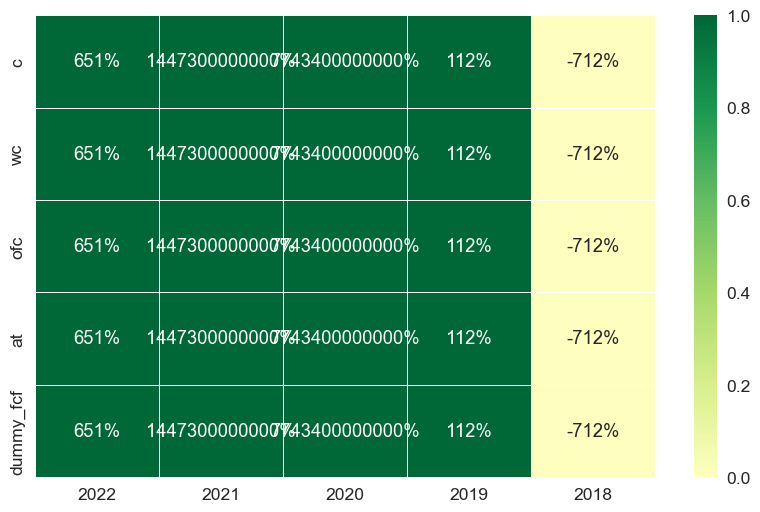

In [ ]:
# Numerical values should be adjusted
data = [[c, wc, ofc, at, dummy_fcf]]              
        
# Create the pandas DataFrame
results = pd.DataFrame(data, columns = ['2022', '2021', '2020','2019', '2018'],
                       index = ['c', 'wc', 'ofc', 'at','dummy_fcf'])
# results
plt.figure(figsize = (10,6))
sns.heatmap(results, cmap='RdYlGn', center=0, fmt='.0%', annot=True, linewidths=.5, vmin = 0, vmax = 1)

In [ ]:
# Provjera modela

In [ ]:
# For the last year


c = 6.51

wc = key_metrics.loc['workingCapital', '2022']

ofc = cash_flow_statement.loc['netCashProvidedByOperatingActivities', '2022']

at = key_metrics.loc['currentRatio', '2022']

dummy_fcf = -7.115

In [ ]:
#import numpy as np

def logarithmic_model(c, wc, ofc, at, dummy_fcf):
    result = np.log(c - wc - ofc - at - dummy_fcf)
    return result


# Calculate the result using the logarithmic model
model_result = logarithmic_model(c, wc, ofc, at, dummy_fcf)
print("Bankruptcy Model Result:", {ticker}, model_result) #.format(model_result)) # {max_dd * 100:.2f}%"


# Express the result as a percentage with two decimal places
model_result_percentage = '{:.2%}'.format(model_result)

print(f"Bankruptcy Model Result:", {ticker}, model_result_percentage)

print()
print('Provjeriti varijable')
print('Provjeriti formulu')

Bankruptcy Model Result: {'AAPL'} nan
Bankruptcy Model Result: {'AAPL'} nan%

Provjeriti varijable
Provjeriti formulu


In [ ]:
#import numpy as np

def logarithmic_model(c, wc, ofc, at, dummy_fcf):
    result = np.log(c - wc - ofc - at - dummy_fcf)
    return result


# Calculate the result using the logarithmic model
model_result = logarithmic_model(c, wc, ofc, at, dummy_fcf)

# Clip the result between 0 and 1
clipped_result = np.clip(model_result, 0, 1)

# Express the clipped result as a percentage with two decimal places
clipped_result_percentage = '{:.2%}'.format(clipped_result)

print(f"Bankruptcy Model Clipped Result:", {ticker}, clipped_result_percentage)

print()
print('Provjeriti varijable')
print('Provjeriti formulu')

Bankruptcy Model Clipped Result: {'AAPL'} nan%

Provjeriti varijable
Provjeriti formulu


In [ ]:
import math

# Right-hand side of the equation
rhs = 6.51 - (2.06e-07)*0.1 - (5.89e-06)*0.2 - 2.348 * 5 - 7.115*1

# Calculate p using logarithmic properties
p = math.exp(rhs) / (1 + math.exp(rhs))

print(f"The value of p is approximately {p * 100:.6f}%")

The value of p is approximately 0.000435%


In [ ]:
# RADI

import math

# Given values
c1 = 6.51
wc1 = -0.1 * -0.000000206
ofc1 = -0.2 * -0.00000589
at1 = 5 * -2.348
dummy_fcf1 = -7.115 * 1

# Calculate the sum of the values as z
z1 = c1 + wc1 + ofc1 + at1 + dummy_fcf1

# Calculate the probability using the logistic function
probability1 = 1 / (1 + math.exp(-z1))

bankruptcy_risk1 = np.log(z)

# Calculate the natural logarithm (ln) of the probability
log_probability1 = math.log(probability1)

print(f'c1 {c1}')
print(f'wc1 {wc1}')
print(f'ofc1 {ofc1}')
print(f'at1 {at1:.2f}')
print(f'dummy_fcf1 {dummy_fcf1}')
#print(f'bankruptcy_risk1 {bankruptcy_risk1}')

print(f'z1 = {z1:.2f}')

print(f"The probability is approximately {probability1 * 100:.6f}%")

print(f"The natural logarithm of the probability is approximately {log_probability1:.6f}")


c1 6.51
wc1 2.06e-08
ofc1 1.1780000000000002e-06
at1 -11.74
dummy_fcf1 -7.115
z1 = -12.34
The probability is approximately 0.000435%
The natural logarithm of the probability is approximately -12.345003


In [ ]:

bankruptcy_risk1 = np.log(probability1)
bankruptcy_risk1

-12.345003152851993

In [ ]:
import math

# Given values
wc1 = -0.1
ofc1 = -0.2
at1 = 5
dummyfcf1 = -7.115

# Calculate the sum of the values as z
z = wc1 + ofc1 + at1 + dummyfcf1

# Calculate the probability using the logistic function
probability = 1 / (1 + math.exp(-z))

# Calculate the natural logarithm (ln) of the probability
log_probability = math.log(probability)

print(f"The natural logarithm of the probability is approximately {log_probability:.6f}")


The natural logarithm of the probability is approximately -2.500597


In [ ]:
# Provjera

def logarithmic_model(c, wc, ofc, at, dummy_fcf):
    result = np.log(c - wc - ofc - at - dummy_fcf)
    return result

# Input values

c1 = 6.51
wc1 = -0.1
ofc1 = -0.2
at1 = 5
dummy_fcf1 = -7.115


"""


c = 6.51
wc = -1.41
ofc = -27.031
at = -6.807
dummy_fcf = -7.115

"""


# Calculate the result using the logarithmic model
model_result = logarithmic_model(c, wc, ofc, at, dummy_fcf)

# Clip the result between 0 and 1
#clipped_result = np.clip(model_result, 0, 1)

# Express the clipped result as a percentage with two decimal places
clipped_result_percentage = '{:.2%}'.format(clipped_result)

print("Clipped Result (%):", clipped_result_percentage)


Clipped Result (%): nan%


In [ ]:
import numpy as np

def logarithmic_model(c, wc, ofc, dummy_fcf):
    result = np.log(c - wc - ofc - dummy_fcf)
    return result

# Input values
"""
c = 1000
wc = 200
ofc = 150
at = 50
dummy_fcf = 50


c = 6.51
wc = -6699.7379
ofc = -297297.75
at = -5.173575519869755
dummy_fcf = -7.115

"""

c = 6.51
wc = -1.41
ofc = -27.031
at = -6.807
dummy_fcf = -7.115




# Calculate the result using the logarithmic model
model_result = logarithmic_model(c, wc, ofc, dummy_fcf)

# Express the result as a percentage with two decimal places
model_result_percentage = '{:.2%}'.format(model_result)

print("Model Result (%):", model_result_percentage)


Model Result (%): 373.92%


In [ ]:
"""
balance_sheet = fa.balance_sheet_statement(ticker, api_key_fa, period='annual')

# Function to format dictionary values with thousand separators and no decimal places
def format_dict_with_commas_no_decimals(input_dict):
    formatted_dict = {}
    for key, value in input_dict.items():
        if isinstance(value, (int, float)):
            formatted_value = '{:,0f}'.format(value)
            formatted_dict[key] = formatted_value
        else:
            formatted_dict[key] = value
    return formatted_dict

formatted_balance_sheet = format_dict_with_commas_no_decimals(balance_sheet)
print(formatted_balance_sheet)
"""

"\nbalance_sheet = fa.balance_sheet_statement(ticker, api_key_fa, period='annual')\n\n# Function to format dictionary values with thousand separators and no decimal places\ndef format_dict_with_commas_no_decimals(input_dict):\n    formatted_dict = {}\n    for key, value in input_dict.items():\n        if isinstance(value, (int, float)):\n            formatted_value = '{:,0f}'.format(value)\n            formatted_dict[key] = formatted_value\n        else:\n            formatted_dict[key] = value\n    return formatted_dict\n\nformatted_balance_sheet = format_dict_with_commas_no_decimals(balance_sheet)\nprint(formatted_balance_sheet)\n"

In [ ]:
import pandas_datareader as web


In [ ]:
#ticker.calendar

# SENTIMENT ANALYISIS

[*********************100%%**********************]  1 of 1 completed
Last stock price is $4622.44
Strike price where calls Open Interest is max is $6500.0 (40.6%)
Strike price where puts Open Interest is max is $1600.0 (-65.4%)


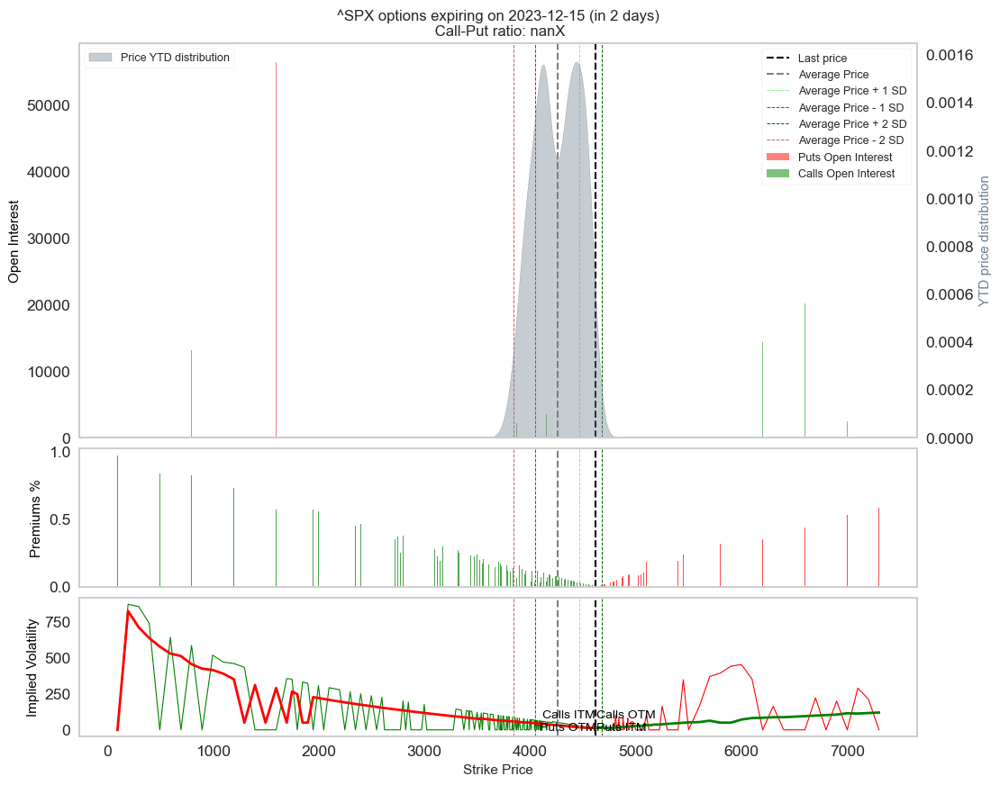

In [76]:
# Sentuiment analiza na osnovu Black-Scholes Modela

from datetime import datetime
from matplotlib.patches import Arrow
from yahoo_fin import options

ticker = '^SPX' #^SPX
dates = options.get_expiration_dates(ticker)

date_of_interest = dates[3]
quantity_to_use = 'Open Interest' #'Open interest' 'Volume'

chain = options.get_options_chain(ticker, date = date_of_interest)
date_of_interest = datetime.strptime(date_of_interest, '%B %d, %Y')
today = datetime.now()
days_difference = (date_of_interest - today).days

stock_price = yf.download(ticker, '2023-01-01', '2023-12-31', '1d')['Close']
last_stock_price = stock_price.iloc[-1]
last_stock_price_minus2 = stock_price.iloc[-2]
last_stock_price_minus3 = stock_price.iloc[-3]
average_price = np.mean(stock_price)  # Replace with your actual calculation
std_dev = np.std(stock_price)  # Replace with your actual calculation
price_plus_1std = average_price + std_dev
price_minus_1std = average_price - std_dev
price_plus_2std = average_price + 2 * std_dev
price_minus_2std = average_price - 2 * std_dev

calls = chain["calls"]
calls['Implied Volatility'] = pd.to_numeric(calls['Implied Volatility'].str.rstrip('%'), errors='coerce')
calls['% Change'] = pd.to_numeric(calls['% Change'].str.rstrip('%'), errors='coerce')
calls['% Change'] = calls['% Change'].fillna(0)
calls['Volume'] = pd.to_numeric(calls['Volume'], errors='coerce')
calls['Open Interest'] = pd.to_numeric(calls['Open Interest'], errors='coerce')
calls['Moneyness'] = np.where(calls['Strike'] > last_stock_price, 'OTM', 
                              np.where(calls['Strike'] < last_stock_price, 'ITM', 'ATM'))
closest_strike_call = calls['Strike'].iloc[(calls['Strike'] - last_stock_price).abs().idxmin()]
calls = calls.fillna(0)

puts = chain["puts"]
puts['Implied Volatility'] = pd.to_numeric(puts['Implied Volatility'].str.rstrip('%'), errors='coerce')
puts['% Change'] = pd.to_numeric(puts['% Change'].str.rstrip('%'), errors='coerce')
puts['% Change'] = puts['% Change'].fillna(0)
puts['Volume'] = pd.to_numeric(puts['Volume'], errors='coerce')
puts['Open Interest'] = pd.to_numeric(puts['Open Interest'], errors='coerce')
puts['Moneyness'] = np.where(puts['Strike'] > last_stock_price, 'ITM', 
                              np.where(puts['Strike'] < last_stock_price, 'OTM', 'ATM'))
closest_strike_put = puts['Strike'].iloc[(puts['Strike'] - last_stock_price).abs().idxmin()]
puts = puts.fillna(0)

max_calls_volume = np.max(calls[quantity_to_use])
max_puts_volume = np.max(puts[quantity_to_use])

# Find the strike price where calls['Volume'] is equal to the max volume
max_calls_strike = calls.loc[calls[quantity_to_use] == max_calls_volume, 'Strike'].values
max_calls_strike = max_calls_strike[0] if len(max_calls_strike) > 0 else None

# Find the strike price where puts['Volume'] is equal to the max volume
max_puts_strike = puts.loc[puts[quantity_to_use] == max_puts_volume, 'Strike'].values
max_puts_strike = max_puts_strike[0] if len(max_puts_strike) > 0 else None

# If max strike price is None, find the closest value
if max_calls_strike is None:
    max_calls_strike = calls.loc[calls[quantity_to_use].idxmax(), 'Strike']

if max_puts_strike is None:
    max_puts_strike = puts.loc[puts[quantity_to_use].idxmax(), 'Strike']
    
def find_closest_strike(data, target):
    return data['Strike'].iloc[(data['Strike'] - target).abs().idxmin()]

# Find the closest strike price for calls and puts
closest_strike_call = find_closest_strike(calls, last_stock_price)
closest_strike_put = find_closest_strike(puts, last_stock_price)

# Now, you can calculate the call-to-put ratio for these strike prices
call_to_put_ratio_call = calls.loc[calls['Strike'] == closest_strike_call, quantity_to_use].values[0] / puts.loc[puts['Strike'] == closest_strike_put, quantity_to_use].values[0]

print(f'Last stock price is ${round(last_stock_price, 2)}')
print(f'Strike price where calls {quantity_to_use} is max is ${max_calls_strike} ({(round(((max_calls_strike - last_stock_price) / last_stock_price)*100, 1))}%)')
print(f'Strike price where puts {quantity_to_use} is max is ${max_puts_strike} ({(round(((max_puts_strike - last_stock_price) / last_stock_price)*100, 1))}%)')

# Filter the data within a certain range
filtered_puts = puts
filtered_calls = calls

# Calculate the minimum and maximum values of calls['Volume'] within the central 90% range
lower_limit = np.percentile(calls[quantity_to_use], 5)
upper_limit = np.percentile(calls[quantity_to_use], 95)

# Filter calls within the central 90% range
# filtered_calls_central_90 = calls[(calls['Volume'] >= lower_limit) & (calls['Volume'] <= upper_limit)]

# Create a figure and a grid of subplots
fig, (ax1, ax2, ax4) = plt.subplots(3, 1, figsize=(12, 10), gridspec_kw={'height_ratios': [2, 0.7, 0.7]}, sharex=True)
fig.subplots_adjust(hspace=0.05)

bar_width = last_stock_price/(10*std_dev)
# Plot the first set of data (bar plot)
ax1.bar(filtered_puts['Strike'], filtered_puts[quantity_to_use], width=bar_width, color='red', label=f'Puts {quantity_to_use}', alpha=0.5)
ax1.bar(filtered_calls['Strike'], filtered_calls[quantity_to_use], width=bar_width, color='green', label=f'Calls {quantity_to_use}', alpha=0.5)

ax1.axvline(last_stock_price, color='black', label='Last price', ls='--', lw=1.5)
# ax1.axvline(max_calls_strike, color='green', linestyle='--', label='Strike price @ max calls volume', lw=1.5)
# ax1.axvline(max_puts_strike, color='red', linestyle='--', label='Strike price @ max puts volume', lw=1.5)
ax1.axvline(average_price, color='gray', linestyle='--', label='Average Price', lw=1.5)
ax1.axvline(price_plus_1std, color='lightgreen', linestyle='--', label='Average Price + 1 SD', lw=0.7)
ax1.axvline(price_minus_1std, color='red', linestyle='--', label='Average Price - 1 SD', lw=0.7)
ax1.axvline(price_plus_2std, color='darkgreen', linestyle='--', label='Average Price + 2 SD', lw=0.7)
ax1.axvline(price_minus_2std, color='indianred', linestyle='--', label='Average Price - 2 SD', lw=0.7)

ax2.axvline(last_stock_price, color='black', label='Last price', ls='--', lw=1.5)
# ax2.axvline(max_calls_strike, color='green', linestyle='--', label='Strike price @ max calls volume', lw=1.5)
# ax2.axvline(max_puts_strike, color='red', linestyle='--', label='Strike price @ max puts volume', lw=1.5)
ax2.axvline(average_price, color='gray', linestyle='--', label='Average Price', lw=1.5)
ax2.axvline(price_plus_1std, color='lightgreen', linestyle='--', label='Average Price + 1 SD', lw=0.7)
ax2.axvline(price_minus_1std, color='red', linestyle='--', label='Average Price - 1 SD', lw=0.7)
ax2.axvline(price_plus_2std, color='darkgreen', linestyle='--', label='Average Price + 2 SD', lw=0.7)
ax2.axvline(price_minus_2std, color='indianred', linestyle='--', label='Average Price - 2 SD', lw=0.7)

# Set labels and title for the first y-axis
ax1.set_ylabel(quantity_to_use, color='black', fontsize=11)
ax1.set_title(f'{ticker} options expiring on {date_of_interest.date()} (in {days_difference} days)\n Call-Put ratio: {round(call_to_put_ratio_call,1)}X', fontsize=12)

# Add legend for the first y-axis
ax1.legend(fontsize=9)

# Plot the second set of data (calls['Last Price']) as a bar plot
ax2.bar(filtered_calls['Strike'], filtered_calls['Last Price']/last_stock_price, color='green', alpha=0.7, label='Premium - calls', width = bar_width)
ax2.bar(puts['Strike'], puts['Last Price']/last_stock_price, color='red', alpha=0.7, label='Premium - puts', width = bar_width)

ax2.set_ylabel('Premiums %', color='black', fontsize=11)

# Share y-axis between the two subplots
ax2.legend().set_visible(False)

# Create a second y-axis for the KDE plot on the main subplot
ax3 = ax1.twinx()
sns.kdeplot(stock_price, label='Price YTD distribution', color='slategray', linewidth=0.2, ax=ax3, fill=True, alpha=0.4)
ax3.set_ylabel('YTD price distribution', color='slategray', fontsize=11)
ax3.legend(fontsize=9, loc='upper left')


# Plot implied volatility for calls and puts on the new subplot (ax4)
ax4.plot(calls['Strike'], calls['Implied Volatility'], label='Calls', color='green', linestyle='-', lw=0.8)
ax4.plot(puts['Strike'], puts['Implied Volatility'], label='Puts', color='red', linestyle='-', lw=0.8)

# Find the indices where puts are ITM (In-The-Money)
puts_ITM_indices = puts[puts['Strike'] < last_stock_price].index
# Find the indices where calls are ITM (In-The-Money)
calls_ITM_indices = calls[calls['Strike'] > last_stock_price].index

# Increase line width for puts that go from zero until last_stock_price
ax4.plot(puts.loc[puts_ITM_indices, 'Strike'], puts.loc[puts_ITM_indices, 'Implied Volatility'],
         label='Puts ITM', color='red', linestyle='-', lw=2)

# Increase line width for calls that go from last_stock_price upwards
ax4.plot(calls.loc[calls_ITM_indices, 'Strike'], calls.loc[calls_ITM_indices, 'Implied Volatility'],
         label='Calls ITM', color='green', linestyle='-', lw=2)

ax4.axvline(last_stock_price, color='black', label='Last price', ls='--', lw=1.5)
# ax4.axvline(max_calls_strike, color='green', linestyle='--', label='Strike price @ max calls volume', lw=1.5)
# ax4.axvline(max_puts_strike, color='red', linestyle='--', label='Strike price @ max puts volume', lw=1.5)
ax4.axvline(average_price, color='gray', linestyle='--', label='Average Price', lw=1.5)
ax4.axvline(price_plus_1std, color='lightgreen', linestyle='--', label='Average Price + 1 SD', lw=0.7)
ax4.axvline(price_minus_1std, color='red', linestyle='--', label='Average Price - 1 SD', lw=0.7)
ax4.axvline(price_plus_2std, color='darkgreen', linestyle='--', label='Average Price + 2 SD', lw=0.7)
ax4.axvline(price_minus_2std, color='indianred', linestyle='--', label='Average Price - 2 SD', lw=0.7)

# Set labels and title for the new subplot
# ax1.set_xlabel('Strike Price', fontsize=11)
# ax2.set_xlabel('Strike Price', fontsize=11)
# ax3.set_xlabel('Strike Price', fontsize=11)
ax4.set_xlabel('Strike Price', fontsize=11)
ax4.set_ylabel('Implied Volatility', color='black', fontsize=11)
# ax4.legend(fontsize=9)

# Share x-axis with the other subplots
# ax4.get_shared_x_axes().join(ax4, ax1, ax2, ax3)

# Add arrows and annotations
arrow_props = dict(facecolor='black', arrowstyle='->')

# Arrow to the right
ax4.annotate(f'Calls OTM\nPuts ITM', xy=(last_stock_price+2, calls['Implied Volatility'].mean()),
             xytext=(last_stock_price+2, calls['Implied Volatility'].mean()),
             arrowprops=arrow_props, fontsize=10, ha='left', va='center', color='black')

# Arrow to the left
ax4.annotate(f'Calls ITM\nPuts OTM', xy=(last_stock_price-2, calls['Implied Volatility'].mean()),
             xytext=(last_stock_price-2, calls['Implied Volatility'].mean()),
             arrowprops=arrow_props, fontsize=10, ha='right', va='center', color='black')

plt.xticks(fontsize=8, rotation=45)  # You can adjust rotation if needed

# Show the plot
plt.show()


In [ ]:
"""
The call-put ratio, also known as the put-call ratio, is a financial metric that compares the trading volume of call options to put options in a particular market. This ratio is calculated by dividing the total trading volume of call options by the total trading volume of put options. The resulting ratio can provide insights into market sentiment and investor expectations.

Formula:
Call-Put Ratio = Total Call Options Volume / Total Put Options Volume

Interpretation:
Call-Put Ratio Greater Than 1:

If the ratio is greater than 1, it indicates that there is a higher trading activity in call options compared to put options.
This might suggest a bullish sentiment in the market, as investors are showing more interest in buying call options to benefit
from potential upward movements in the underlying asset's price.

Call-Put Ratio Less Than 1:

If the ratio is less than 1, it implies that there is more trading activity in put options relative to call options.
This could signal a bearish sentiment, as investors might be buying more put options to protect against potential declines
in the underlying asset's price.
"""

In [77]:
puts.Volume.tail()

382   7.00
383   1.00
384   0.00
385   2.00
386   4.00
Name: Volume, dtype: float64

In [78]:
calls.Volume.tail()

357     1.00
358     1.00
359   150.00
360   150.00
361     1.00
Name: Volume, dtype: float64

In [ ]:
import newsapi # api key: c06644735d4a45a7be03f724ca228842
#from newsapi import get_everything
from newsapi.newsapi_client import NewsApiClient
from newsapi import NewsApiClient
from textblob import TextBlob
import GoogleNews as gn

import re

api_key = 'c06644735d4a45a7be03f724ca228842' # Nedim

api = NewsApiClient(api_key='c06644735d4a45a7be03f724ca228842')

newsapi = NewsApiClient(api_key='c06644735d4a45a7be03f724ca228842')


import pyarrow


import GoogleNews as gn
#import yahoo_news
from yahoo_fin import stock_info as si
from yahoo_fin import news
#from textblob import TextBlob

In [ ]:
symbol = 'AAPL'

holdings = ['C', 'META', 'QCOM', 'VSCO', 'NVIDA'] # define the list of holdings to search for

central_banks = ['FED', 'ECB', 'BOJ', 'RBA', 'BOE', 'central bank'] # define the list of major central banks to search for

inflation_words = ['inflation', 'PCE', 'CPI'] # define the list of words related to inflation to search for

start_time = time.time()

news_items = news.get_yf_rss(symbol)

df = pd.DataFrame(news_items, columns=['title', 'summary', 'link', 'published'])

df['link'] = df['link'].apply(lambda x: f'<a href="{x}" target="_blank">Link</a>')

df['sentiment'] = df['summary'].apply(lambda x: TextBlob(x).sentiment.polarity)

df = df.sort_values(by='published', ascending=False)  # sort by pubDate in descending order

df.index += 1  # start index from 1 instead of 0

df.index.name = 'No.'

df['published'] = pd.to_datetime(df['published']).dt.date.astype(str)

# Set display options to show the full text and enable HTML rendering

pd.set_option('display.max_colwidth', None)

pd.set_option('display.html.use_mathjax', False)

# Add a Total row to show the average sentiment score

total_sentiment = df['sentiment'].mean()

total_row = pd.DataFrame({

    'title': 'Total',

    'summary': '',

    'link': '',

    'sentiment': total_sentiment,

    'published': ''

}, index=[''])

# Concatenate the DataFrame with the Total row

df = pd.concat([df, total_row])

# Apply the formatting function to the sentiment column

styled_df = df.style.format({'sentiment': '{:.3f}'}).applymap(color_sentiment, subset=['sentiment']).applymap(highlight_holdings, subset=['title', 'summary']).applymap(highlight_central_banks, subset=['title', 'summary']).applymap(highlight_inflation, subset=['title', 'summary'])

# Render the table as HTML

html_table = styled_df.render(escape=False) 

# Display the table in Jupyter notebook

from IPython.core.display import display, HTML

print(f'Latest news for \033[1m\033[4m{symbol}\033[0m:')

display(HTML(html_table))

elapsed_time = time.time() - start_time

print(f"Elapsed time: {elapsed_time:.2f} seconds")


NameError: name 'color_sentiment' is not defined

In [ ]:
df

,title,summary,link,published,sentiment
7,ChatGPT: Everything you need to know about the AI-powered chatbot,"ChatGPT, OpenAI’s text-generating AI chatbot, has taken the world by storm. What started as a tool to hyper-charge productivity through writing essays and code with short text prompts has evolved into a behemoth used by more than 92% of Fortune 500 companies for more wide-ranging needs. And that growth has propelled OpenAI itself into becoming one of the most-hyped companies in recent memory, even if CEO and co-founder Sam Altman's firing and swift return raised concerns about its direction and","<a href=""https://techcrunch.com/2023/11/22/chatgpt-everything-to-know-about-the-ai-chatbot/?.tsrc=rss"" target=""_blank"">Link</a>",2023-11-22,0.290000
8,Disney: Will Thanksgiving reverse box office slump? Can Iger 'strengthen' studio output?,Disney is hoping to reverse its Thanksgiving slump at the box office this year. But is that just wishful thinking?,"<a href=""https://finance.yahoo.com/news/disney-will-thanksgiving-reverse-box-office-slump-can-iger-strengthen-studio-output-184715068.html?.tsrc=rss"" target=""_blank"">Link</a>",2023-11-22,0.000000
9,Alphabet (GOOGL) Enhances Google Maps With New Color Palette,Alphabet (GOOGL) unveils a color palette feature amid an array of recent feature updates for Google Maps.,"<a href=""https://finance.yahoo.com/news/alphabet-googl-enhances-google-maps-172300193.html?.tsrc=rss"" target=""_blank"">Link</a>",2023-11-22,0.000000
10,iPhone 15 breaks smartphone market's sales slump,"After 27 consecutive months of sales sinking year over year, new research says the iPhone 15 helped the global smartphone market see its first positive growth since June 2021.","<a href=""https://appleinsider.com/articles/23/11/22/iphone-15-breaks-smartphone-markets-sales-slump?.tsrc=rss"" target=""_blank"">Link</a>",2023-11-22,0.153409
11,Is Microsoft Stock a Buy?,"The software giant, which sports a $2.8 trillion market capitalization, has gained 60% so far in 2023, compared to a 17% boost for the S&amp;P 500 and a 35% spike in the tech-heavy Nasdaq Composite Index. CEO Satya Nadella has mentioned the emerging tech in each of the last few earnings updates, giving it top billing as a growth avenue over the next few years. The good news is that investors aren't simply relying on hype around AI to support the bullish-growth thesis.","<a href=""https://finance.yahoo.com/m/3bd6ceab-ce26-39a0-8792-5d3aa479dd66/is-microsoft-stock-a-buy%3F.html?.tsrc=rss"" target=""_blank"">Link</a>",2023-11-22,0.100000
12,"Lyford, Texas gains Apple Distinguished status for its schools","TMache elementary, middle school, and high school in Lyford, Texas, have been recognized by Apple in its Apple Distinguished School program.","<a href=""https://appleinsider.com/articles/23/11/22/lyford-texas-gains-apple-distinguished-status-for-its-schools?.tsrc=rss"" target=""_blank"">Link</a>",2023-11-22,0.153333
13,The Single Best Thing To Buy on Black Friday in 2023,"Black Friday is almost here, which means major retailers are gearing up to offer incredible deals on tech devices, appliances, clothing and more. With so many sales happening all at once, it can be...","<a href=""https://finance.yahoo.com/news/single-best-thing-buy-black-120018236.html?.tsrc=rss"" target=""_blank"">Link</a>",2023-11-22,0.359167
14,Some Charts Are Like Comparing Apples and JPMorgans,"Let's tackle some tough reads, and see why certain stocks seem allowed to trade like JPM and AAPL, as others trade like Bank of America.","<a href=""https://finance.yahoo.com/m/487d97c5-eedd-3856-96b0-c15cec48c47d/some-charts-are-like.html?.tsrc=rss"" target=""_blank"">Link</a>",2023-11-22,-0.087302
15,Incognito Mode Isn’t Doing What You Think It’s Doing,"There is an urban myth that says online shoppers who doggedly search for certain items on the web get tagged by algorithms that then cause them to see higher prices than others shopping for those same items. The solution for many people:

In [ ]:
symbol =  'META' #ticker #'META' #ticker #'GC=F'
news_items = news.get_yf_rss(symbol)

df = pd.DataFrame(news_items, columns=['title', 'summary', 'link'])
df['link'] = df['link'].apply(lambda x: f'<a href="{x}" target="_blank">Link</a>')
df['sentiment'] = df['summary'].apply(lambda x: TextBlob(x).sentiment.polarity)
df = df.sort_values(by='sentiment', ascending=False)  # sort by sentiment in descending order
df.index += 1  # start index from 1 instead of 0
df.index.name = 'No.'

# Set display options to show the full text and enable HTML rendering
pd.set_option('display.max_colwidth', None)
pd.set_option('display.html.use_mathjax', False)

# Define a formatting function to color negative sentiment red and positive sentiment green
def color_sentiment(val):
    if val < 0:
        color = 'red'
    elif val > 0:
        color = 'green'
    else:
        color = 'black'
    return f'color: {color}'

# Add a Total row to show the average sentiment score
total_sentiment = df_s['sentiment'].mean()
total_row = pd.DataFrame({
    'title': 'Total',
    'summary': '',
    'link': '',
    'sentiment': total_sentiment
}, index=[''])

# Concatenate the DataFrame with the Total row
df = pd.concat([df, total_row])

# Apply the formatting function to the sentiment column
# styled_df = df.style.applymap(color_sentiment, subset=['sentiment'])
styled_df_s = df_s.style.format({'sentiment': '{:.3f}'}).applymap(color_sentiment, subset=['sentiment'])  # format sentiment scores as numbers with 3 decimal places

# Render the table as HTML
html_table = styled_df_s.render(escape=False)

# Display the table in Jupyter notebook
from IPython.core.display import display, HTML
print(f'Hi Nedim. The Latest news for \033[1m\033[4m{symbol}\033[0m:')
display(HTML(html_table))

NameError: name 'df_s' is not defined

In [ ]:
# define a formatting function to color negative sentiment red and positive sentiment green
def color_sentiment(val):
    if val < 0:
        color = 'red'
    elif val > 0:
        color = 'green'
    else:
        color = 'black'
    return f'color: {color}'

# define a function to highlight the holdings in the title or description
def highlight_holdings(val):
    for holding in holdings:
        if re.search(r'\b{}\b'.format(holding), val, re.IGNORECASE):
            return 'background-color: yellow'
    return ''

# define a function to highlight mentions of the major central banks
def highlight_central_banks(val):
    for cb in central_banks:
        if re.search(r'\b{}\b'.format(cb), val, re.IGNORECASE):
            return 'background-color: lightblue'
    return ''

# define a function to highlight mentions of inflation
def highlight_inflation(val):
    for word in inflation_words:
        if re.search(r'\b{}\b'.format(word), val, re.IGNORECASE):
            return 'background-color: orange'
    return ''

In [ ]:
category='business'
language='en'
holdings = ['C', 'META', 'QCOM', 'VSCO', 'QUAL'] # define the list of holdings to search for

news_items = newsapi.get_everything(
    q=category, #bbc-news, 
    qintitle=None,
    sources=None,
    domains=None,
    exclude_domains=None,
    from_param=None,
    to=None,
    language=language,
    sort_by=None,
    page=None,
    page_size=None,
)

# create a DataFrame with the article data
df = pd.DataFrame(news_items['articles'], columns=['source', 'title', 'description', 'url'])
df['source'] = df['source'].apply(lambda x: x['name'])  # extract only the source name
df['url'] = df['url'].apply(lambda x: f'<a href="{x}" target="_blank">Link</a>')
df['description'] = df['description'].fillna('')
df['sentiment'] = df['description'].apply(lambda x: round(TextBlob(x).sentiment.polarity, 3))  # round sentiment scores to 3 decimal places
df = df.sort_values(by='sentiment', ascending=False)  # sort by sentiment in descending order
df.index += 1
df.index.name = 'No.'

# define a formatting function to color negative sentiment red and positive sentiment green
def color_sentiment(val):
    if val < 0:
        color = 'red'
    elif val > 0:
        color = 'green'
    else:
        color = 'black'
    return f'color: {color}'

# define a function to highlight the holdings in the title or description
def highlight_holdings(val):
    for holding in holdings:
        if re.search(r'\b{}\b'.format(holding), val, re.IGNORECASE):
            return 'background-color: lightgreen'
    return ''

# apply the formatting functions to the sentiment and title/description columns
styled_df = df.style.format({'sentiment': '{:.3f}'}).applymap(color_sentiment, subset=['sentiment']).applymap(highlight_holdings, subset=['title', 'description'])

# add a total row to show the average sentiment score
total_sentiment = df['sentiment'].mean()
total_row = pd.DataFrame({
    'source': 'Total',
    'title': '',
    'description': '',
    'url': '',
    'sentiment': round(total_sentiment, 3)  # round total sentiment score to 3 decimal places
}, index=[''])

# concatenate the DataFrame with the total row
df = pd.concat([df, total_row])

# render the table as HTML
html_table = styled_df.render(escape=False)

# display the table in Jupyter notebook
from IPython.core.display import display, HTML
print(f'Hi Nedim. Here are the latest \033[1m\033[4m{category}\033[0m news in \033[1m\033[4m{language}\033[0m language, with highlights to my holdings:')
display(HTML(html_table))

AttributeError: 'Styler' object has no attribute 'render'

In [ ]:
symbol = 'META'

holdings = equity_tickers # define the list of holdings to search for
central_banks = ['FED', 'ECB', 'BOJ', 'RBA', 'BOE', 'central bank'] # define the list of major central banks to search for
inflation_words = ['inflation', 'PCE', 'CPI'] # define the list of words related to inflation to search for
start_time = time.time()
news_items = news.get_yf_rss(symbol)

df = pd.DataFrame(news_items, columns=['title', 'summary', 'link', 'published'])
df['link'] = df['link'].apply(lambda x: f'<a href="{x}" target="_blank">Link</a>')
df['sentiment'] = df['summary'].apply(lambda x: TextBlob(x).sentiment.polarity)
df = df.sort_values(by='published', ascending=False)  # sort by pubDate in descending order
df.index += 1  # start index from 1 instead of 0
df.index.name = 'No.'
df['published'] = pd.to_datetime(df['published']).dt.date.astype(str)

# Set display options to show the full text and enable HTML rendering
pd.set_option('display.max_colwidth', None)
pd.set_option('display.html.use_mathjax', False)

# Add a Total row to show the average sentiment score
total_sentiment = df['sentiment'].mean()
total_row = pd.DataFrame({
    'title': 'Total',
    'summary': '',
    'link': '',
    'sentiment': total_sentiment,
    'published': ''
}, index=[''])

# Concatenate the DataFrame with the Total row
df = pd.concat([df, total_row])

# Apply the formatting function to the sentiment column
styled_df = df.style.format({'sentiment': '{:.3f}'}).applymap(color_sentiment, subset=['sentiment']).applymap(highlight_holdings, subset=['title', 'summary']).applymap(highlight_central_banks, subset=['title', 'summary']).applymap(highlight_inflation, subset=['title', 'summary'])

# Render the table as HTML
html_table = styled_df.render(escape=False)

# Display the table in Jupyter notebook
from IPython.core.display import display, HTML
print(f'Latest news for \033[1m\033[4m{symbol}\033[0m:')
display(HTML(html_table))

elapsed_time = time.time() - start_time
print(f"Elapsed time: {elapsed_time:.2f} seconds")

NameError: name 'equity_tickers' is not defined

In [ ]:
from datetime import datetime

# define the search parameters
search_item = 'recession'
language = 'en'
holdings = equity_tickers # define the list of holdings to search for
central_banks = ['FED', 'ECB', 'BOJ', 'RBA', 'BOE', 'central bank'] # define the list of major central banks to search for
inflation_words = ['inflation', 'PCE', 'CPI'] # define the list of words related to inflation to search for

news_items = newsapi.get_everything(
    q=search_item,
    qintitle=None,
    sources=None,
    domains=None,
    exclude_domains=None,
    from_param=None,
    # to=None,
    to = datetime.now(),
    language=language,
    sort_by=None,
    page=None,
    page_size=None
)

# create a DataFrame with the article data
df = pd.DataFrame(news_items['articles'], columns=['source', 'title', 'description', 'url', 'publishedAt'])
df['source'] = df['source'].apply(lambda x: x['name'])  # extract only the source name
df['url'] = df['url'].apply(lambda x: f'<a href="{x}" target="_blank">Link</a>')
df['description'] = df['description'].fillna('')
df['sentiment'] = df['description'].apply(lambda x: round(TextBlob(x).sentiment.polarity, 3))  # round sentiment scores to 3 decimal places
df['date'] = pd.to_datetime(df['publishedAt']).dt.date  # extract the date from the publishedAt column
df = df.drop('publishedAt', axis=1)  # drop the original publishedAt column
df = df.sort_values(by='date', ascending=False)  # sort by date in descending order
df.index += 1
df.index.name = 'No.'

# apply the formatting functions to the sentiment and title/description columns
styled_df = df.style.format({'sentiment': '{:.3f}'}).applymap(color_sentiment, subset=['sentiment']).applymap(highlight_holdings, subset=['title', 'description']).applymap(highlight_central_banks, subset=['title', 'description']).applymap(highlight_inflation, subset=['title', 'description'])

# add a total row to show the average sentiment score
total_sentiment = df['sentiment'].mean()
total_row = pd.DataFrame({
    'source': 'Total',
    'title': '',
    'description': '',
    'url': '',
    'sentiment': round(total_sentiment, 3)  # round total sentiment score to 3 decimal places
}, index=[''])

# concatenate the DataFrame with the total row
df = pd.concat([df, total_row])

# render the table as HTML
html_table = styled_df.render(escape=False)

# display the table in Jupyter notebook
from IPython.core.display import display, HTML
print(f'Latest \033[1m\033[4m{search_item}\033[0m news in \033[1m\033[4m{language}\033[0m language:')
display(HTML(html_table))

elapsed_time = time.time() - start_time
print(f"Elapsed time: {elapsed_time:.2f} seconds")

NameError: name 'equity_tickers' is not defined

In [ ]:
from matplotlib.colors import LinearSegmentedColormap
# set the news source and fetch top headlines
language = 'en'
holdings = ticker # define the list of holdings to search for
central_banks = ['FED', 'ECB', 'BOJ', 'RBA', 'BOE', 'central bank'] # define the list of major central banks to search for
inflation_words = ['inflation', 'PCE', 'CPI'] # define the list of words related to inflation to search for

search_item = 'rate'
news_items = newsapi.get_everything(
    q=search_item,
    qintitle=None,
    sources=None,
    domains=None,
    exclude_domains=None,
    from_param=None,
    to=None,
    language=language,
    sort_by=None,
    page=None,
    page_size=None
)

# create a DataFrame with the article data
df = pd.DataFrame(news_items['articles'], columns=['source', 'title', 'description', 'url', 'publishedAt'])
df['source'] = df['source'].apply(lambda x: x['name'])  # extract only the source name
df['url'] = df['url'].apply(lambda x: f'<a href="{x}" target="_blank">Link</a>')
df['description'] = df['description'].fillna('')
df['sentiment'] = df['description'].apply(lambda x: round(TextBlob(x).sentiment.polarity, 3))  # round sentiment scores to 3 decimal places
df['date'] = pd.to_datetime(df['publishedAt']).dt.date  # extract the date from the publishedAt column
df = df.drop('publishedAt', axis=1)  # drop the original publishedAt column
df = df.sort_values(by='date', ascending=False)  # sort by date in descending order
df.index += 1
df.index.name = 'No.'

# apply the formatting functions to the sentiment and title/description columns
styled_df = df.style.format({'sentiment': '{:.3f}'}).applymap(color_sentiment, subset=['sentiment']).applymap(subset=['title', 'description']).applymap(highlight_central_banks, subset=['title', 'description']).applymap(highlight_inflation, subset=['title', 'description'])

# add a total row to show the average sentiment score
total_sentiment = df['sentiment'].mean()
total_row = pd.DataFrame({
    'source': 'Total',
    'title': '',
    'description': '',
    'url': '',
    'sentiment': round(total_sentiment, 3)  # round total sentiment score to 3 decimal places
}, index=[''])

# concatenate the DataFrame with the total row
df = pd.concat([df, total_row])

# render the table as HTML
html_table = styled_df.render(escape=False)

# display the table in Jupyter notebook
from IPython.core.display import display, HTML
print(f'Latest news about \033[1m\033[4m{search_item}\033[0m news in \033[1m\033[4m{language}\033[0m language:')
display(HTML(html_table))

elapsed_time = time.time() - start_time
print(f"Elapsed time: {elapsed_time:.2f} seconds")

TypeError: Styler.applymap() missing 1 required positional argument: 'func'

# MONTE CARLO SIMULATION

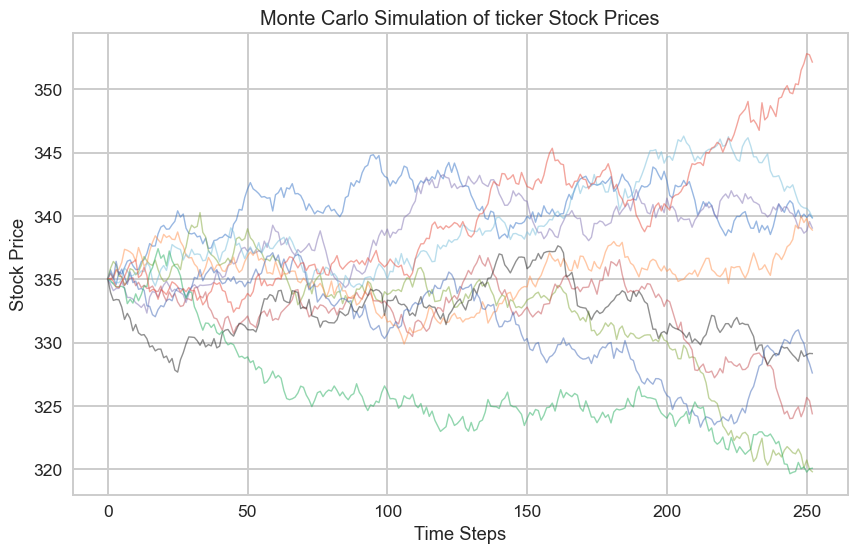

In [ ]:

# See file Dubai Green Fund v2

# For AAPLE ticker by ChatGPT
"""
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

"""
class MonteCarlo:
    def __init__(self, price_data, time_steps, num_simulations):
        self.price_data = price_data
        self.time_steps = time_steps
        self.num_simulations = num_simulations

    def monte_carlo_simulation(self):
        # Calculate daily returns from price data
        daily_returns = self.price_data['Close'].pct_change().dropna()

        # Calculate drift and volatility
        drift = daily_returns.mean()
        volatility = daily_returns.std()

        dt = 1.0 / self.time_steps
        returns = np.random.normal((drift * dt), (volatility * np.sqrt(dt)), size=(self.time_steps, self.num_simulations))
        price_paths = np.zeros((self.time_steps + 1, self.num_simulations))
        price_paths[0, :] = self.price_data['Close'].iloc[-1]  # Start from the last available price

        for i in range(1, self.time_steps + 1):
            price_paths[i, :] = price_paths[i - 1, :] * (1 + returns[i - 1, :])

        return price_paths

    def plot(self):
        simulated_price_paths = self.monte_carlo_simulation()

        plt.figure(figsize=(10, 6))
        for i in range(self.num_simulations):
            plt.plot(simulated_price_paths[:, i], lw=1, alpha=0.5)
        plt.xlabel('Time Steps')
        plt.ylabel('Stock Price')
        plt.title('Monte Carlo Simulation of ticker Stock Prices')
        plt.grid(True)
        plt.show()

# Fetch historical AAPL data from Yahoo Finance

aapl = yf.Ticker(ticker)
aapl_data = aapl.history(period='max')

num_time_steps = 252
num_simulations = 10

monte_carlo_instance = MonteCarlo(aapl_data, num_time_steps, num_simulations)
monte_carlo_instance.plot()


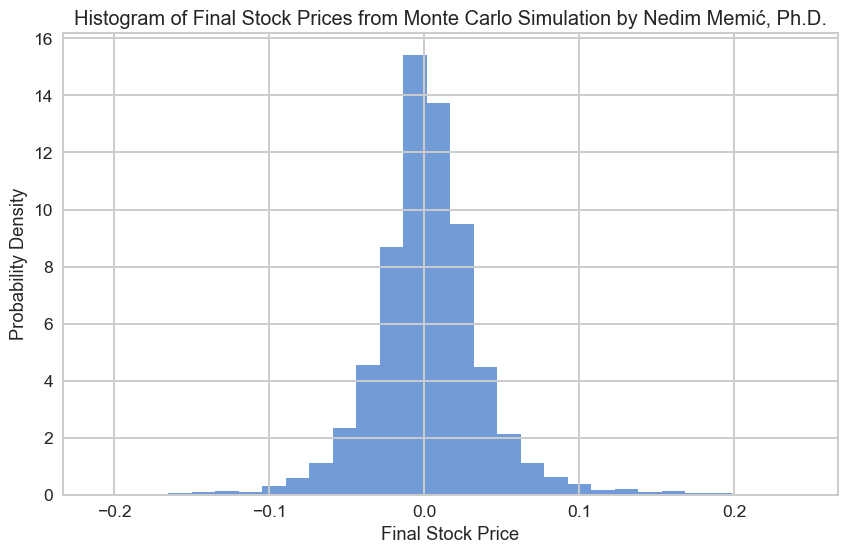

In [ ]:
#import numpy as np
#import matplotlib.pyplot as plt

#def monte_carlo_simulation(initial_price, drift, volatility, time_steps, num_simulations):
    # ... (same code as before) ...

# Example usage:
#initial_stock_price = 100.0
#expected_return = 0.08  # 8% annual return
#volatility = 0.2  # 20% annual volatility
#num_time_steps = 252  # Trading days in a year (assuming 252 trading days)
#num_simulations = 1000

# Perform the Monte Carlo simulation
#simulated_price_paths = monte_carlo_simulation(initial_stock_price, expected_return, volatility, num_time_steps, num_simulations)

# Extract the final prices from the last time step for all simulations
#final_prices = simulated_price_paths[-1, :]

# Plot a histogram of the final prices
plt.figure(figsize=(10, 6))
plt.hist(returns, bins=30, density=True, alpha=0.7)
plt.xlabel('Final Stock Price')
plt.ylabel('Probability Density')
plt.title('Histogram of Final Stock Prices from Monte Carlo Simulation by Nedim Memić, Ph.D.')
plt.grid(True)
plt.show()

In [ ]:
monte_carlo_instance

In [ ]:
MonteCarlo

__main__.MonteCarlo

In [ ]:
# Calculate portfolio metrics
returns['Equities_Direct_Portfolio'] = returns[equities_direct].mean(axis=1)
returns['Equities_Funds_Portfolio'] = returns[equities_funds].mean(axis=1)
returns['Fixed_Income_Portfolio'] = returns[fixed_income].mean(axis=1)
returns['Overall_Portfolio'] = returns.mean(axis=1)

# Number of iterations for Monte Carlo simulation
num_iterations = 1000

# Number of trading days in a year (assuming 252 trading days)
num_trading_days = 252

# Initial investment amount
initial_investment = 1

# Define different colors for each portfolio
portfolio_colors = ['blue', 'yellowgreen', 'purple', 'darkgray']

# Create a figure and array of subplots
fig, axs = plt.subplots(4, 2, figsize=(12, 18), sharey = True)

# Loop through each portfolio and perform Monte Carlo simulation
for i, portfolio in enumerate(['Equities_Direct_Portfolio', 'Equities_Funds_Portfolio', 'Fixed_Income_Portfolio', 'Overall_Portfolio']):
    returns = returns[portfolio]
    mean_return = portfolio_returns.mean()
    std_dev = returns.std()

    # Create an array to store the simulation results for each iteration
    simulation_results = np.zeros((num_trading_days, num_iterations))

    # Perform the Monte Carlo simulation
    for j in range(num_iterations):
        # Generate random returns based on a normal distribution
        random_returns = np.random.normal(mean_return, std_dev, num_trading_days)

        # Calculate cumulative returns
        cumulative_returns = (random_returns + 1).cumprod()

        # Calculate the portfolio value at each time step
        portfolio_value = initial_investment * cumulative_returns

        # Store the portfolio values for each iteration in the results array
        simulation_results[:, j] = portfolio_value

    # Store the simulation results in the DataFrame
    monte_carlo_df = pd.DataFrame(simulation_results, index=data.index[:num_trading_days])

    # Color all lines below the 1st percentile in red, others with the portfolio color
    portfolio_color = portfolio_colors[i]
    below_1st_percentile_mask = monte_carlo_df.iloc[-1] < np.percentile(simulation_results[-1], 1)
    
    axs[i, 0].plot(range(1, num_trading_days + 1), monte_carlo_df.loc[:, below_1st_percentile_mask], color='red', alpha=0.2)
    axs[i, 0].plot(range(1, num_trading_days + 1), monte_carlo_df.loc[:, ~below_1st_percentile_mask], color=portfolio_color, alpha=0.02)

    axs[i, 0].set_title(f"Monte Carlo simulation for {portfolio} based on {num_iterations} iterations", fontsize = 10)
    axs[i, 0].set_xlabel('Trading Days in future', fontsize = 9)
    axs[i, 0].set_ylabel('Portfolio Value')

    # Plot distribution plot using the corresponding color
    hist_plot = axs[i, 1].hist(simulation_results[-1, :], bins=30, orientation='horizontal', color=portfolio_colors[i], rwidth = 0.8, alpha=0.6)
    axs[i, 1].set_xlabel('Frequency', fontsize = 9)
    # axs[i, 1].set_ylabel('Portfolio Value')
    axs[i, 1].yaxis.tick_right()

    # Get percentiles (1st, 5th, 95th) from the simulation results
    percentiles = np.percentile(simulation_results[-1, :], [1, 5])

    # Calculate VaR (95th percentile)
    var_95 = np.percentile(simulation_results[-1, :], 5)

    # Calculate CVaR (Conditional Value at Risk, or Expected Shortfall)
    cvar_95 = simulation_results[-1, simulation_results[-1, :] <= var_95].mean()
    
    # Calculate maximum, minimum, mean, and median values
    max_value = monte_carlo_df.iloc[-1].max()
    min_value = monte_carlo_df.iloc[-1].min()
    mean_value = monte_carlo_df.iloc[-1].mean()
    median_value = monte_carlo_df.iloc[-1].median()
    
    # Convert VaR and CVaR to percentage losses
    var_95_percentage = (1 - var_95 / initial_investment) * 100
    cvar_95_percentage = (1 - cvar_95 / initial_investment) * 100
    
    # Calculate expected outcome (most likely value)
    expected_outcome = monte_carlo_df.iloc[-1].mean()
    expected_return = -(1-expected_outcome)*100
    
    # Add annotation text boxes for VaR and CVaR
    axs[i, 0].annotate(f'VaR @5%: {var_95_percentage:.2f}%', xy=(180, 2.5), xytext=(3, 0),
                       textcoords='offset points', ha='left', va='center',
                       fontsize=8, color='black')
    axs[i, 0].annotate(f'CVaR @5%: {cvar_95_percentage:.2f}%', xy=(180, 2.4), xytext=(3, 0),
                       textcoords='offset points', ha='left', va='center',
                       fontsize=8, color='black')
    axs[i, 0].annotate(f'Max: {max_value:.2f}', xy=(180, 2.3), xytext=(3, 0),
                       textcoords='offset points', ha='left', va='center',
                       fontsize=8, color='black')
    axs[i, 0].annotate(f'Min: {min_value:.2f}', xy=(180, 2.2), xytext=(3, 0),
                       textcoords='offset points', ha='left', va='center',
                       fontsize=8, color='black')
    axs[i, 0].annotate(f'Mean: {mean_value:.2f}', xy=(180, 2.1), xytext=(3, 0),
                       textcoords='offset points', ha='left', va='center',
                       fontsize=8, color='black')
    axs[i, 0].annotate(f'Median: {median_value:.2f}', xy=(180, 2.0), xytext=(3, 0),
                       textcoords='offset points', ha='left', va='center',
                       fontsize=8, color='black')
    axs[i, 0].annotate(f'Expected return: {expected_return:.1f}%', xy=(180, 1.9), xytext=(3, 0),
                       textcoords='offset points', ha='left', va='center',
                       fontsize=8, color='green', fontweight='bold')
    
    # Plot vertical lines for each percentile on the histogram
    for percentile in percentiles:
        axs[i, 0].axhline(1, color='black', linestyle='-', linewidth=0.5)
        axs[i, 1].axhline(1, color='black', linestyle='-', linewidth=0.5)
        axs[i, 1].axhline(percentile, color='black', linestyle='--', linewidth=1)
        axs[i, 0].axhline(percentile, color='black', linestyle='--', linewidth=1)
        axs[i, 0].axhline(expected_outcome, color='green', linestyle='--', linewidth=1)
        axs[i, 1].axhline(expected_outcome, color='green', linestyle='--', linewidth=1)

# Adjust layout and spacing
plt.tight_layout()
plt.show()

NameError: name 'equities_direct' is not defined

In [ ]:
"""

The results obtained from the Monte Carlo simulation and the corresponding histogram provide valuable insights into the potential range of outcomes for the stock's final price based on the specified parameters.

Monte Carlo Simulation:
The Monte Carlo simulation generates multiple sample paths of the stock's price based on the geometric Brownian motion assumption. Each path represents a possible trajectory of the stock price over the given time period (number of time steps)
under the assumptions of the expected return and volatility. Since we have run multiple simulations (in this case, 1000 simulations), we obtain a distribution of final stock prices.
Some of the simulations may result in higher final prices, while others may lead to lower final prices, reflecting the uncertainty and randomness in stock returns.

Histogram:
The histogram of the final stock prices provides a visual representation of the frequency distribution of these outcomes.
The x-axis of the histogram represents the final stock prices, while the y-axis represents the probability density. Each bar in the histogram shows how many times a particular range of final prices occurred in the simulations.

Interpreting the histogram:

The central tendency of the distribution is around the expected return value, which is approximately 8%.
This is expected because the drift (expected return) of 8% is the long-term average return, and over a large number of simulations, the final prices tend to cluster around this value.
The histogram typically exhibits a bell-shaped curve, which resembles a normal distribution. This is a common outcome of the geometric Brownian motion model, as it assumes normality in the daily stock returns.
The width of the distribution is influenced by the volatility. Higher volatility leads to a wider distribution, indicating a greater range of potential outcomes.
Conversely, lower volatility leads to a narrower distribution, suggesting more predictable outcomes.
Remember that this simulation is based on a simplified model, and real-world stock returns are often influenced by a multitude of factors that are not accounted for in this simulation. Thus, the histogram is an approximation and should be interpreted as such. It can, however, help investors and analysts understand the potential risk and return characteristics of the stock based on the provided parameters.

"""

## Random Monte Carlo Simulatin

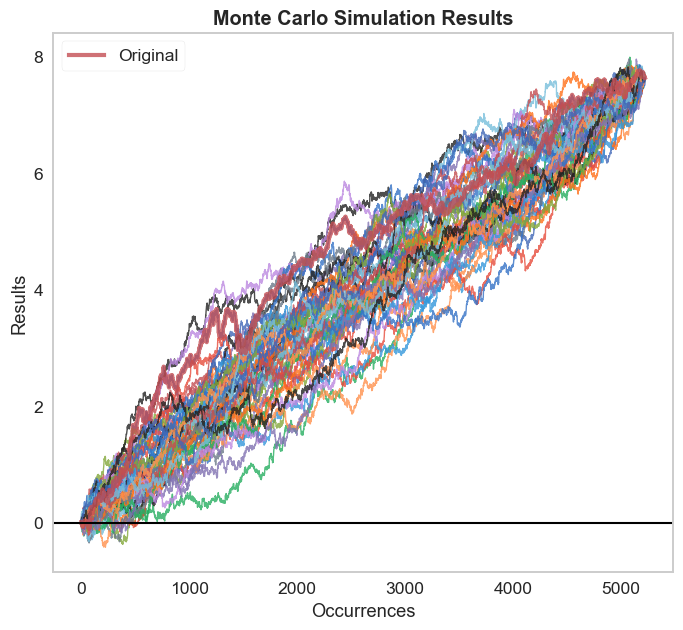

In [ ]:
import pandas_montecarlo
from pandas_datareader import data
returns.montecarlo(sims=50).plot()

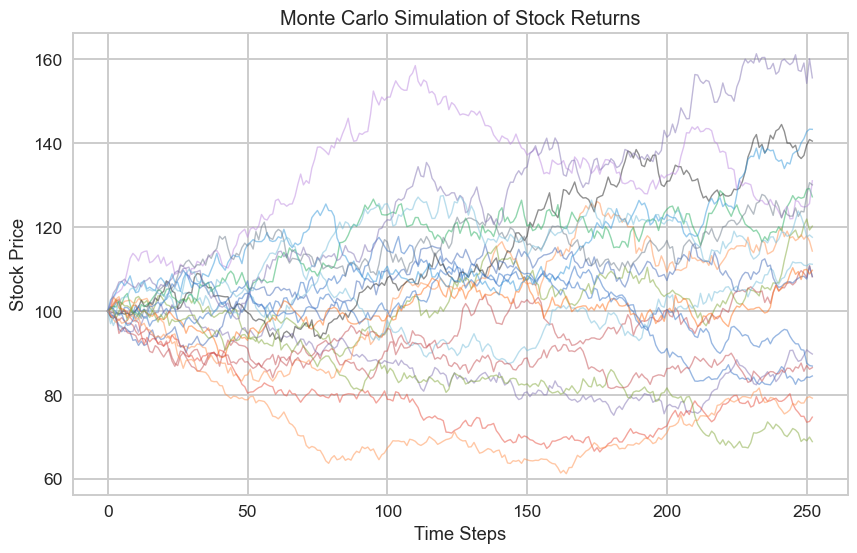

In [ ]:
#import numpy as np
#import pandas as pd
#import matplotlib.pyplot as plt

class MonteCarlo:
    def __init__(self, initial_price, drift, volatility, time_steps, num_simulations):
        self.initial_price = initial_price
        self.drift = drift
        self.volatility = volatility
        self.time_steps = time_steps
        self.num_simulations = num_simulations

    def monte_carlo_simulation(self):
        dt = 1.0 / self.time_steps
        returns = np.random.normal((self.drift * dt), (self.volatility * np.sqrt(dt)), size=(self.time_steps, self.num_simulations))
        price_paths = np.zeros((self.time_steps + 1, self.num_simulations))
        price_paths[0, :] = self.initial_price

        for i in range(1, self.time_steps + 1):
            price_paths[i, :] = price_paths[i - 1, :] * (1 + returns[i - 1, :])

        return price_paths

    def plot(self):
        simulated_price_paths = self.monte_carlo_simulation()

        plt.figure(figsize=(10, 6))
        for i in range(self.num_simulations):
            plt.plot(simulated_price_paths[:, i], lw=1, alpha=0.5)
        plt.xlabel('Time Steps')
        plt.ylabel('Stock Price')
        plt.title('Monte Carlo Simulation of Stock Returns')
        plt.grid(True)
        plt.show()

# Example usage:
initial_stock_price = 100.0
expected_return = 0.08  # 8% annual return
volatility = 0.2  # 20% annual volatility
num_time_steps = 252  # Trading days in a year (assuming 252 trading days)
num_simulations = 20

# Perform the Monte Carlo simulation and plot separate graphs
monte_carlo_instance = MonteCarlo(initial_stock_price, expected_return, volatility, num_time_steps, num_simulations)
monte_carlo_instance.plot()


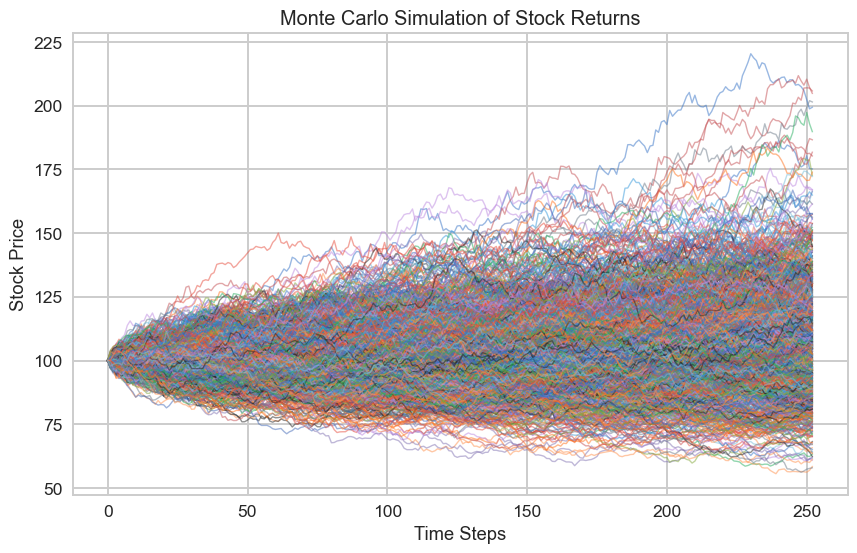

In [ ]:
#import numpy as np
#import matplotlib.pyplot as plt

def monte_carlo_simulation(initial_price, drift, volatility, time_steps, num_simulations):
    """
    Perform Monte Carlo simulation of stock returns.

    Parameters:
        initial_price (float): The initial stock price.
        drift (float): The expected annual return of the stock.
        volatility (float): The annual volatility of the stock.
        time_steps (int): The number of time steps (e.g., trading days) for the simulation.
        num_simulations (int): The number of simulations to run.

    Returns:
        np.ndarray: An array containing the simulated stock price paths.
    """
    dt = 1.0 / time_steps  # Time step (e.g., 1 trading day)
    returns = np.random.normal((drift * dt), (volatility * np.sqrt(dt)), size=(time_steps, num_simulations))
    price_paths = np.zeros((time_steps + 1, num_simulations))
    price_paths[0, :] = initial_price

    for i in range(1, time_steps + 1):
        price_paths[i, :] = price_paths[i - 1, :] * (1 + returns[i - 1, :])

    return price_paths

# Example usage:
initial_stock_price = 100.0
expected_return = 0.08  # 8% annual return
volatility = 0.2  # 20% annual volatility
num_time_steps = 252  # Trading days in a year (assuming 252 trading days)
num_simulations = 1000

# Perform the Monte Carlo simulation
simulated_price_paths = monte_carlo_simulation(initial_stock_price, expected_return, volatility, num_time_steps, num_simulations)

# Plot the simulated price paths
plt.figure(figsize=(10, 6))
for i in range(num_simulations):
    plt.plot(simulated_price_paths[:, i], lw=1, alpha=0.5)
plt.xlabel('Time Steps')
plt.ylabel('Stock Price')
plt.title('Monte Carlo Simulation of Stock Returns')
plt.grid(True)
plt.show()

In [ ]:
import pandas as pd
import numpy as np
import pandas_datareader as dr
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm
import deni_kit as erk
import scipy.stats
import seaborn as sns
import yfinance as yf
import trendet
from yahoofinancials import YahooFinancials
from yahoo_fin import stock_info as si
import csv
import matplotlib.ticker as mtick
import urllib
import os
import talib as ta
import investpy
from investpy import get_stock_historical_data
from statistics import *
#from statistics import mean
from unidecode import unidecode
import datetime
import string

###from mplfinance import candlestick2_ohlc
import matplotlib.dates as mdates
#import datetime
#import datetime
from matplotlib.dates import date2num

#for checking factorability
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity 
from factor_analyzer.factor_analyzer import calculate_kmo
from scipy.optimize import minimize #for solving optmization
from sklearn.linear_model import LinearRegression #for solving linear regression
import warnings
warnings.filterwarnings('ignore') #to suppress warning messages
import csv
from datetime import datetime, timedelta
from sklearn import cluster, covariance, manifold
from matplotlib.collections import LineCollection #for plotting purposes
import seaborn as sns
#from Graphical_Analysis_functionsimport *
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn import neighbors
from sklearn.model_selection import GridSearchCV
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.arima.model import ARIMA
scaler = MinMaxScaler(feature_range=(0, 1))
from keras.models import Sequential, load_model
from keras.layers import LSTM, Dense, Dropout

    #import fastbook
    # fastbook.setup_book()
    # import fastai
    # from fastai.tabular.all import *
    # from pmdarima.arima import auto_arima
        # from keras.models import Sequential
    # from keras.layers import Dense, Dropout, LSTM


# Plotly tools
import plotly.graph_objects as go
import plotly.offline as offline
from jupyterthemes import jtplot
offline.init_notebook_mode()
jtplot.style()
jtplot.style(theme=None, context='notebook', ticks=False, grid=False)
plt.close("all")
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
from plotly import tools
import plotly.tools as tls
import plotly.express as px
init_notebook_mode(connected=True)
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)
from jupyter_dash import JupyterDash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output

from jupyterthemes import jtplot
jtplot.style()
jtplot.style(theme=None, context='notebook', ticks=False, grid=False)
plt.close("all")

%load_ext autoreload
%autoreload 2
%matplotlib inline

In [ ]:
# Treemap S&P500
import numpy as np
import pandas as pd
import pickle

import matplotlib as mpl
import matplotlib.pylab as plt
import squarify
import seaborn as sns

from sklearn.preprocessing import RobustScaler

from numerize import numerize

#with open("data/sp500info_df.pickle", "rb") as f:
    #df = pickle.load(f)


In [ ]:

a = erk.summary_stats(returns, 0.02).sort_values(by = 'Annualized Return', ascending=False)
cm = sns.light_palette("seagreen", as_cmap=True, n_colors = 15)
cm1 = sns.light_palette("red", as_cmap=True, n_colors = 15, reverse = True)
(a.style.background_gradient(cmap=cm, subset=['Annualized Return','Sharpe Ratio'])
 .background_gradient(cmap=cm1, subset=['Max Drawdown'])
 .format({'Annualized Return': "{:.2%}"})
 .format({'Annualized Vol': "{:.2%}"})
 .format({'Cornish-Fisher VaR (5%)': "{:.2%}"})
 .format({'Historic CVaR (5%)': "{:.2%}"})
 .format({'Max Drawdown': "{:.2%}"})
 .applymap(erk.color_negative_red, subset=['Annualized Return','Sharpe Ratio'])
 #.set_table_styles({0: [{'selector': 'td:hover','props': [('font-size', '25px')]}]}, axis=1, overwrite=False)
 .set_table_styles([{'selector': 'tr:hover', 'props': [('background-color', 'lightblue')]}]))


 #df.print('Annualized Return')

ValueError: If using all scalar values, you must pass an index

# TREEMAP

In [ ]:
# 4.1. Visualize equities
#Import Nasdaq companies from web
# Takes over 4 minutes

# Get the unique values in the 'GICS Sector' column
nasdaq = pd.read_html('https://en.wikipedia.org/wiki/Nasdaq-100')[4] #from net
nasdaq_list = nasdaq['Ticker'].tolist()
# Convert sectors column into a List
sectors = nasdaq['GICS Sector'].unique()
list_of_nasdaq_subsectors = nasdaq['GICS Sub-Industry'].unique().tolist()

# Create an empty dictionary to store the ticker lists
nasdaq_lists = {}

# Iterate over the sectors
for sector in sectors:
    # Create a DataFrame for each sector
    sector_df = nasdaq.loc[nasdaq['GICS Sector'] == sector]
    # Get the ticker list for each sector
    sector_list = sector_df['Ticker'].tolist()
    # Add the ticker list to the dictionary
    nasdaq_lists[sector] = sector_list

# You can access the ticker lists for each sector using the keys in the dictionary
it_nasdaq_list = nasdaq_lists['Information Technology']
cd_nasdaq_list = nasdaq_lists['Consumer Discretionary']
cs_nasdaq_list = nasdaq_lists['Communication Services']
hc_nasdaq_list = nasdaq_lists['Health Care']
ind_nasdaq_list = nasdaq_lists['Industrials']
const_nasdaq_list = nasdaq_lists['Consumer Staples']
ut_nasdaq_list = nasdaq_lists['Utilities']

#get the last day return
ticker = nasdaq_list

start = '2008-01-01'
end = '2023-12-31'
# end = pd.to_datetime('today').normalize()
interval = '1d'
df = yf.download(ticker, start, end, interval)
price1 = df['Close']
volume = df['Volume']
# price1.drop(index=df.index[-1],axis=0,inplace=True) #drop the last day of the index futures
returns_d = price1.pct_change()#.dropna()
returns_w = (returns_d+1).resample('W').prod() - 1 
returns_m = (returns_d+1).resample('M').prod() - 1 
returns_a = (returns_d+1).resample('A').prod() - 1 

df1 = yf.download('NQ=F', start, end, interval)
price2 = df1['Close']
returns_nasdaq_d = price2.pct_change().dropna()
returns_nasdaq_a = (returns_nasdaq_d+1).resample('A').prod() - 1 

# price2.drop(index=price2.index[-1],axis=0,inplace=True) #drop the last day of the index futures
price = price1.copy()

price.fillna(price.median().round(2), inplace=True)

for i in price.columns:
    price[f'100D MA {i}'] = ta.SMA(price[i],100)
    price[f'Above 100D MA {i}'] = (price[i] > price[f'100D MA {i}'])
    price[f'Distance from 100D MA {i}'] = ((price[i] - price[f'100D MA {i}']) / price[f'100D MA {i}'])

cols_of_interest_100 = [col for col in price.columns if 'Above 100D' in col]
cols_for_average_distance = [col for col in price.columns if 'Distance from 100D MA' in col]

price['Count 100D'] = price[cols_of_interest_100].sum(axis=1)
price['% above 100D MA'] = price['Count 100D'] / len(ticker)
price['Average % above 100D MA'] = price['% above 100D MA'].mean()
price['Average % above 100D MA since 2015'] = price.loc['2015':]['% above 100D MA'].mean()
price['Average % above 100D MA since 2020'] = price.loc['2020':]['% above 100D MA'].mean()
price['Average distance from 100D MA'] = price[cols_for_average_distance].mean(axis=1)

#try this alrernative
tickers = nasdaq_list
shares_outstanding = {}
forward_pe = {}
for ticker in tickers:
    shares_outstanding[ticker] = pd.DataFrame(si.get_stats_valuation(ticker)).iloc[1,1]
    forward_pe[ticker] = pd.DataFrame(si.get_stats_valuation(ticker)).iloc[3,1]

# Function to convert marketCap values
def convert_market_cap(value):
    if 'B' in value:
        return float(value.replace('B', '')) * 1000000000
    elif 'M' in value:
        return float(value.replace('M', '')) * 1000000
    elif 'T' in value:
        return float(value.replace('T', '')) * 1000000000000
    else:
        return None

# Convert the values in the dictionary
converted_shares_outstanding = {ticker: convert_market_cap(value) for ticker, value in shares_outstanding.items()}

nasdaq_for_treemap = (pd.DataFrame(returns_d.tail(1))).T
nasdaq_for_treemap.reset_index(inplace = True)
nasdaq_for_treemap.rename(columns={"index":"Ticker"}, inplace = True)
nasdaq_for_treemap = nasdaq_for_treemap.rename(columns={nasdaq_for_treemap.columns[1]: 'Return'}) #Change the data to the latest
nasdaq_for_treemap = pd.merge(nasdaq_for_treemap, nasdaq, on = 'Ticker')

nasdaq_for_treemap_a = (pd.DataFrame(returns_a.tail(1))).T
nasdaq_for_treemap_a.reset_index(inplace = True)
nasdaq_for_treemap_a.rename(columns={"index":"Ticker"}, inplace = True)
nasdaq_for_treemap_a = nasdaq_for_treemap_a.rename(columns={nasdaq_for_treemap_a.columns[1]: 'YTD Return'}) #Change the data to the latest

nasdaq_prices_for_treemap = (pd.DataFrame(price1.tail(1))).T
nasdaq_prices_for_treemap.reset_index(inplace = True)
nasdaq_prices_for_treemap.rename(columns={"index":"Ticker"}, inplace = True)
nasdaq_prices_for_treemap = nasdaq_prices_for_treemap.rename(columns={nasdaq_prices_for_treemap.columns[1]: 'Price'}) #Change date

shares_outstanding = pd.DataFrame.from_dict(converted_shares_outstanding, orient='index', columns=['marketCap'])
shares_outstanding.reset_index(inplace = True)
shares_outstanding.columns = ['Ticker', 'marketCap']

forward_pe = pd.DataFrame.from_dict(forward_pe, orient='index', columns=['forwardPE'])
forward_pe.reset_index(inplace = True)
forward_pe.columns = ['Ticker', 'forwardPE']

nasdaq_for_treemap = pd.merge(nasdaq_for_treemap, nasdaq_for_treemap_a, on = 'Ticker')
nasdaq_for_treemap = pd.merge(nasdaq_for_treemap, shares_outstanding, on = 'Ticker')
nasdaq_for_treemap = pd.merge(nasdaq_for_treemap, forward_pe, on = 'Ticker')
nasdaq_for_treemap = pd.merge(nasdaq_for_treemap, nasdaq_prices_for_treemap, on = 'Ticker')

total_marketcap = nasdaq_for_treemap['marketCap'].sum()
nasdaq_for_treemap['Share in the index'] = nasdaq_for_treemap.apply(lambda x: (x['marketCap'] / total_marketcap) * 100 if x['marketCap'] != 0 else 0, axis=1)

nasdaq_for_treemap['forwardPE'] = nasdaq_for_treemap['forwardPE'].astype(float)

#Forward last price change treemap
fig = px.treemap(nasdaq_for_treemap, 
                 path=[px.Constant("Nasdaq"), 
                       nasdaq_for_treemap['GICS Sector'], 
                       # nasdaq_for_treemap['GICS Sub-Industry'],
                       nasdaq_for_treemap['Ticker'] + '<br>' + 
                       round(nasdaq_for_treemap['Price'], 3).apply(lambda x: f"${x}") + '<br>' + 
                       round(nasdaq_for_treemap['Return']*100, 2).apply(lambda x: f"{x}%") + '<br>' 
                       +
                      round(nasdaq_for_treemap['forwardPE'], 2).apply(lambda x: f"{x}") + 'X'
                      ], 
                 values='marketCap',
                 color=round(nasdaq_for_treemap['Return']*100,3), 
                 hover_data=['Ticker', round(nasdaq_for_treemap['Return']*100,3), round(nasdaq_for_treemap['Price'],3), 'marketCap', 'forwardPE'],
                 # color_continuous_scale=['#FF0000', "#CCCCCC", '#00FF00'],
                 color_continuous_scale=px.colors.diverging.RdYlGn,
                 # color_continuous_midpoint=0, 
                 color_continuous_midpoint=nasdaq_for_treemap['Return'].median(),
                 range_color=[-3, 3],
                 width=1300, height=900, title = 'Nasdaq last day')
fig.update_layout(margin=dict(t=30, l=20, r=20, b=20), font_size=18)
fig.update_traces(textposition="middle center", 
                  hovertemplate='<b>%{label} </b><br><br>Market Cap: %{value:$,.0f}<br>Last day return: %{color:,.2f}%')
fig.show()

[*********************100%%**********************]  101 of 101 completed


11 Failed downloads:
['WBD', 'AAPL', 'PYPL', 'MCHP', 'CPRT', 'ALGN', 'HON', 'CEG', 'WBA', 'AZN', 'CTAS']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2008-01-01 -> 2023-12-31)')


TypeError: Only valid with DatetimeIndex, TimedeltaIndex or PeriodIndex, but got an instance of 'Index'

# NASDAQ Preneseno

In [ ]:
# 4.1. Visualize equities
#Import Nasdaq companies from web

# Get the unique values in the 'GICS Sector' column
nasdaq = pd.read_html('https://en.wikipedia.org/wiki/Nasdaq-100')[4] #from net
nasdaq_list = nasdaq['Ticker'].tolist()
# Convert sectors column into a List
sectors = nasdaq['GICS Sector'].unique()
list_of_nasdaq_subsectors = nasdaq['GICS Sub-Industry'].unique().tolist()

# Create an empty dictionary to store the ticker lists
nasdaq_lists = {}

# Iterate over the sectors
for sector in sectors:
    # Create a DataFrame for each sector
    sector_df = nasdaq.loc[nasdaq['GICS Sector'] == sector]
    # Get the ticker list for each sector
    sector_list = sector_df['Ticker'].tolist()
    # Add the ticker list to the dictionary
    nasdaq_lists[sector] = sector_list

# You can access the ticker lists for each sector using the keys in the dictionary
it_nasdaq_list = nasdaq_lists['Information Technology']
cd_nasdaq_list = nasdaq_lists['Consumer Discretionary']
cs_nasdaq_list = nasdaq_lists['Communication Services']
hc_nasdaq_list = nasdaq_lists['Health Care']
ind_nasdaq_list = nasdaq_lists['Industrials']
const_nasdaq_list = nasdaq_lists['Consumer Staples']
ut_nasdaq_list = nasdaq_lists['Utilities']

In [ ]:
#get the last day return
ticker = nasdaq_list

start = '2008-01-01'
end = '2023-12-31'
# end = pd.to_datetime('today').normalize()
interval = '1d'
df = yf.download(ticker, start, end, interval)
price1 = df['Close']
volume = df['Volume']
# price1.drop(index=df.index[-1],axis=0,inplace=True) #drop the last day of the index futures
returns_d = price1.pct_change()#.dropna()
returns_w = (returns_d+1).resample('W').prod() - 1 
returns_m = (returns_d+1).resample('M').prod() - 1 
returns_a = (returns_d+1).resample('A').prod() - 1 

df1 = yf.download('NQ=F', start, end, interval)
price2 = df1['Close']
returns_nasdaq_d = price2.pct_change().dropna()
returns_nasdaq_a = (returns_nasdaq_d+1).resample('A').prod() - 1 

# price2.drop(index=price2.index[-1],axis=0,inplace=True) #drop the last day of the index futures
price = price1.copy()

In [ ]:
equity_tickers = ['SPY', 'DIA', 'QQQ', 'IJH', 'IJR', 'IWB', 'IWM', 'IWV', 'IVW', 'IJK', 'IJT','IVE','IJJ', 'IJS','DVY','RSP', 'FXB',
                'FXE', 'FXY', 'XLY','XLP', 'XLE', 'XLF', 'XLV', 'XLI', 'XLB','XLK', 'XLC','XLU','EWA', 'EWZ', 'EWC', 'ASHR', 'EWQ',
                'EWG','EWH','PIN',
                'EWI','EWJ','EWW', 'EWP','EIS', 'EWU','EFA','EEM','IOO','BKF','CWI','DBC','DBA','USO','UNG','GLD','SLV','SHY','IEF','TLT','AGG', 'BND','TIP']

In [ ]:
import matplotlib.ticker as mtick

price.fillna(price.median().round(2), inplace=True)

for i in price.columns:
    price[f'100D MA {i}'] = ta.SMA(price[i],100)
    price[f'Above 100D MA {i}'] = (price[i] > price[f'100D MA {i}'])
    price[f'Distance from 100D MA {i}'] = ((price[i] - price[f'100D MA {i}']) / price[f'100D MA {i}'])

cols_of_interest_100 = [col for col in price.columns if 'Above 100D' in col]
cols_for_average_distance = [col for col in price.columns if 'Distance from 100D MA' in col]

price['Count 100D'] = price[cols_of_interest_100].sum(axis=1)
price['% above 100D MA'] = price['Count 100D'] / len(ticker)
price['Average % above 100D MA'] = price['% above 100D MA'].mean()
price['Average % above 100D MA since 2015'] = price.loc['2015':]['% above 100D MA'].mean()
price['Average % above 100D MA since 2020'] = price.loc['2020':]['% above 100D MA'].mean()
price['Average distance from 100D MA'] = price[cols_for_average_distance].mean(axis=1)

jtplot.style()
jtplot.style(theme=None, context='notebook', ticks=False, grid=False)
plt.close("all")

date_start = '2008'
date_end = '2023'
price = pd.merge(price, price2, left_index=True, right_index=True)
y1 = price.loc[date_start:date_end]['% above 100D MA']
y2 = price.loc[date_start:date_end]['Close']
y3 = price.loc[date_start:date_end]['Average distance from 100D MA']
color1 = '#5e569b'
color2 = 'gray'#'yellowgreen'
color3 = '#22a7f0'

fig, axs = plt.subplots(2, 1, figsize=(12, 8), gridspec_kw={'height_ratios': [2, 0.6]}, sharex=True)
fig.subplots_adjust(hspace=0.1)

axs[0].plot(y2, color=color2, linewidth=1, label='Nasdaq')
axs[0].set_ylabel('Nasdaq', color=color2)
axs[0].tick_params(axis='y', labelcolor=color2)
formatter = mtick.StrMethodFormatter('{x:,.0f}')
axs[0].yaxis.set_major_formatter(formatter)

axs[1].plot(y1, color=color1, linewidth=0.6, label='% above 100D MA')
axs[1].set_ylabel('% above 100D MA', color=color1, fontsize = 10)
axs[1].tick_params(axis='y', labelcolor=color1)

axs[1].axhline(y1.mean(), color=color1, ls='--', linewidth=0.5)

if y1[-1] < (np.percentile(y1, 5, axis=0)):
    axs[0].annotate(f"1. % above 100D MA signal:                      Buy", xy=(.35, .97),xycoords='axes fraction', bbox=dict(boxstyle='round,pad=0.2', fc='lightgreen', alpha=0.3),fontsize=10, color = color1) 
elif y1[-1] > (np.percentile(y1, 95, axis=0)):
    axs[0].annotate(f"1. % above 100D MA signal:                      Sell", xy=(.35, .97),xycoords='axes fraction', bbox=dict(boxstyle='round,pad=0.2', fc='indianred', alpha=0.3),fontsize=10, color = color1)
else:
    axs[0].annotate(f"1. % above 100D MA signal:                      None", xy=(.35, .97),xycoords='axes fraction', bbox=dict(boxstyle='round,pad=0.2', fc='lightgray', alpha=0.3),fontsize=10, color = color1)
    
if y3[-1] < (np.percentile(y3, 5, axis=0)):
    axs[0].annotate(f"2. Average distance from 100D MA signal: Buy", xy=(.35, .93),xycoords='axes fraction', bbox=dict(boxstyle='round,pad=0.2', fc='lightgreen', alpha=0.3),fontsize=10, color = color3) 
elif y3[-1] > (np.percentile(y3, 95, axis=0)):
    axs[0].annotate(f"2. Average distance from 100D MA signal: Sell", xy=(.35, .93),xycoords='axes fraction', bbox=dict(boxstyle='round,pad=0.2', fc='indianred', alpha=0.3),fontsize=10, color = color3)
else:
    axs[0].annotate(f"2. Average distance from 100D MA signal: None", xy=(.35, .93),xycoords='axes fraction', bbox=dict(boxstyle='round,pad=0.2', fc='lightgray', alpha=0.3), fontsize=10, color = color3)

if ((sum(n < 0 for n in returns_d.iloc[-1].values.flatten())/returns_d.shape[1])*100) < 20:
    axs[0].annotate(f"3. % of stocks negative in last session:      {((sum(n < 0 for n in returns_d.iloc[-1].values.flatten())/returns_d.shape[1])*100).round(1)}%", xy=(.35, .89),xycoords='axes fraction', bbox=dict(boxstyle='round,pad=0.2', fc='lightgreen', alpha=0.3), fontsize=10, color = 'green')
elif ((sum(n < 0 for n in returns_d.iloc[-1].values.flatten())/returns_d.shape[1])*100) < 50:
    axs[0].annotate(f"3. % of stocks negative in last session:      {((sum(n < 0 for n in returns_d.iloc[-1].values.flatten())/returns_d.shape[1])*100).round(1)}%", xy=(.35, .89),xycoords='axes fraction', bbox=dict(boxstyle='round,pad=0.2', fc='lightgray', alpha=0.3), fontsize=10, color = 'gray')
else:
    axs[0].annotate(f"3. % of stocks negative in last session:      {((sum(n < 0 for n in returns_d.iloc[-1].values.flatten())/returns_d.shape[1])*100).round(1)}%", xy=(.35, .89),xycoords='axes fraction', bbox=dict(boxstyle='round,pad=0.2', fc='indianred', alpha=0.3), fontsize=10, color = 'indianred')
   
twinax = axs[1].twinx()
twinax.plot(y3, color=color3, linewidth=0.6, label='Avgerage distance from 100D MA')
twinax.set_ylabel('Avgerage distance\n from 100D MA', color=color3, fontsize = 10)
twinax.tick_params(axis='y', labelcolor=color3)

twinax.axhline(y3.mean(), color=color3, ls='--', linewidth=0.5)

# axs[0].axvspan(date2num(datetime(2020,2,1)), date2num(datetime(2020,4,1)), label="recession",color="gray", alpha=0.3)
# axs[1].axvspan(date2num(datetime(2020,2,1)), date2num(datetime(2020,4,1)), label="recession",color="gray", alpha=0.3)

# annotate with green scatter markers when y1 or y3 reach their 5th percentile value
y1_5th_percentile = np.percentile(y1, 10)
y3_5th_percentile = np.percentile(y3, 10)
green_markers = (y1 <= y1_5th_percentile) | (y3 <= y3_5th_percentile)
y2_at_markers = y2[y1[green_markers].index]
axs[0].scatter(y1[green_markers].index, y2_at_markers, color='green', s=10, label='5th percentile')
axs[1].scatter(y1[green_markers].index, y1[green_markers], color='green', s=10, label='5th percentile')
twinax.scatter(y3[green_markers].index, y3[green_markers], color='green', s=10, label='5th percentile')

# annotate with red scatter markers when y1 or y3 reach their 95th percentile value
y1_95th_percentile = np.percentile(y1, 90)
y3_95th_percentile = np.percentile(y3, 90)
red_markers = (y1 >= y1_95th_percentile) | (y3 >= y3_95th_percentile)
y2_at_markers = y2[y1[red_markers].index]
axs[0].scatter(y1[red_markers].index, y2_at_markers, color='red', s=10, label='95th percentile')
axs[1].scatter(y1[red_markers].index, y1[red_markers], color='red', s=10, label='95th percentile')
twinax.scatter(y3[red_markers].index, y3[red_markers], color='red', s=10, label='95th percentile')

## Alternative annotation for a signal at the last datapoint
# if green_markers.iloc[-1] == "True":
#     axs[0].annotate(f"Signal {y1.index[-1]}: Buy", xy=(.4, .94),xycoords='axes fraction', bbox=dict(boxstyle='round,pad=0.2', fc='green', alpha=0.3),fontsize=10, color = p1.get_color())
# elif green_markers.iloc[-1] == "False":
#     axs[0].annotate(f" Signal {y1.index[-1]}:Sell", xy=(.4, .94),xycoords='axes fraction', bbox=dict(boxstyle='round,pad=0.2', fc='indianred', alpha=0.3),fontsize=10, color = p1.get_color())
# else:
#     axs[0].annotate(f"Signal {y1.index[-1]}: No signal", xy=(.4, .94),xycoords='axes fraction', bbox=dict(boxstyle='round,pad=0.2', fc='gray', alpha=0.3),fontsize=10, color = 'Black')

# Add title and x-axis label
# fig.suptitle(f"Nasdaq from {date_start} to {date_end}\n by Deni Memic, CFA, PhD", fontsize = 10, color = 'gray')

fig.subplots_adjust(top=0.9)
fig.suptitle(f"Nasdaq from {date_start} to {date_end}\n by Deni Memic, CFA, PhD", fontsize = 12, color = 'gray', y = 1)
axs[1].set_xlabel('Date')

# Format x-axis tick labels
for ax in axs:
    ax.tick_params(axis='x', which='major', labelsize=10, rotation=45)

In [ ]:
# Group the stocks by GICS sector
tickers_by_sector = nasdaq.groupby('GICS Sector')['Ticker'].apply(list)

# Create a dictionary mapping sector names to sector abbreviations
sectors_dict = {'Communication Services': 'Comm.', 
                'Information Technology': 'IT', 
                'Consumer Discretionary': 'CD', 
                'Health Care': 'HC',
                'Utilities': 'Util.',
                'Energy': 'Energy',
                'Industrials': 'Indus.',
                'Consumer Staples': 'CS'}

# Get the tickers in the order of the sectors
sorted_tickers = []
for sector in tickers_by_sector.index:
    sorted_tickers.extend(tickers_by_sector[sector])

# Get the returns of the sorted tickers
returns_sector_sorted = returns_d[sorted_tickers]

# Calculate the correlation matrix
corr_matrix = returns_sector_sorted.corr()

fig, ax = plt.subplots(figsize=(10,10)) 
# Plot the correlation matrix using seaborn's heatmap function
sns.heatmap(corr_matrix, cmap='RdYlGn_r', center=0.3, linewidths=0.05, linecolor='white',)

# Add sector labels along the x and y axes
tick_locs = []
tick_labels = []
for i, sector in enumerate(tickers_by_sector.index):
    tick_locs.append((len(tickers_by_sector[sector]) / 2) + sum(len(tickers_by_sector[sect]) for sect in tickers_by_sector.index[:i]))
    tick_labels.append(f"{sector}")

plt.xticks(tick_locs, tick_labels, rotation=90, fontsize=6)
plt.yticks(tick_locs, tick_labels, rotation=0, fontsize=6)

# Add axis labels and a title
plt.xlabel('GICS Sector', fontsize=12)
plt.ylabel('GICS Sector', fontsize=12)
plt.title('Correlation Matrix Nasdaq')

# Show the plot
plt.show()

In [ ]:
import datetime
import pandas as pd
import matplotlib.pyplot as plt

# Define the start and end dates of each recession period
recession_periods = [(datetime.datetime(2020,2,1), datetime.datetime(2020,7,1)),
                     (datetime.datetime(2007,12,1), datetime.datetime(2009,6,1))]

# Define the colors for each sector
colors = {'Communication Services': 'tab:blue', 
          'Information Technology': 'tab:orange', 
          'Consumer Discretionary': 'tab:green', 
          'Health Care': 'tab:red',
          'Utilities': 'tab:purple',
          'Energy': 'tab:pink',
          'Industrials': 'tab:brown',
          'Consumer Staples': 'tab:gray'}

# Sort the stocks based on their sector
price1 = price[nasdaq.sort_values('GICS Sector')['Ticker']]

# Create the subplots
fig, axes = plt.subplots(21,5, figsize = (30,50))
axes = axes.flatten()

# Plot each feature
for idx, feature in enumerate(price.columns):
    # Determine the sector of the current feature
    sector = nasdaq.loc[nasdaq['Ticker'] == feature]['GICS Sector'].values[0]
    color = colors[sector]
    
    # Plot the data for the current feature
    axes[idx].plot(price1.index, price1[feature], color=color,linewidth = 0.8)
    
    # Set the title for the current subplot
    axes[idx].set_title(feature)
    
    # Add shaded areas for each recession period
    for period in recession_periods:
        axes[idx].axvspan(period[0], period[1], alpha=0.3, color='gray')

axes[-1].plot(price2, color = 'black', ls = '--', linewidth = 1)
axes[-1].axvspan(datetime.datetime(2020,2,1), datetime.datetime(2020,7,1), alpha=0.3, color='gray')
axes[-1].axvspan(datetime.datetime(2007,12,1), datetime.datetime(2009,6,1), alpha=0.3, color='gray')
axes[-1].set_title('Nasdaq Index')
      
# Add the source text and title
source_text = 'Data source: Yahoo Finance\nAuthor: Deni Memic (DeniLab)'
fig.text(0.1, -0.02, source_text, ha='left', fontsize=10, transform=fig.transFigure)
fig.suptitle('Nasdaq', fontsize=16, y=1)

# Adjust the layout and display the plot
plt.tight_layout()
plt.show()

In [ ]:
import datetime
import pandas as pd
import matplotlib.pyplot as plt

# Define the start and end dates of each recession period
recession_periods = [(datetime.datetime(2020,2,1), datetime.datetime(2020,7,1)),
                     (datetime.datetime(2007,12,1), datetime.datetime(2009,6,1))]

# Define the colors for each sector
colors = {'Communication Services': 'tab:blue', 
          'Information Technology': 'tab:orange', 
          'Consumer Discretionary': 'tab:green', 
          'Health Care': 'tab:red',
          'Utilities': 'tab:purple',
          'Energy': 'tab:pink',
          'Industrials': 'tab:brown',
          'Consumer Staples': 'tab:gray'}

# Sort the stocks based on their sector
# returns_d = returns_d[nasdaq.sort_values('GICS Sector')['Ticker']]
sorted_tickers = nasdaq.sort_values('GICS Sector')['Ticker']
returns_d = returns_d[sorted_tickers]

# Create the subplots
fig, axes = plt.subplots(21,5, figsize = (30,50), sharey=True)
axes = axes.flatten()

# Plot each feature
for idx, feature in enumerate(sorted_tickers): #price1.columns
    # Determine the sector of the current feature
    sector = nasdaq.loc[nasdaq['Ticker'] == feature]['GICS Sector'].values[0]
    color = colors[sector]
    
    # Plot the data for the current feature
    axes[idx].plot(returns_d.index, returns_d[feature], color=color,linewidth = 0.8)
    
    # Set the title for the current subplot
    axes[idx].set_title(feature)
    
    # Add shaded areas for each recession period
    for period in recession_periods:
        axes[idx].axvspan(period[0], period[1], alpha=0.3, color='gray')
        
axes[-1].plot(returns_nasdaq_d, color = 'black', ls = '--', linewidth = 1)
axes[-1].axvspan(datetime.datetime(2020,2,1), datetime.datetime(2020,7,1), alpha=0.3, color='gray')
axes[-1].axvspan(datetime.datetime(2007,12,1), datetime.datetime(2009,6,1), alpha=0.3, color='gray')

axes[-1].axvspan(datetime.datetime(2022,2,1), datetime.datetime(2023,12,1), alpha=0.3, color='gray') # Ne radi, by Nedim

axes[-1].set_title('Nasdaq Index')
      
# Add the source text and title
source_text = 'Data source: Yahoo Finance\nAuthor: Deni Memic (DeniLab)'
fig.text(0.1, -0.02, source_text, ha='left', fontsize=10, transform=fig.transFigure)
fig.suptitle('Nasdaq', fontsize=16, y=1)

# Adjust the layout and display the plot
plt.tight_layout()
plt.show()

In [ ]:
# 4.1. Visualize equities
#Import Nasdaq companies from web
# Takes over 4 minutes

# Get the unique values in the 'GICS Sector' column
nasdaq = pd.read_html('https://en.wikipedia.org/wiki/Nasdaq-100')[4] #from net
nasdaq_list = nasdaq['Ticker'].tolist()
# Convert sectors column into a List
sectors = nasdaq['GICS Sector'].unique()
list_of_nasdaq_subsectors = nasdaq['GICS Sub-Industry'].unique().tolist()

# Create an empty dictionary to store the ticker lists
nasdaq_lists = {}

# Iterate over the sectors
for sector in sectors:
    # Create a DataFrame for each sector
    sector_df = nasdaq.loc[nasdaq['GICS Sector'] == sector]
    # Get the ticker list for each sector
    sector_list = sector_df['Ticker'].tolist()
    # Add the ticker list to the dictionary
    nasdaq_lists[sector] = sector_list

# You can access the ticker lists for each sector using the keys in the dictionary
it_nasdaq_list = nasdaq_lists['Information Technology']
cd_nasdaq_list = nasdaq_lists['Consumer Discretionary']
cs_nasdaq_list = nasdaq_lists['Communication Services']
hc_nasdaq_list = nasdaq_lists['Health Care']
ind_nasdaq_list = nasdaq_lists['Industrials']
const_nasdaq_list = nasdaq_lists['Consumer Staples']
ut_nasdaq_list = nasdaq_lists['Utilities']

#get the last day return
ticker = nasdaq_list

start = '2008-01-01'
end = '2023-12-31'
# end = pd.to_datetime('today').normalize()
interval = '1d'
df = yf.download(ticker, start, end, interval)
price1 = df['Close']
volume = df['Volume']
# price1.drop(index=df.index[-1],axis=0,inplace=True) #drop the last day of the index futures
returns_d = price1.pct_change()#.dropna()
returns_w = (returns_d+1).resample('W').prod() - 1 
returns_m = (returns_d+1).resample('M').prod() - 1 
returns_a = (returns_d+1).resample('A').prod() - 1 

df1 = yf.download('NQ=F', start, end, interval)
price2 = df1['Close']
returns_nasdaq_d = price2.pct_change().dropna()
returns_nasdaq_a = (returns_nasdaq_d+1).resample('A').prod() - 1 

# price2.drop(index=price2.index[-1],axis=0,inplace=True) #drop the last day of the index futures
price = price1.copy()

price.fillna(price.median().round(2), inplace=True)

for i in price.columns:
    price[f'100D MA {i}'] = ta.SMA(price[i],100)
    price[f'Above 100D MA {i}'] = (price[i] > price[f'100D MA {i}'])
    price[f'Distance from 100D MA {i}'] = ((price[i] - price[f'100D MA {i}']) / price[f'100D MA {i}'])

cols_of_interest_100 = [col for col in price.columns if 'Above 100D' in col]
cols_for_average_distance = [col for col in price.columns if 'Distance from 100D MA' in col]

price['Count 100D'] = price[cols_of_interest_100].sum(axis=1)
price['% above 100D MA'] = price['Count 100D'] / len(ticker)
price['Average % above 100D MA'] = price['% above 100D MA'].mean()
price['Average % above 100D MA since 2015'] = price.loc['2015':]['% above 100D MA'].mean()
price['Average % above 100D MA since 2020'] = price.loc['2020':]['% above 100D MA'].mean()
price['Average distance from 100D MA'] = price[cols_for_average_distance].mean(axis=1)

#try this alrernative
tickers = nasdaq_list
shares_outstanding = {}
forward_pe = {}
for ticker in tickers:
    shares_outstanding[ticker] = pd.DataFrame(si.get_stats_valuation(ticker)).iloc[1,1]
    forward_pe[ticker] = pd.DataFrame(si.get_stats_valuation(ticker)).iloc[3,1]

# Function to convert marketCap values
def convert_market_cap(value):
    if 'B' in value:
        return float(value.replace('B', '')) * 1000000000
    elif 'M' in value:
        return float(value.replace('M', '')) * 1000000
    elif 'T' in value:
        return float(value.replace('T', '')) * 1000000000000
    else:
        return None

# Convert the values in the dictionary
converted_shares_outstanding = {ticker: convert_market_cap(value) for ticker, value in shares_outstanding.items()}

nasdaq_for_treemap = (pd.DataFrame(returns_d.tail(1))).T
nasdaq_for_treemap.reset_index(inplace = True)
nasdaq_for_treemap.rename(columns={"index":"Ticker"}, inplace = True)
nasdaq_for_treemap = nasdaq_for_treemap.rename(columns={nasdaq_for_treemap.columns[1]: 'Return'}) #Change the data to the latest
nasdaq_for_treemap = pd.merge(nasdaq_for_treemap, nasdaq, on = 'Ticker')

nasdaq_for_treemap_a = (pd.DataFrame(returns_a.tail(1))).T
nasdaq_for_treemap_a.reset_index(inplace = True)
nasdaq_for_treemap_a.rename(columns={"index":"Ticker"}, inplace = True)
nasdaq_for_treemap_a = nasdaq_for_treemap_a.rename(columns={nasdaq_for_treemap_a.columns[1]: 'YTD Return'}) #Change the data to the latest

nasdaq_prices_for_treemap = (pd.DataFrame(price1.tail(1))).T
nasdaq_prices_for_treemap.reset_index(inplace = True)
nasdaq_prices_for_treemap.rename(columns={"index":"Ticker"}, inplace = True)
nasdaq_prices_for_treemap = nasdaq_prices_for_treemap.rename(columns={nasdaq_prices_for_treemap.columns[1]: 'Price'}) #Change date

shares_outstanding = pd.DataFrame.from_dict(converted_shares_outstanding, orient='index', columns=['marketCap'])
shares_outstanding.reset_index(inplace = True)
shares_outstanding.columns = ['Ticker', 'marketCap']

forward_pe = pd.DataFrame.from_dict(forward_pe, orient='index', columns=['forwardPE'])
forward_pe.reset_index(inplace = True)
forward_pe.columns = ['Ticker', 'forwardPE']

nasdaq_for_treemap = pd.merge(nasdaq_for_treemap, nasdaq_for_treemap_a, on = 'Ticker')
nasdaq_for_treemap = pd.merge(nasdaq_for_treemap, shares_outstanding, on = 'Ticker')
nasdaq_for_treemap = pd.merge(nasdaq_for_treemap, forward_pe, on = 'Ticker')
nasdaq_for_treemap = pd.merge(nasdaq_for_treemap, nasdaq_prices_for_treemap, on = 'Ticker')

total_marketcap = nasdaq_for_treemap['marketCap'].sum()
nasdaq_for_treemap['Share in the index'] = nasdaq_for_treemap.apply(lambda x: (x['marketCap'] / total_marketcap) * 100 if x['marketCap'] != 0 else 0, axis=1)

nasdaq_for_treemap['forwardPE'] = nasdaq_for_treemap['forwardPE'].astype(float)

#Forward last price change treemap
fig = px.treemap(nasdaq_for_treemap, 
                 path=[px.Constant("Nasdaq"), 
                       nasdaq_for_treemap['GICS Sector'], 
                       # nasdaq_for_treemap['GICS Sub-Industry'],
                       nasdaq_for_treemap['Ticker'] + '<br>' + 
                       round(nasdaq_for_treemap['Price'], 3).apply(lambda x: f"${x}") + '<br>' + 
                       round(nasdaq_for_treemap['Return']*100, 2).apply(lambda x: f"{x}%") + '<br>' 
                       +
                      round(nasdaq_for_treemap['forwardPE'], 2).apply(lambda x: f"{x}") + 'X'
                      ], 
                 values='marketCap',
                 color=round(nasdaq_for_treemap['Return']*100,3), 
                 hover_data=['Ticker', round(nasdaq_for_treemap['Return']*100,3), round(nasdaq_for_treemap['Price'],3), 'marketCap', 'forwardPE'],
                 # color_continuous_scale=['#FF0000', "#CCCCCC", '#00FF00'],
                 color_continuous_scale=px.colors.diverging.RdYlGn,
                 # color_continuous_midpoint=0, 
                 color_continuous_midpoint=nasdaq_for_treemap['Return'].median(),
                 range_color=[-3, 3],
                 width=1300, height=900, title = 'Nasdaq last day')
fig.update_layout(margin=dict(t=30, l=20, r=20, b=20), font_size=18)
fig.update_traces(textposition="middle center", 
                  hovertemplate='<b>%{label} </b><br><br>Market Cap: %{value:$,.0f}<br>Last day return: %{color:,.2f}%')
fig.show()

# S&P500 Preneseno

In [ ]:
""""

The S&P 500 stock market index is maintained by S&P Dow Jones Indices. It comprises 503 common stocks which are issued by 500 large-cap companies traded on American stock exchanges
(including the 30 companies that compose the Dow Jones Industrial Average). The index includes about 80 percent of the American equity market by capitalization.
It is weighted by free-float market capitalization, so more valuable companies account for relatively more weight in the index.
The index constituents and the constituent weights are updated regularly using rules published by S&P Dow Jones Indices.
Although called the S&P 500, the index contains 503 stocks because it includes two share classes of stock from 3 of its component companies.

"""

In [ ]:
# Get SP500 companies
sp500 = pd.read_html('https://en.wikipedia.org/wiki/List_of_S%26P_500_companies')[0] #from net
sp500.at[64,'Symbol'] = 'BRK-B' # Corect the ticker 
sp500.at[80,'Symbol'] = 'BF-B'# Corect the ticker

# Drop rows with missing ticker symbols
sp500.dropna(subset=['Symbol'], inplace=True)


unique = sp500["GICS Sector"].unique()
ind = sp500.loc[sp500['GICS Sector'] == "Industrials"]
it = sp500.loc[sp500['GICS Sector'] == "Information Technology"]
hc = sp500.loc[sp500['GICS Sector'] == "Health Care"]
comm = sp500.loc[sp500['GICS Sector'] == "Communication Services"]
constap = sp500.loc[sp500['GICS Sector'] == "Consumer Staples"]
condis = sp500.loc[sp500['GICS Sector'] == "Consumer Discretionary"]
util = sp500.loc[sp500['GICS Sector'] == "Utilities"]
fin = sp500.loc[sp500['GICS Sector'] == "Financials"]
mat = sp500.loc[sp500['GICS Sector'] == "Materials"]
re = sp500.loc[sp500['GICS Sector'] == "Real Estate"]
ene = sp500.loc[sp500['GICS Sector'] == "Energy"]
sp500_list = sp500['Symbol'].tolist()
ind_list = ind['Symbol'].tolist()
it_list = it['Symbol'].tolist()
hc_list = hc['Symbol'].tolist()
comm_list = comm['Symbol'].tolist()
constap_list = constap['Symbol'].tolist()
condis_list = condis['Symbol'].tolist()
util_list = util['Symbol'].tolist()
fin_list = fin['Symbol'].tolist()
mat_list = mat['Symbol'].tolist()
re_list = re['Symbol'].tolist()
ene_list = ene['Symbol'].tolist()

In [ ]:
# Read the S&P 500 companies data from the Wikipedia page
sp500 = pd.read_html('https://en.wikipedia.org/wiki/List_of_S%26P_500_companies')[0]

# Correct the ticker symbols for BRK.B and BF.B
sp500.at[64, 'Symbol'] = 'BRK-B'
sp500.at[80, 'Symbol'] = 'BF-B'

# Drop rows with missing ticker symbols
sp500.dropna(subset=['Symbol'], inplace=True)

# Print the updated dataframe
print(sp500)

In [ ]:
#https://en.wikipedia.org/wiki/List_of_S%
#https://en.wikipedia.org/wiki/List_of_S%26P_500_companies
pd.read_html('https://en.wikipedia.org/wiki/List_of_S%26P_500_companies')[0]

In [ ]:
proba = pd.read_html('https://en.wikipedia.org/wiki/List_of_S%26P_500_companies')[-1] #from net
proba

In [ ]:
#get the last day return
#ticker = sp500_list
#ticker = ind_list 
#ticker = it_list 
ticker = hc_list 
# ticker = comm_list 
# ticker = constap_list 
# ticker = condis_list 
# ticker = util_list 
#ticker = fin_list
# ticker = mat_list 
# ticker = re_list 
# ticker = ene_list 

start = '2010-12-31'
end = '2023-12-31'

interval = '1d'
number_of_periods = 1

df = yf.download(ticker, start, end, interval)
price1 = df['Close']
returns_d = price1.pct_change().dropna()
returns_w = (returns_d+1).resample('W').prod() - 1 
returns_m = (returns_d+1).resample('M').prod() - 1 
returns_a = (returns_d+1).resample('A').prod() - 1 
a = (pd.DataFrame(returns_d.tail(number_of_periods))).T 
cm = sns.light_palette("seagreen", as_cmap=True, n_colors = 30)
cm1 = sns.light_palette("red", as_cmap=True, n_colors = 20, reverse = True)
(a.style.background_gradient(cmap=cm)
 .format("{:.2%}")
 .applymap(erk.color_negative_red)
 .set_table_styles([{'selector': 'tr:hover', 'props': [('background-color', 'lightblue')]}]))

# To get every single graph

#erk.deni_trading_signal_plot_multiple_tickers_cont(ticker, start, end, interval)
#erk.deni_trading_signal_table_multiple_tickers(ticker, start, end, interval).style.applymap(erk.color_signals_field)

In [ ]:
#get the last day return
#ticker = sp500_list
#ticker = ind_list 
#ticker = it_list 
ticker = hc_list 
# ticker = comm_list 
# ticker = constap_list 
# ticker = condis_list 
# ticker = util_list 
#ticker = fin_list
# ticker = mat_list 
# ticker = re_list 
# ticker = ene_list 

start = '2010-12-31'
end = '2023-12-31'

interval = '1d'
number_of_periods = 1

df = yf.download(ticker, start, end, interval)
price1 = df['Close']
returns_d = price1.pct_change().dropna()
returns_w = (returns_d+1).resample('W').prod() - 1 
returns_m = (returns_d+1).resample('M').prod() - 1 
returns_a = (returns_d+1).resample('A').prod() - 1 
a = (pd.DataFrame(returns_d.tail(number_of_periods))).T 
cm = sns.light_palette("seagreen", as_cmap=True, n_colors = 30)
cm1 = sns.light_palette("red", as_cmap=True, n_colors = 20, reverse = True)
(a.style.background_gradient(cmap=cm)
 .format("{:.2%}")
 .applymap(erk.color_negative_red)
 .set_table_styles([{'selector': 'tr:hover', 'props': [('background-color', 'lightblue')]}]))

# To get every single graph

#erk.deni_trading_signal_plot_multiple_tickers_cont(ticker, start, end, interval)
#erk.deni_trading_signal_table_multiple_tickers(ticker, start, end, interval).style.applymap(erk.color_signals_field)

In [ ]:
date_start = '2022-06-15'
date_end = '2023-12-31'
y1 = df1.loc[date_start:date_end]['% above 100D MA']
y2 = df1.loc[date_start:date_end] #price2
y3 = df1.loc[date_start:date_end]['Average distance from 100D MA']
color1 = 'g'#'#5e569b'
color2 = 'darkgray'
color3 = 'r'#'#22a7f0'

fig, ax = plt.subplots(figsize = (14,8), frameon=False, dpi=100)
fig.subplots_adjust(right=0.75)

twin1 = ax.twinx()
twin2 = ax.twinx()

twin2.spines.right.set_position(("axes", 1.1))

p1, = ax.plot(y1, color1, linewidth = 0.6, ls = '-', label = '% of S&P500 companies with price above 100D MA')
p2, = twin1.plot(y2, color2, linewidth = 2.5, label = 'SPY')
p3, = twin2.plot(y3, color3, linewidth = 0.6, label = 'Average distance from 100D MA')

# ax.axhline(np.percentile(y1, 95, axis=0), color = p1.get_color(), ls = '--', linewidth = 0.9)
# ax.axhline(np.percentile(y1, 5, axis=0), color = p1.get_color(), ls = '--', linewidth = 0.9)
ax.axhline(y1.mean(), color = p1.get_color(), ls = '--', linewidth = 0.5)

# twin2.axhline(np.percentile(y3, 95, axis=0), color = p3.get_color(), ls = '--', linewidth = 0.9)
# twin2.axhline(np.percentile(y3, 5, axis=0), color = p3.get_color(), ls = '--', linewidth = 0.9)
twin2.axhline(y3.mean(), color = p3.get_color(), ls = '--', linewidth = 0.5)

# ax.axvspan(date2num(datetime(2020,2,1)), date2num(datetime(2020,4,1)), label="recession",color="gray", alpha=0.3)
# ax.axvspan(date2num(datetime(2001,3,1)), date2num(datetime(2001,11,1)), color="indianred", alpha=0.3)
# ax.axvspan(date2num(datetime(2007,12,1)), date2num(datetime(2009,6,1)), color="gray", alpha=0.3)

# ax.scatter(price.index[-1], price.iloc[-1]['% above 100D MA'], marker = "*", color = p1.get_color(), alpha = 1, edgecolors= 'black', linewidths = 0.6, s = 200)
# twin1.scatter(price2.index[-1], price2.iloc[-1], marker = "*", color = p2.get_color(), alpha = 1, edgecolors= 'black', linewidths = 0.6, s = 200)
# twin2.scatter(price.index[-1], price.iloc[-1]['Average distance from 100D MA'], marker = "*", color = p3.get_color(), alpha = 1, edgecolors= 'black', linewidths = 0.6, s = 200)

ax.annotate(round(y1.iloc[-1],2), xy=(y1.index[-1], y1.iloc[-1]), color = p1.get_color(), bbox=dict(boxstyle='round,pad=0.2', fc= p1.get_color(), alpha=0.3), fontsize = 8)
twin1.annotate(round(y2.iloc[-1],1), xy=(y2.index[-1], y2.iloc[-1]), color = p2.get_color(), bbox=dict(boxstyle='round,pad=0.2', fc= p2.get_color(), alpha=0.3), fontsize = 8)
twin2.annotate(round(y3.iloc[-1],2), xy=(y3.index[-1], y3.iloc[-1]), color = p3.get_color(), bbox=dict(boxstyle='round,pad=0.2', fc= p3.get_color(), alpha=0.3), fontsize = 8)

twin1.fill_between(y2.index, y2.min(), y2, where = (y1<np.percentile(y1, 5, axis=0)), alpha=0.30, color = 'green', label = 'Buy area')
twin1.fill_between(y2.index, y2.min(), y2, where = (y1>np.percentile(y1, 95, axis=0)), alpha=0.30, color = 'red', label = 'Sell area')
twin1.fill_between(y2.index, y2.min(), y2, where = (y3<np.percentile(y3, 5, axis=0)), alpha=0.30, color = 'green', label = 'Buy area')
twin1.fill_between(y2.index, y2.min(), y2, where = (y3>np.percentile(y3, 95, axis=0)), alpha=0.30, color = 'red', label = 'Sell area')

if y1[-1] < (np.percentile(y1, 5, axis=0)):
    ax.annotate(f"1. % above 100D MA signal:                      Buy", xy=(.35, .97),xycoords='axes fraction', bbox=dict(boxstyle='round,pad=0.2', fc='lightgreen', alpha=0.3),fontsize=8, color = 'green') 
elif y1[-1] > (np.percentile(y1, 95, axis=0)):
    ax.annotate(f"1. % above 100D MA signal:                      Sell", xy=(.35, .97),xycoords='axes fraction', bbox=dict(boxstyle='round,pad=0.2', fc='indianred', alpha=0.3),fontsize=8, color = 'indianred')
else:
    ax.annotate(f"1. % above 100D MA signal:                      None", xy=(.35, .97),xycoords='axes fraction', bbox=dict(boxstyle='round,pad=0.2', fc='lightgray', alpha=0.3),fontsize=8, color = 'gray')
    
if y3[-1] < (np.percentile(y3, 5, axis=0)):
    ax.annotate(f"2. Average distance from 100D MA signal: Buy", xy=(.35, .93),xycoords='axes fraction', bbox=dict(boxstyle='round,pad=0.2', fc='lightgreen', alpha=0.3),fontsize=8, color = 'green') 
elif y3[-1] > (np.percentile(y3, 95, axis=0)):
    ax.annotate(f"2. Average distance from 100D MA signal: Sell", xy=(.35, .93),xycoords='axes fraction', bbox=dict(boxstyle='round,pad=0.2', fc='indianred', alpha=0.3),fontsize=8, color = 'indianred')
else:
    ax.annotate(f"2. Average distance from 100D MA signal: None", xy=(.35, .93),xycoords='axes fraction', bbox=dict(boxstyle='round,pad=0.2', fc='lightgray', alpha=0.3), fontsize=8, color = 'gray')

ax.set_xlabel("Year", fontsize = 11, color = p2.get_color())
ax.set_ylabel(p1.get_label(), fontsize = 11)
twin1.set_ylabel(p2.get_label(), fontsize = 11)
twin2.set_ylabel(p3.get_label(), fontsize = 11)

ax.yaxis.label.set_color(p1.get_color())
twin1.yaxis.label.set_color(p2.get_color())
twin2.yaxis.label.set_color(p3.get_color())
# twin2.set_ylim(ymin = -0.35, ymax = 0.2)

twin1.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.0f}'))
twin2.yaxis.set_major_formatter(mpl.ticker.StrMethodFormatter('{x:,.2f}'))

tkw = dict(size=4, width=1.5)
ax.tick_params(axis='y', colors=p1.get_color(), labelsize = 10, **tkw)
twin1.tick_params(axis='y', colors=p2.get_color(), labelsize = 10,**tkw)
twin2.tick_params(axis='y', colors=p3.get_color(), labelsize = 10,**tkw)
ax.tick_params(axis='x', colors=p2.get_color(), labelsize = 11, **tkw)
# plt.xlabel('Year',fontsize = 10)

# ax.spines['left'].set_color(p1.get_color())
# twin1.spines['right'].set_color(p2.get_color())
# twin2.spines['right'].set_color(p3.get_color())
# ax.spines['bottom'].set_color(color2)

plt.title(f"Chart by Deni Memic, CFA, PhD\ndata from YahooFinance!", fontsize = 10, color = 'gray')
ax.legend(handles=[p1, p2, p3], loc = 3, fontsize = 8)

plt.show()

# GET BETA STOCK

In [ ]:
# Get stock BETA

"""
The Volatility Index or VIX is the annualized implied volatility of a hypothetical S&P 500 stock option with 30 days to expiration.
The price of this option is based on the prices of near-term S&P 500 options traded on CBOE.
It can help investors estimate how much the S&P 500 Index will fluctuate in the next 30 days.
"""

stock_1 = returns['CL=F']
stock_2 = returns['^VIX']
x = np.array(stock_1).reshape(-1,1)
y = np.array(stock_2)

KeyError: 'CL=F'

In [ ]:
model = LinearRegression()
model.fit(x, y)
model = LinearRegression().fit(x, y)
r_sq = model.score(x, y)
print('coefficient of determination:', r_sq)
print('intercept', model.intercept_)
print('slope (beta):', model.coef_)

In [ ]:
df2

In [ ]:
returns2 = df2['Close'].pct_change().dropna()
returns2

In [ ]:
a = erk.summary_stats(returns2, 0.02).sort_values(by = 'Annualized Return', ascending=False)
cm = sns.light_palette("seagreen", as_cmap=True, n_colors = 15)
cm1 = sns.light_palette("red", as_cmap=True, n_colors = 15, reverse = True)
(a.style.background_gradient(cmap=cm, subset=['Annualized Return','Sharpe Ratio'])
 .background_gradient(cmap=cm1, subset=['Max Drawdown'])
 .format({'Annualized Return': "{:.2%}"})
 .format({'Annualized Vol': "{:.2%}"})
 .format({'Cornish-Fisher VaR (5%)': "{:.2%}"})
 .format({'Historic CVaR (5%)': "{:.2%}"})
 .format({'Max Drawdown': "{:.2%}"})
 .applymap(erk.color_negative_red, subset=['Annualized Return','Sharpe Ratio'])
 #.set_table_styles({0: [{'selector': 'td:hover','props': [('font-size', '25px')]}]}, axis=1, overwrite=False)
 .set_table_styles([{'selector': 'tr:hover', 'props': [('background-color', 'lightblue')]}]))

In [ ]:
# The price and a date of max value
print('Max exchange value and the date:')
#round(df1['2003-12-01':'2022-12-31']['Close'].max(), 4), df1['2003-12-01':'2022-12-31']['Close'].idxmax()
round(df2.Close.max(), 4), df2.Close.idxmax()

In [ ]:
# The price and a date of min value
print('Min exchange value and the date:')
#round(df1['2003-12-01':'2022-12-31']['Close'].min(), 4), df1['2003-12-01':'2022-12-31']['Close'].idxmin()
round(df2.Close.min(), 4), df2.Close.idxmin()

## Sentimental Analysis

In [ ]:
import newsapi # api key: c06644735d4a45a7be03f724ca228842
#from newsapi import get_everything
from newsapi.newsapi_client import NewsApiClient
from newsapi import NewsApiClient
from textblob import TextBlob
import GoogleNews as gn

import re

api_key = 'c06644735d4a45a7be03f724ca228842'

api = NewsApiClient(api_key='c06644735d4a45a7be03f724ca228842')

newsapi = NewsApiClient(api_key='c06644735d4a45a7be03f724ca228842')



import GoogleNews as gn
#import yahoo_news
from yahoo_fin import stock_info as si
from yahoo_fin import news
#from textblob import TextBlob

In [ ]:
symbol = 'AAPL'
news_items = news.get_yf_rss(symbol)

df = pd.DataFrame(news_items, columns=['title', 'summary', 'link'])
df['link'] = df['link'].apply(lambda x: f'<a href="{x}" target="_blank">Link</a>')
df['sentiment'] = df['summary'].apply(lambda x: TextBlob(x).sentiment.polarity)
df = df.sort_values(by='sentiment', ascending=False)  # sort by sentiment in descending order
df.index += 1  # start index from 1 instead of 0
df.index.name = 'No.'

# Set display options to show the full text and enable HTML rendering
pd.set_option('display.max_colwidth', None)
pd.set_option('display.html.use_mathjax', False)

# Define a formatting function to color negative sentiment red and positive sentiment green
def color_sentiment(val):
    if val < 0:
        color = 'red'
    elif val > 0:
        color = 'green'
    else:
        color = 'black'
    return f'color: {color}'

# Add a Total row to show the average sentiment score
total_sentiment = df['sentiment'].mean()
total_row = pd.DataFrame({
    'title': 'Total',
    'summary': '',
    'link': '',
    'sentiment': total_sentiment
}, index=[''])

# Concatenate the DataFrame with the Total row
df = pd.concat([df, total_row])

# Apply the formatting function to the sentiment column
# styled_df = df.style.applymap(color_sentiment, subset=['sentiment'])
styled_df = df.style.format({'sentiment': '{:.3f}'}).applymap(color_sentiment, subset=['sentiment'])  # format sentiment scores as numbers with 3 decimal places

# Render the table as HTML
html_table = styled_df.render(escape=False)

# Display the table in Jupyter notebook
from IPython.core.display import display, HTML
print(f'Hi Nedim. The Latest news for \033[1m\033[4m{symbol}\033[0m:')
display(HTML(html_table))

AttributeError: 'Styler' object has no attribute 'render'

In [ ]:
category='business'
language='en'
holdings = ['C', 'META', 'QCOM', 'VSCO', 'QUAL'] # define the list of holdings to search for

news_items = newsapi.get_everything(
    q=category, #bbc-news, 
    qintitle=None,
    sources=None,
    domains=None,
    exclude_domains=None,
    from_param=None,
    to=None,
    language=language,
    sort_by=None,
    page=None,
    page_size=None,
)

# create a DataFrame with the article data
df = pd.DataFrame(news_items['articles'], columns=['source', 'title', 'description', 'url'])
df['source'] = df['source'].apply(lambda x: x['name'])  # extract only the source name
df['url'] = df['url'].apply(lambda x: f'<a href="{x}" target="_blank">Link</a>')
df['description'] = df['description'].fillna('')
df['sentiment'] = df['description'].apply(lambda x: round(TextBlob(x).sentiment.polarity, 3))  # round sentiment scores to 3 decimal places
df = df.sort_values(by='sentiment', ascending=False)  # sort by sentiment in descending order
df.index += 1
df.index.name = 'No.'

# define a formatting function to color negative sentiment red and positive sentiment green
def color_sentiment(val):
    if val < 0:
        color = 'red'
    elif val > 0:
        color = 'green'
    else:
        color = 'black'
    return f'color: {color}'

# define a function to highlight the holdings in the title or description
def highlight_holdings(val):
    for holding in holdings:
        if re.search(r'\b{}\b'.format(holding), val, re.IGNORECASE):
            return 'background-color: lightgreen'
    return ''

# apply the formatting functions to the sentiment and title/description columns
styled_df = df.style.format({'sentiment': '{:.3f}'}).applymap(color_sentiment, subset=['sentiment']).applymap(highlight_holdings, subset=['title', 'description'])

# add a total row to show the average sentiment score
total_sentiment = df['sentiment'].mean()
total_row = pd.DataFrame({
    'source': 'Total',
    'title': '',
    'description': '',
    'url': '',
    'sentiment': round(total_sentiment, 3)  # round total sentiment score to 3 decimal places
}, index=[''])

# concatenate the DataFrame with the total row
df = pd.concat([df, total_row])

# render the table as HTML
html_table = styled_df.render(escape=False)

# display the table in Jupyter notebook
from IPython.core.display import display, HTML
print(f'Hi Nedim. Here are the latest \033[1m\033[4m{category}\033[0m news in \033[1m\033[4m{language}\033[0m language, with highlights to my holdings:')
display(HTML(html_table))

AttributeError: 'Styler' object has no attribute 'render'

In [ ]:
category='business'
language='en'
holdings = ['C', 'META', 'QCOM', 'VSCO', 'QUAL'] # define the list of holdings to search for


news_items = newsapi.get_everything(
    q=category, #bbc-news, 
    qintitle=None,
    sources=None,
    domains=None,
    exclude_domains=None,
    from_param=None,
    to=None,
    language=language,
    sort_by=None,
    page=None,
    page_size=None,
)

# create a DataFrame with the article data
df = pd.DataFrame(news_items['articles'], columns=['source', 'title', 'description', 'url'])
df['source'] = df['source'].apply(lambda x: x['name'])  # extract only the source name
df['url'] = df['url'].apply(lambda x: f'<a href="{x}" target="_blank">Link</a>')
df['description'] = df['description'].fillna('')
df['sentiment'] = df['description'].apply(lambda x: round(TextBlob(x).sentiment.polarity, 3))  # round sentiment scores to 3 decimal places
df = df.sort_values(by='sentiment', ascending=False)  # sort by sentiment in descending order
df.index += 1
df.index.name = 'No.'

# define a formatting function to color negative sentiment red and positive sentiment green
def color_sentiment(val):
    if val < 0:
        color = 'red'
    elif val > 0:
        color = 'green'
    else:
        color = 'black'
    return f'color: {color}'

# define a function to highlight the holdings in the title or description
def highlight_holdings(val):
    for holding in holdings:
        if re.search(r'\b{}\b'.format(holding), val, re.IGNORECASE):
            return 'background-color: lightgreen'
    return ''

# apply the formatting functions to the sentiment and title/description columns
styled_df = df.style.format({'sentiment': '{:.3f}'}).applymap(color_sentiment, subset=['sentiment']).applymap(highlight_holdings, subset=['title', 'description'])

# add a total row to show the average sentiment score
total_sentiment = df['sentiment'].mean()
total_row = pd.DataFrame({
    'source': 'Total',
    'title': '',
    'description': '',
    'url': '',
    'sentiment': round(total_sentiment, 3)  # round total sentiment score to 3 decimal places
}, index=[''])

# concatenate the DataFrame with the total row
df = pd.concat([df, total_row])

# render the table as HTML
html_table = styled_df.render(escape=False)

# display the table in Jupyter notebook
from IPython.core.display import display, HTML
print(f'Latest \033[1m\033[4m{category}\033[0m news in \033[1m\033[4m{language}\033[0m language, with highlights to my holdings:')
display(HTML(html_table))


AttributeError: 'Styler' object has no attribute 'render'

In [ ]:
api.get_everything(q='AAPL')

{'status': 'ok',
 'totalResults': 1086,
 'articles': [{'source': {'id': 'business-insider',
    'name': 'Business Insider'},
   'author': 'Zahra Tayeb',
   'title': 'A 40% rout in Apple bonds is signaling trouble for bank balance sheets with big debt holdings, markets guru Larry McDonald says',
   'description': 'Larry McDonald suggested that if Apple can take a hit for higher interest rates, mortgage-backed debt would likely see a sizeable write down too as mortgage rates jump.',
   'url': 'https://markets.businessinsider.com/news/bonds/mortgage-backed-securities-apple-bond-banks-balance-sheets-larry-mcdonald-2023-8',
   'urlToImage': 'https://i.insider.com/6467428f63c86a0018ccdfb5?width=1200&format=jpeg',
   'publishedAt': '2023-08-24T11:41:54Z',
   'content': "Larry McDonald.Larry McDonald/The Bear Traps Report\r\n<ul>\n<li>A 40% plunge in Apple's bonds highlights the risks facing banks' debt portfolios, according to Larry McDonald.\xa0</li>\n<li>The markets guru… [+2260 chars]"},
 

In [ ]:
api.get_sources()

{'status': 'ok',
 'sources': [{'id': 'abc-news',
   'name': 'ABC News',
   'description': 'Your trusted source for breaking news, analysis, exclusive interviews, headlines, and videos at ABCNews.com.',
   'url': 'https://abcnews.go.com',
   'category': 'general',
   'language': 'en',
   'country': 'us'},
  {'id': 'abc-news-au',
   'name': 'ABC News (AU)',
   'description': "Australia's most trusted source of local, national and world news. Comprehensive, independent, in-depth analysis, the latest business, sport, weather and more.",
   'url': 'http://www.abc.net.au/news',
   'category': 'general',
   'language': 'en',
   'country': 'au'},
  {'id': 'aftenposten',
   'name': 'Aftenposten',
   'description': 'Norges ledende nettavis med alltid oppdaterte nyheter innenfor innenriks, utenriks, sport og kultur.',
   'url': 'https://www.aftenposten.no',
   'category': 'general',
   'language': 'no',
   'country': 'no'},
  {'id': 'al-jazeera-english',
   'name': 'Al Jazeera English',
   'descr

In [ ]:
api.get_top_headlines(sources='bbc-news')

{'status': 'ok',
 'totalResults': 10,
 'articles': [{'source': {'id': 'bbc-news', 'name': 'BBC News'},
   'author': 'BBC News',
   'title': "Selena Gomez: Huge Instagram following is 'a big responsibility'",
   'description': 'The actress and singer became the most-followed woman on Instagram earlier this year.',
   'url': 'http://www.bbc.co.uk/news/newsbeat-66865026',
   'urlToImage': 'https://ichef.bbci.co.uk/news/1024/branded_news/6AED/production/_131137372_gettyimages-1676993616.jpg',
   'publishedAt': '2023-09-20T10:22:23.466945Z',
   'content': 'Selena Gomez has said being the most-followed woman on Instagram is "a big responsibility".\r\nThe actress and singer says she\'s "never really cared" about numbers but that "it can be a little heavy".\r… [+2107 chars]'},
  {'source': {'id': 'bbc-news', 'name': 'BBC News'},
   'author': 'BBC News',
   'title': 'Nagorno-Karabakh forces agree Azerbaijan demand to disarm',
   'description': 'Twenty-four hours into an Azerbaijan army offensiv

In [ ]:
symbol = 'LIN'
news_items = news.get_yf_rss(symbol)

df = pd.DataFrame(news_items, columns=['title', 'summary', 'link'])
df['link'] = df['link'].apply(lambda x: f'<a href="{x}" target="_blank">Link</a>')
df['sentiment'] = df['summary'].apply(lambda x: TextBlob(x).sentiment.polarity)
df = df.sort_values(by='sentiment', ascending=False)  # sort by sentiment in descending order
df.index += 1  # start index from 1 instead of 0
df.index.name = 'No.'

# Set display options to show the full text and enable HTML rendering
pd.set_option('display.max_colwidth', None)
pd.set_option('display.html.use_mathjax', False)

# Define a formatting function to color negative sentiment red and positive sentiment green
def color_sentiment(val):
    if val < 0:
        color = 'red'
    elif val > 0:
        color = 'green'
    else:
        color = 'black'
    return f'color: {color}'

# Add a Total row to show the average sentiment score
total_sentiment = df['sentiment'].mean()
total_row = pd.DataFrame({
    'title': 'Total',
    'summary': '',
    'link': '',
    'sentiment': total_sentiment
}, index=[''])

# Concatenate the DataFrame with the Total row
df = pd.concat([df, total_row])

# Apply the formatting function to the sentiment column
# styled_df = df.style.applymap(color_sentiment, subset=['sentiment'])
styled_df = df.style.format({'sentiment': '{:.3f}'}).applymap(color_sentiment, subset=['sentiment'])  # format sentiment scores as numbers with 3 decimal places

# Render the table as HTML
html_table = styled_df.render(escape=False)

# Display the table in Jupyter notebook
from IPython.core.display import display, HTML
print(f'Latest news for \033[1m\033[4m{symbol}\033[0m:')
display(HTML(html_table))

AttributeError: 'Styler' object has no attribute 'render'